File: D:\AlgoT\yfinanceData\DIVISLAB.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (136, Timestamp('2023-07-21 00:00:00'), 3747.0), Head: (147, Timestamp('2023-08-07 00:00:00'), 3920.0), Right Shoulder: (158, Timestamp('2023-08-23 00:00:00'), 3728.800048828125), Neckline Level: 3577.050048828125


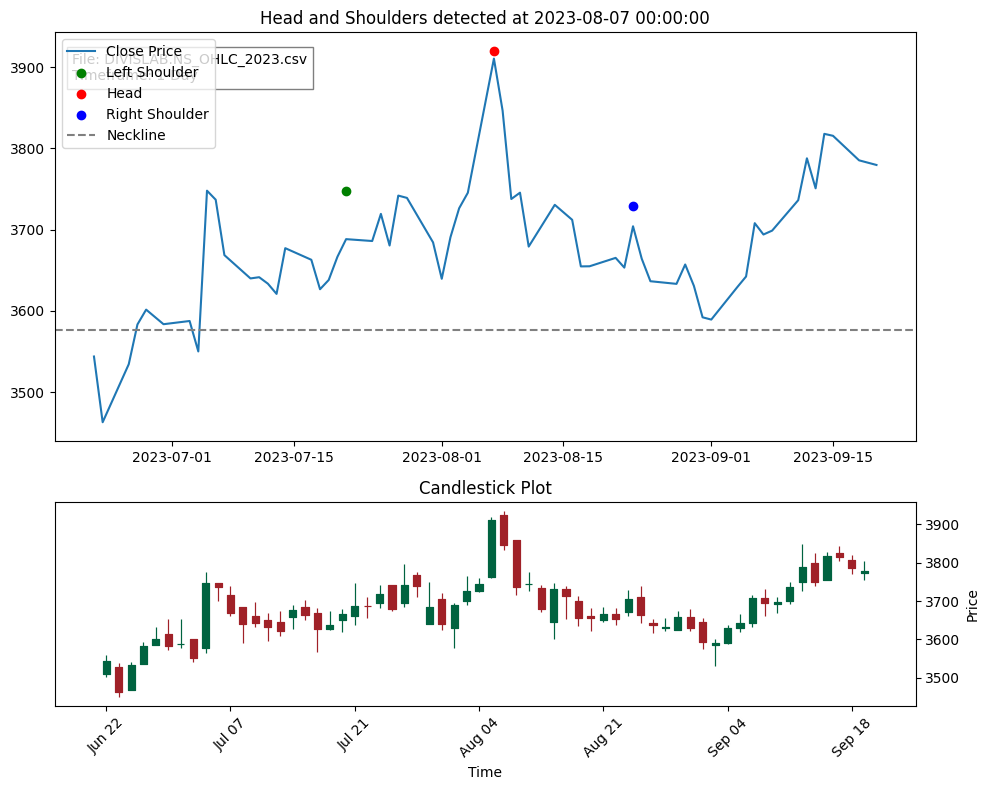

Skipping D:\AlgoT\yfinanceData\HDFC.NS_OHLC_2023.csv: Empty or missing 'Close' data.
File: D:\AlgoT\yfinanceData\MARUTI.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (104, Timestamp('2023-06-06 00:00:00'), 9770.0), Head: (124, Timestamp('2023-07-05 00:00:00'), 10036.9501953125), Right Shoulder: (142, Timestamp('2023-07-31 00:00:00'), 9837.7001953125), Neckline Level: 9300.0


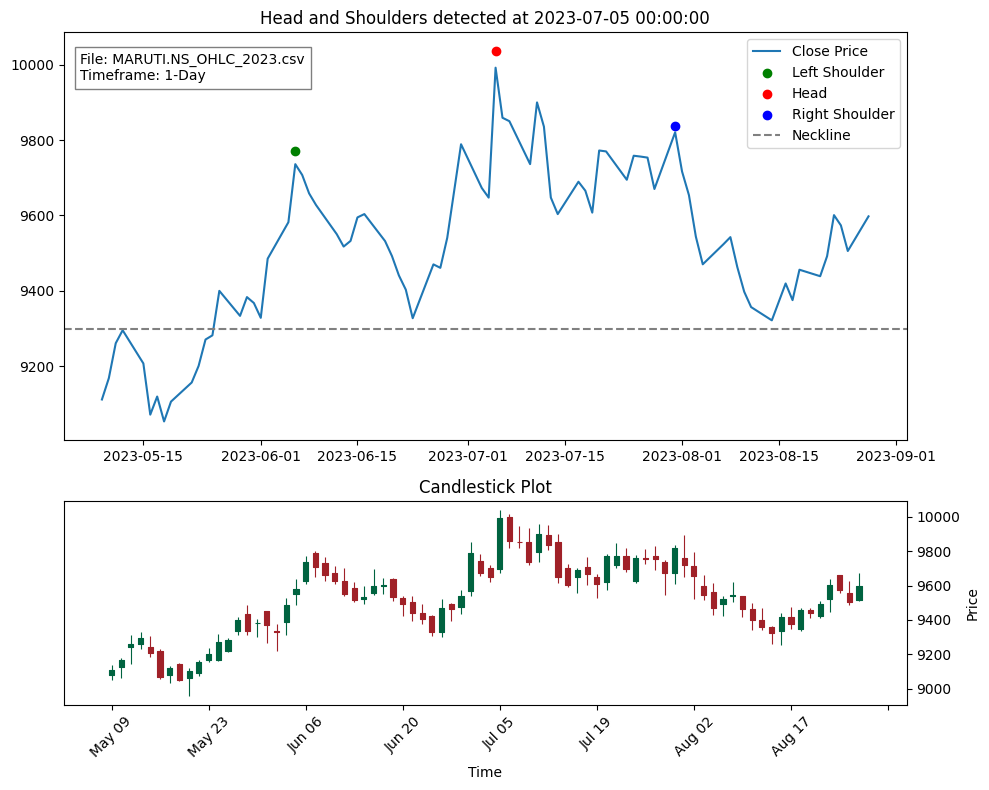

File: D:\AlgoT\yfinanceData\SUNPHARMA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (173, Timestamp('2023-09-13 00:00:00'), 1156.699951171875), Head: (184, Timestamp('2023-09-29 00:00:00'), 1167.4000244140625), Right Shoulder: (196, Timestamp('2023-10-18 00:00:00'), 1161.800048828125), Neckline Level: 1109.0


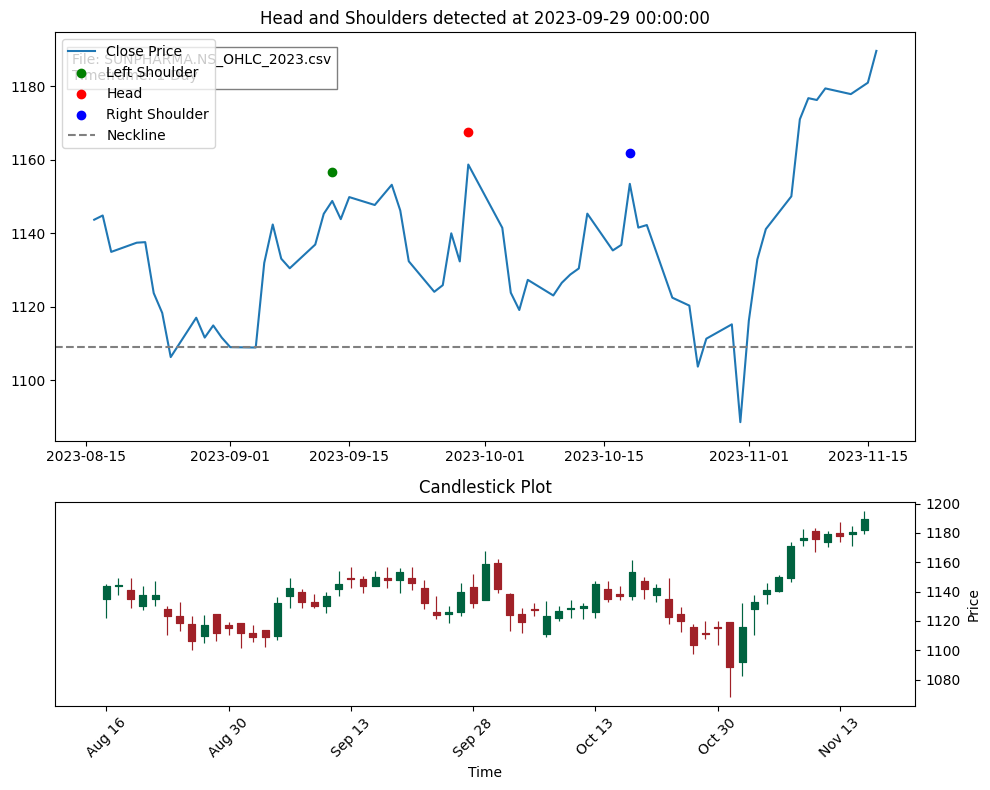

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils
import os
import glob

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, troughs, data):
    patterns = []
    
    # Detect regular head and shoulders
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is higher than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Identify low prices around the head
            head_idx = head[0]
            low_prices_around_head = data['Low'][head_idx-10:head_idx+11]  # Adjust range as needed
            
            # Choose the minimum low price as the neckline
            neckline_level = low_prices_around_head.min()
            
            # Calculate the size of the head (max - min price)
            head_size = data['High'][head_idx] - data['Low'][head_idx]
            
            # Check if the market falls more than the size of the head before the next shoulder forms
            pre_right_shoulder_low = data['Low'][head_idx+1:right_shoulder[0]].min()
            if pre_right_shoulder_low < data['Low'][head_idx] - head_size:
                continue
            
            patterns.append({
                'type': 'Head and Shoulders',
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    
    # Detect inverse head and shoulders
    for i in range(1, len(troughs) - 1):
        left_shoulder = troughs[i-1]
        head = troughs[i]
        right_shoulder = troughs[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is lower than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] > head[2] and right_shoulder[2] > head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Identify high prices around the head
            head_idx = head[0]
            high_prices_around_head = data['High'][head_idx-10:head_idx+11]  # Adjust range as needed
            
            # Choose the maximum high price as the neckline
            neckline_level = high_prices_around_head.max()
            
            # Calculate the size of the head (min - max price)
            head_size = data['Low'][head_idx] - data['High'][head_idx]
            
            # Check if the market rises more than the size of the head before the next shoulder forms
            pre_right_shoulder_high = data['High'][head_idx+1:right_shoulder[0]].max()
            if pre_right_shoulder_high > data['High'][head_idx] + head_size:
                continue
            
            patterns.append({
                'type': 'Inverse Head and Shoulders',
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'neckline_level': neckline_level
            })
    
    return patterns

# Function to process a single CSV file
def process_csv_file(file_path):
    data = pd.read_csv(file_path)
    if data.empty or 'Close' not in data.columns:
        print(f"Skipping {file_path}: Empty or missing 'Close' data.")
        return
    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index('Date', inplace=True)
    
    
    timeframes = {'1-Day': data, }

    for timeframe, resampled_data in timeframes.items():
        # Find peaks and troughs in the data
        peaks, troughs = find_peaks_and_troughs(resampled_data)
        
        # Detect Head and Shoulders patterns
        patterns = detect_head_and_shoulders(peaks, troughs, resampled_data)
        
        # Display detected patterns and plot the chart for each pattern
        for pattern in patterns:
            print(f"File: {file_path}, Timeframe: {timeframe}, Type: {pattern['type']}")
            print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}, Neckline Level: {pattern['neckline_level']}")
            
            start_index = max(0, pattern['left_shoulder'][0] - 20)
            end_index = min(len(resampled_data) - 1, pattern['right_shoulder'][0] + 20)
            pattern_data = resampled_data.iloc[start_index:end_index]
            
            # Setup figure and subplots
            fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})
            
            # First subplot for the pattern
            ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
            if pattern['type'] == 'Head and Shoulders':
                ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
                ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
                ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
                ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
                ax.set_title(f"{pattern['type']} detected at {pattern['head'][1]}")
            else:
                ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='purple', label='Left Shoulder')
                ax.scatter(pattern['head'][1], pattern['head'][2], color='orange', label='Head')
                ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='cyan', label='Right Shoulder')
                ax.axhline(y=pattern['neckline_level'], color='gray', linestyle='--', label='Neckline')
                ax.set_title(f"{pattern['type']} detected at {pattern['head'][1]}")
            ax.legend()
            
            # Add file name and timeframe text
            ax.text(0.02, 0.95, f'File: {os.path.basename(file_path)}\nTimeframe: {timeframe}', transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
            
            # Second subplot for candlestick
            mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
            ax2.set_xlabel('Time')
            ax2.set_ylabel('Price')
            ax2.set_title('Candlestick Plot')
            
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

# Main function to process all CSV files in a directory
def process_all_csv_files_in_directory(directory_path):
    csv_files = glob.glob(os.path.join(directory_path, "*.csv"))
    
    for file_path in csv_files:
        process_csv_file(file_path)

# Example usage
directory_path = r"D:\AlgoT\yfinanceData"
process_all_csv_files_in_directory(directory_path)


File: D:\AlgoT\yfinanceData\BAJAJFINSV.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (180, Timestamp('2023-09-25 00:00:00'), 1591.0), Head: (195, Timestamp('2023-10-17 00:00:00'), 1676.75), Right Shoulder: (206, Timestamp('2023-11-02 00:00:00'), 1592.5999755859375)


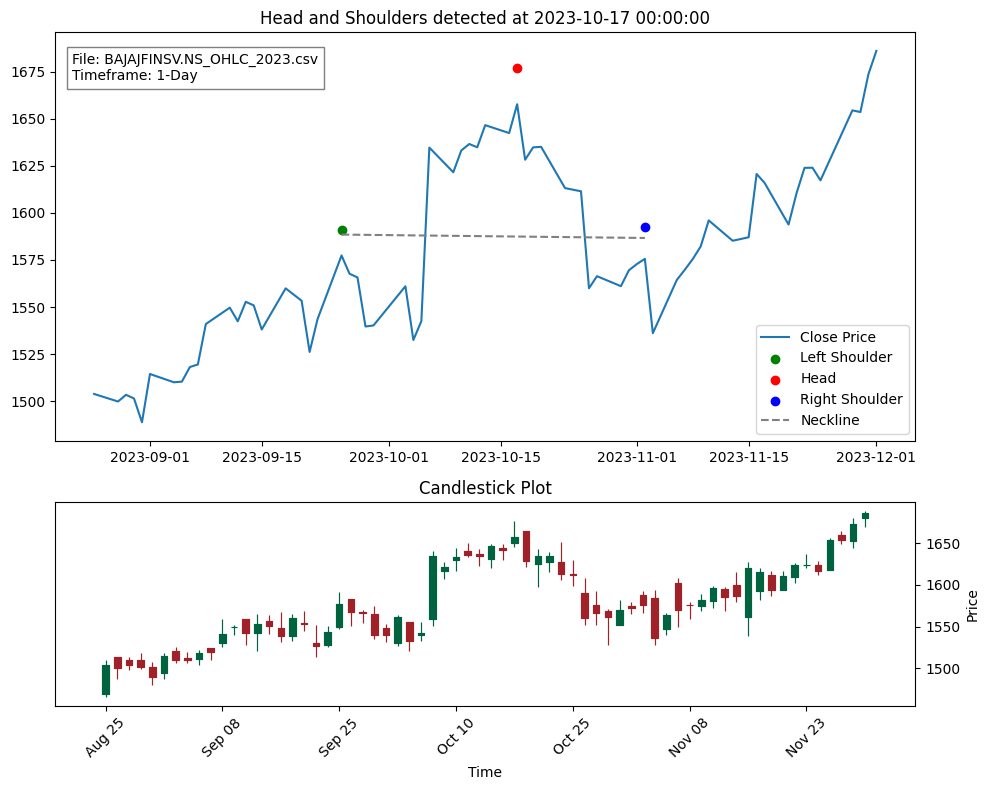

File: D:\AlgoT\yfinanceData\BPCL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (88, Timestamp('2023-05-15 00:00:00'), 178.1750030517578), Head: (104, Timestamp('2023-06-06 00:00:00'), 177.3000030517578), Right Shoulder: (118, Timestamp('2023-06-26 00:00:00'), 177.8249969482422)


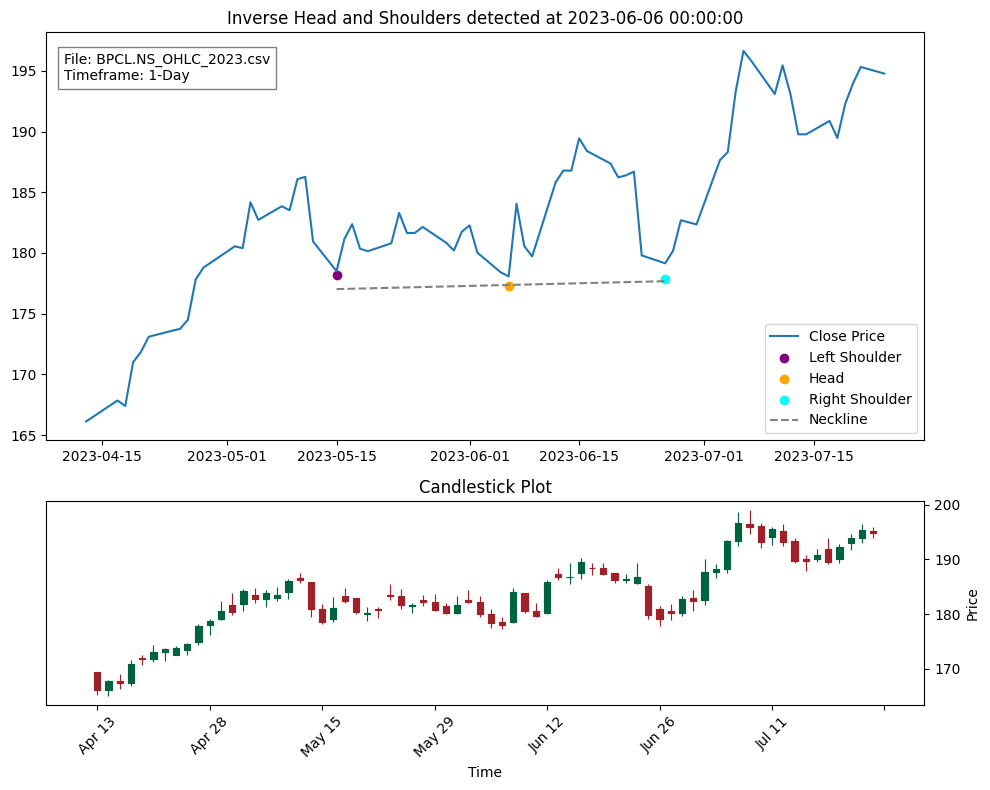

File: D:\AlgoT\yfinanceData\BPCL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (152, Timestamp('2023-08-14 00:00:00'), 175.64999389648438), Head: (164, Timestamp('2023-08-31 00:00:00'), 169.5500030517578), Right Shoulder: (175, Timestamp('2023-09-15 00:00:00'), 175.625)


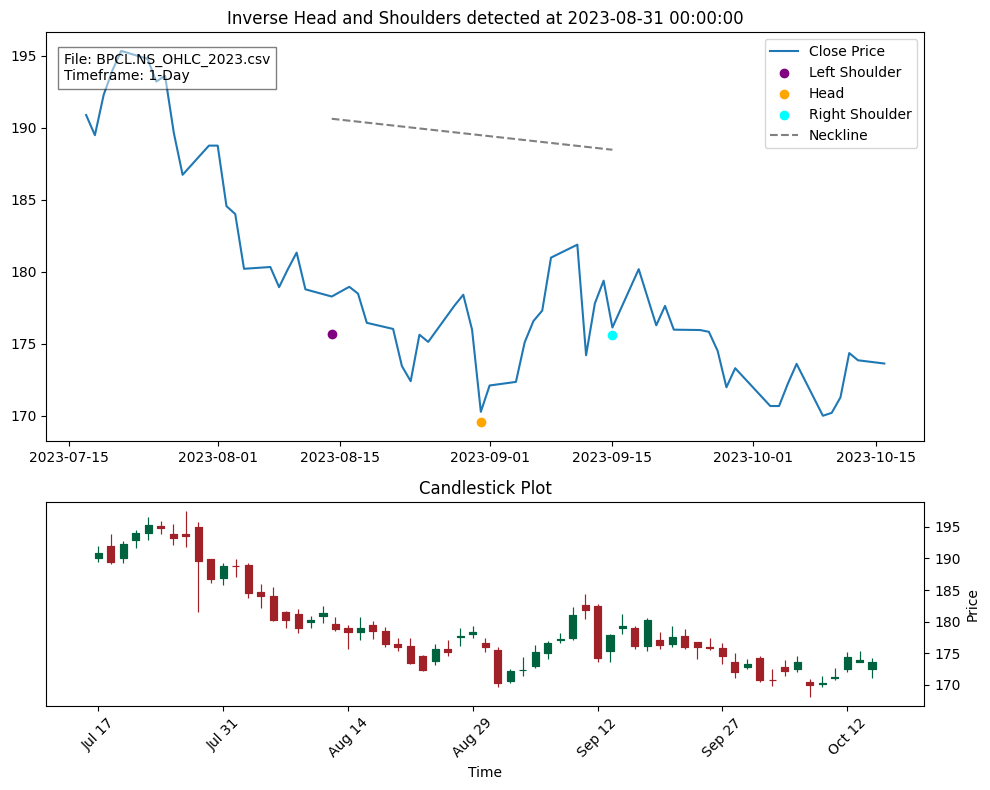

File: D:\AlgoT\yfinanceData\COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (11, Timestamp('2023-01-17 00:00:00'), 211.1000061035156), Head: (28, Timestamp('2023-02-10 00:00:00'), 210.9499969482422), Right Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 212.0)


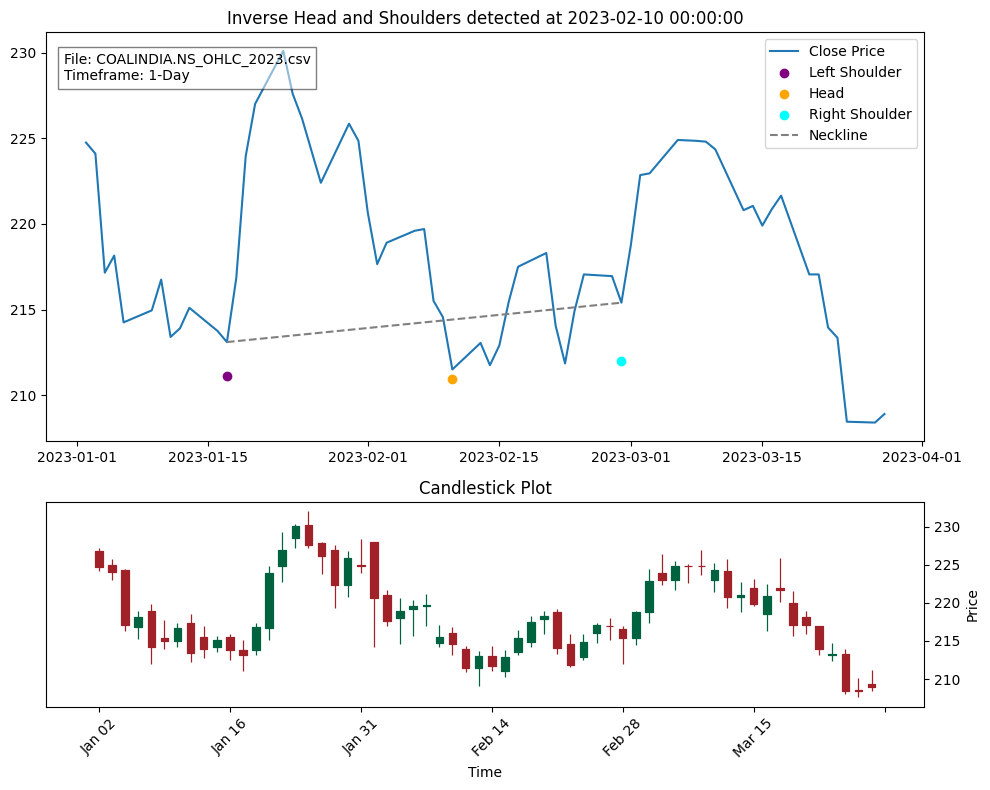

File: D:\AlgoT\yfinanceData\COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (107, Timestamp('2023-06-09 00:00:00'), 227.3500061035156), Head: (118, Timestamp('2023-06-26 00:00:00'), 223.25), Right Shoulder: (130, Timestamp('2023-07-13 00:00:00'), 229.0)


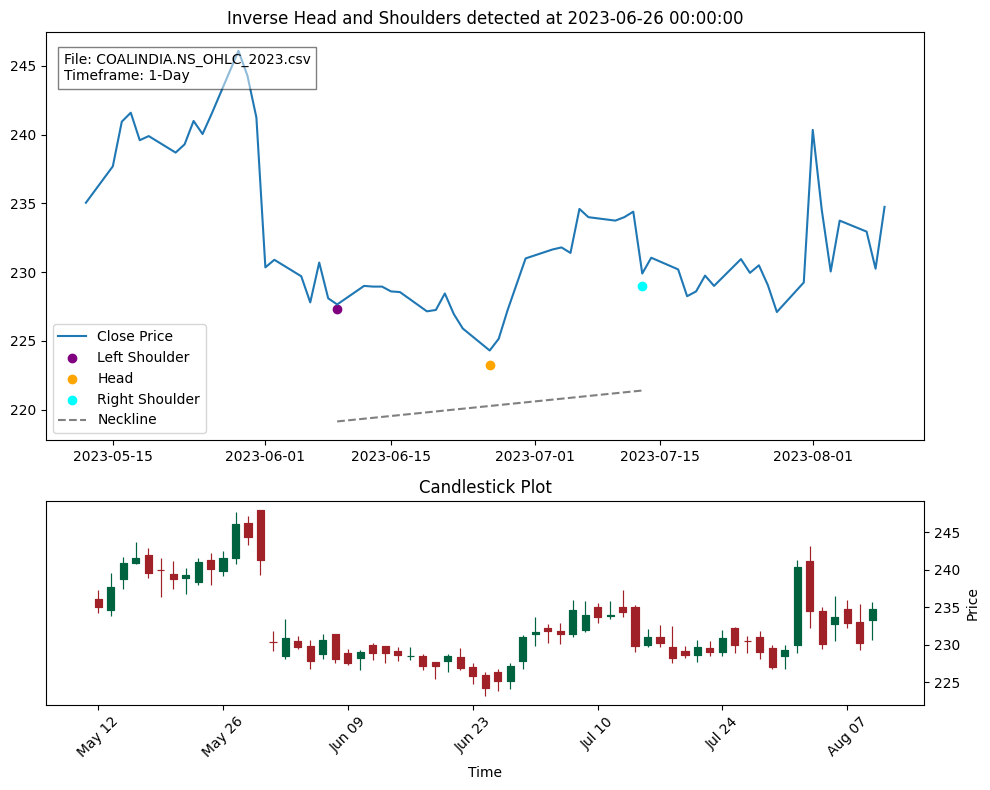

File: D:\AlgoT\yfinanceData\COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (130, Timestamp('2023-07-13 00:00:00'), 229.0), Head: (141, Timestamp('2023-07-28 00:00:00'), 226.8500061035156), Right Shoulder: (155, Timestamp('2023-08-18 00:00:00'), 227.0)


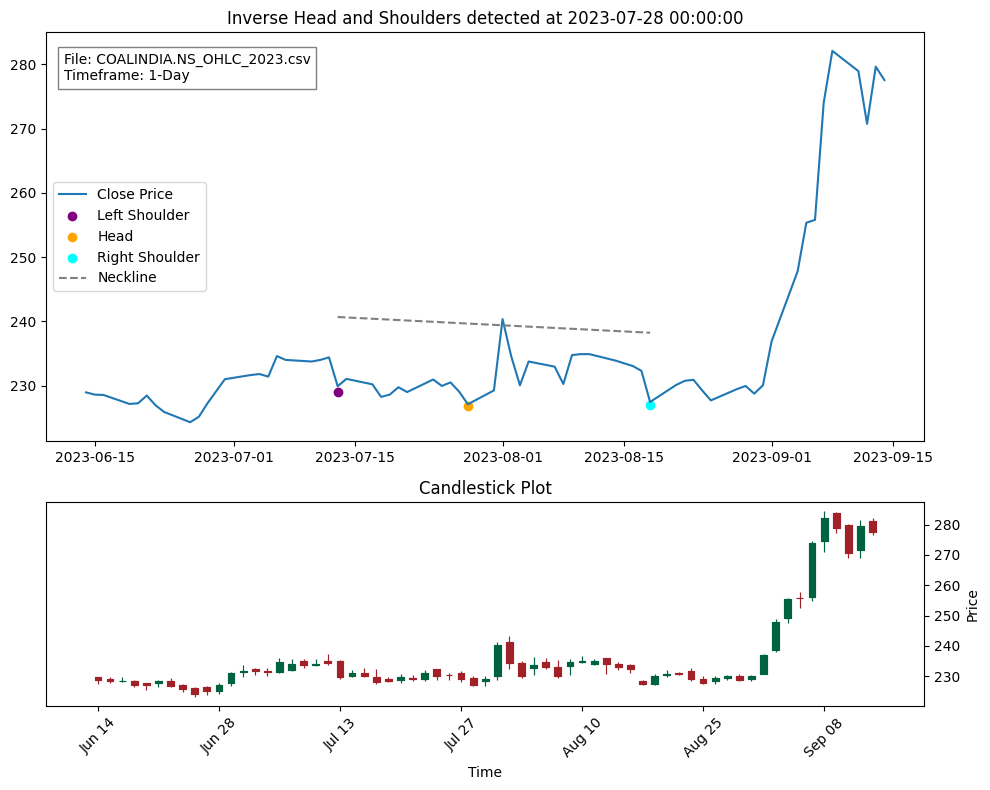

File: D:\AlgoT\yfinanceData\DIVISLAB.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (136, Timestamp('2023-07-21 00:00:00'), 3747.0), Head: (147, Timestamp('2023-08-07 00:00:00'), 3920.0), Right Shoulder: (158, Timestamp('2023-08-23 00:00:00'), 3728.800048828125)


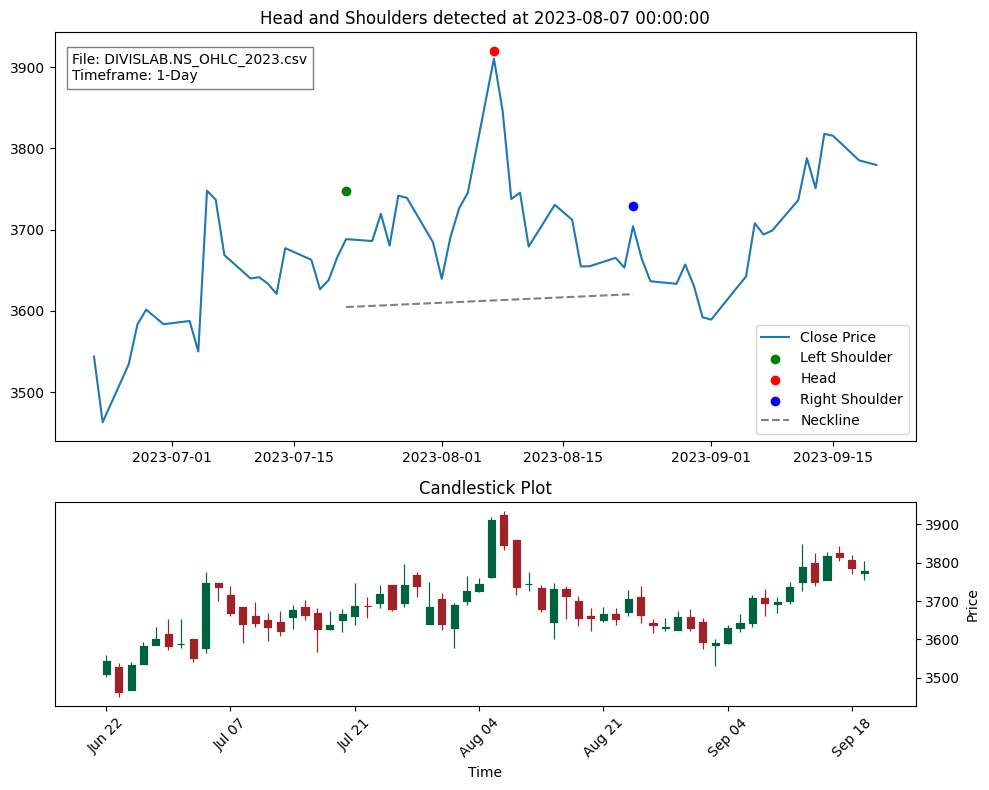

File: D:\AlgoT\yfinanceData\EICHERMOT.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (140, Timestamp('2023-07-27 00:00:00'), 3320.39990234375), Head: (154, Timestamp('2023-08-17 00:00:00'), 3291.75), Right Shoulder: (173, Timestamp('2023-09-13 00:00:00'), 3308.0)


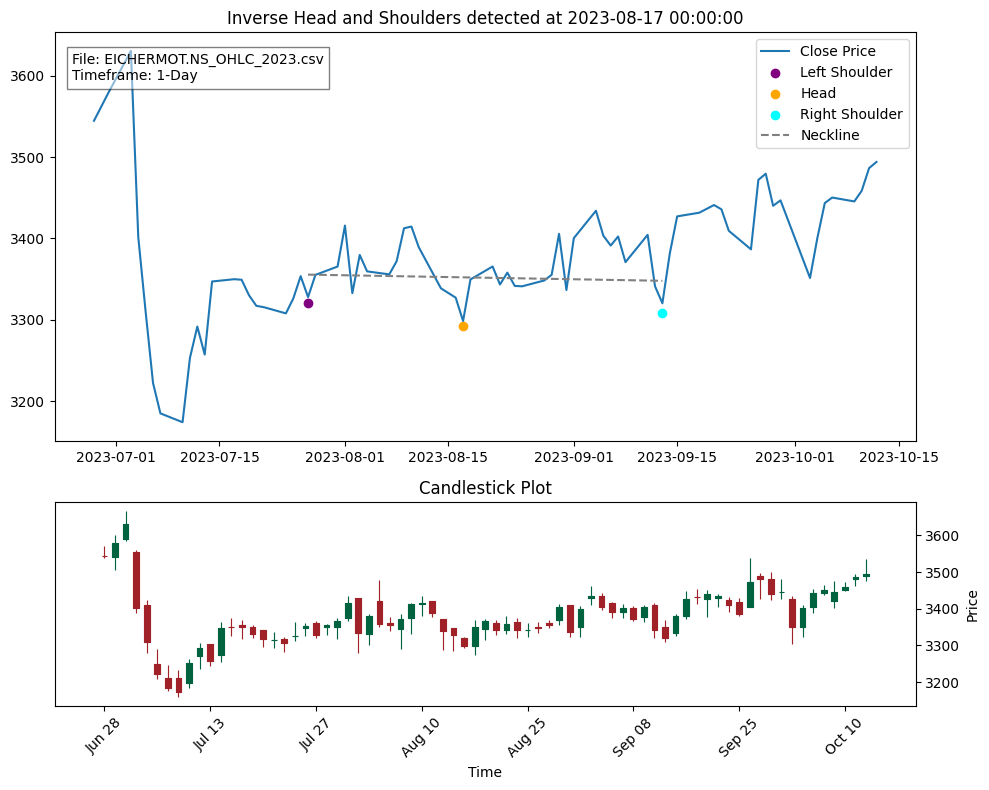

Skipping D:\AlgoT\yfinanceData\HDFC.NS_OHLC_2023.csv: Empty or missing 'Close' data.
File: D:\AlgoT\yfinanceData\HEROMOTOCO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 2410.35009765625), Head: (59, Timestamp('2023-03-28 00:00:00'), 2246.0), Right Shoulder: (70, Timestamp('2023-04-18 00:00:00'), 2425.0)


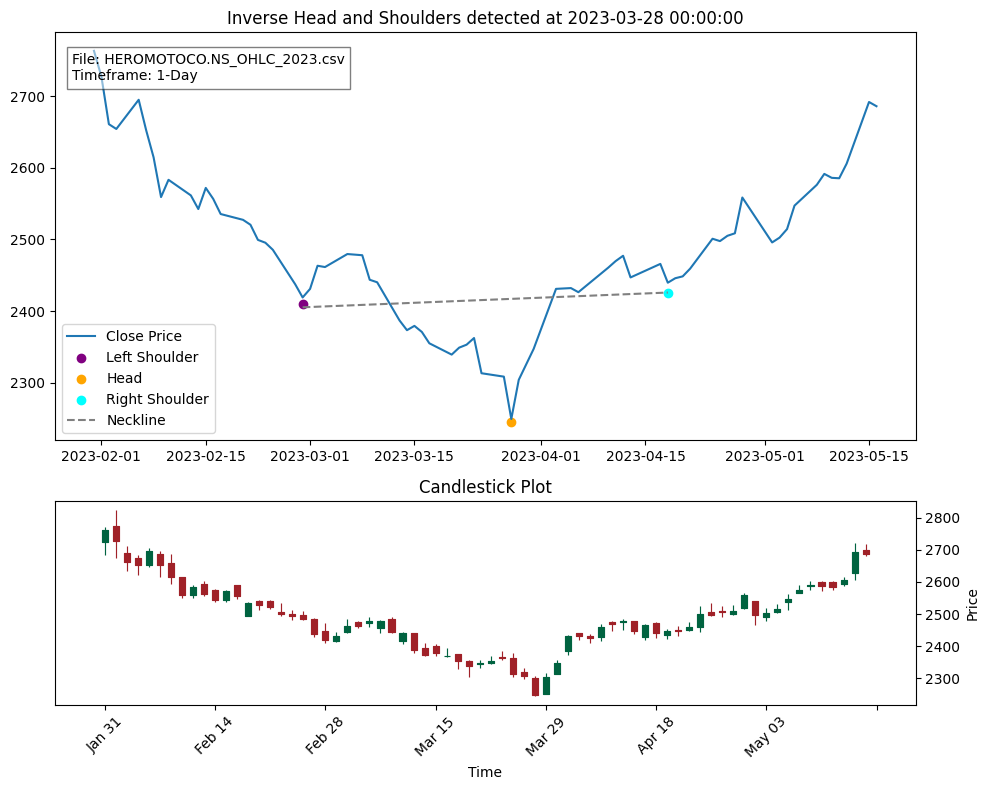

File: D:\AlgoT\yfinanceData\HINDALCO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 398.0), Head: (51, Timestamp('2023-03-16 00:00:00'), 383.1000061035156), Right Shoulder: (62, Timestamp('2023-04-03 00:00:00'), 399.5499877929688)


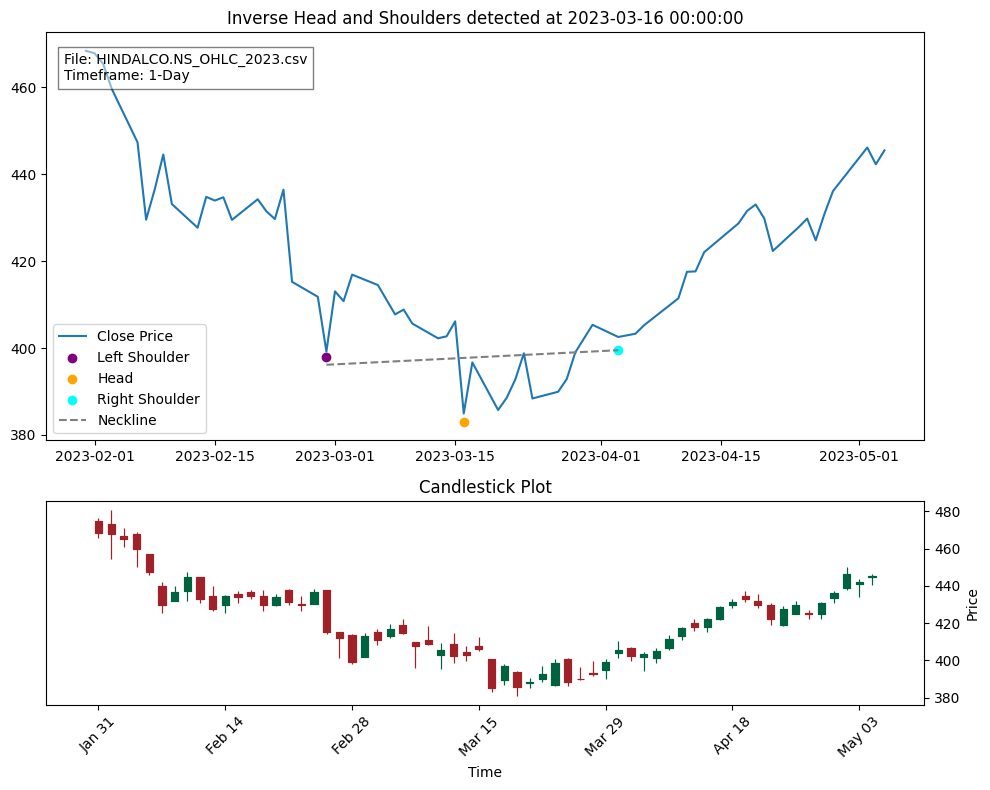

File: D:\AlgoT\yfinanceData\HINDUNILVR.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (34, Timestamp('2023-02-20 00:00:00'), 2508.199951171875), Head: (50, Timestamp('2023-03-15 00:00:00'), 2393.0), Right Shoulder: (67, Timestamp('2023-04-12 00:00:00'), 2518.64990234375)


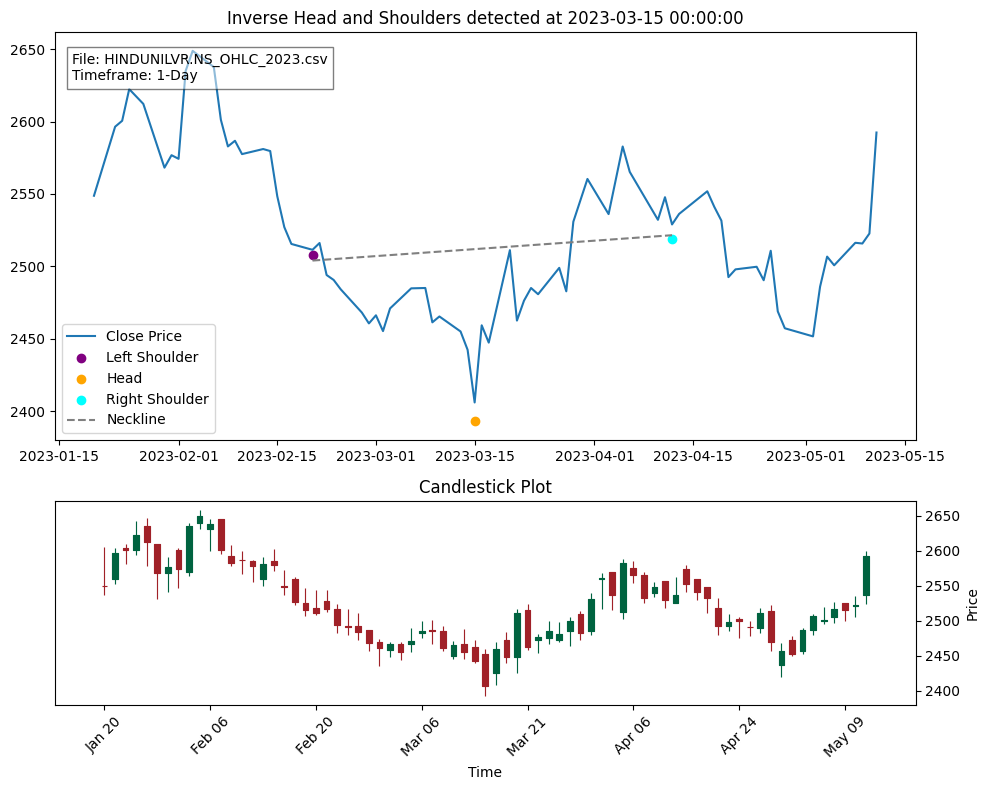

File: D:\AlgoT\yfinanceData\INDUSINDBK.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (37, Timestamp('2023-02-23 00:00:00'), 1066.6500244140625), Head: (53, Timestamp('2023-03-20 00:00:00'), 990.2000122070312), Right Shoulder: (65, Timestamp('2023-04-10 00:00:00'), 1063.0)


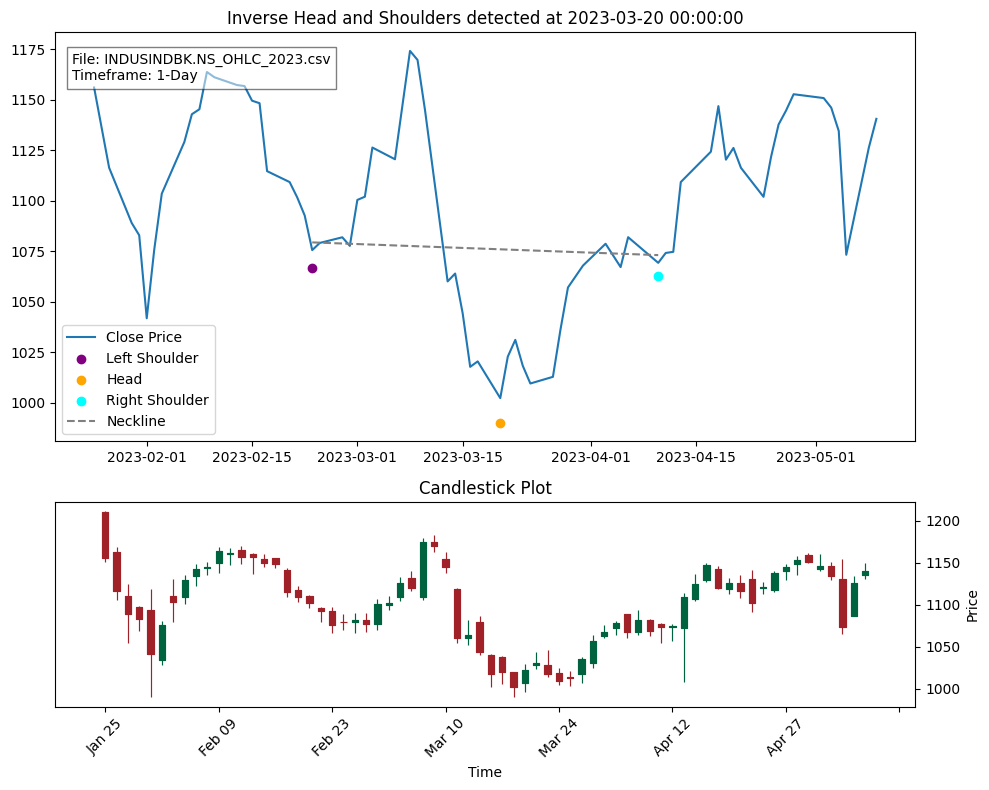

File: D:\AlgoT\yfinanceData\IOC.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (146, Timestamp('2023-08-04 00:00:00'), 92.0500030517578), Head: (165, Timestamp('2023-09-01 00:00:00'), 88.75), Right Shoulder: (177, Timestamp('2023-09-20 00:00:00'), 91.4000015258789)


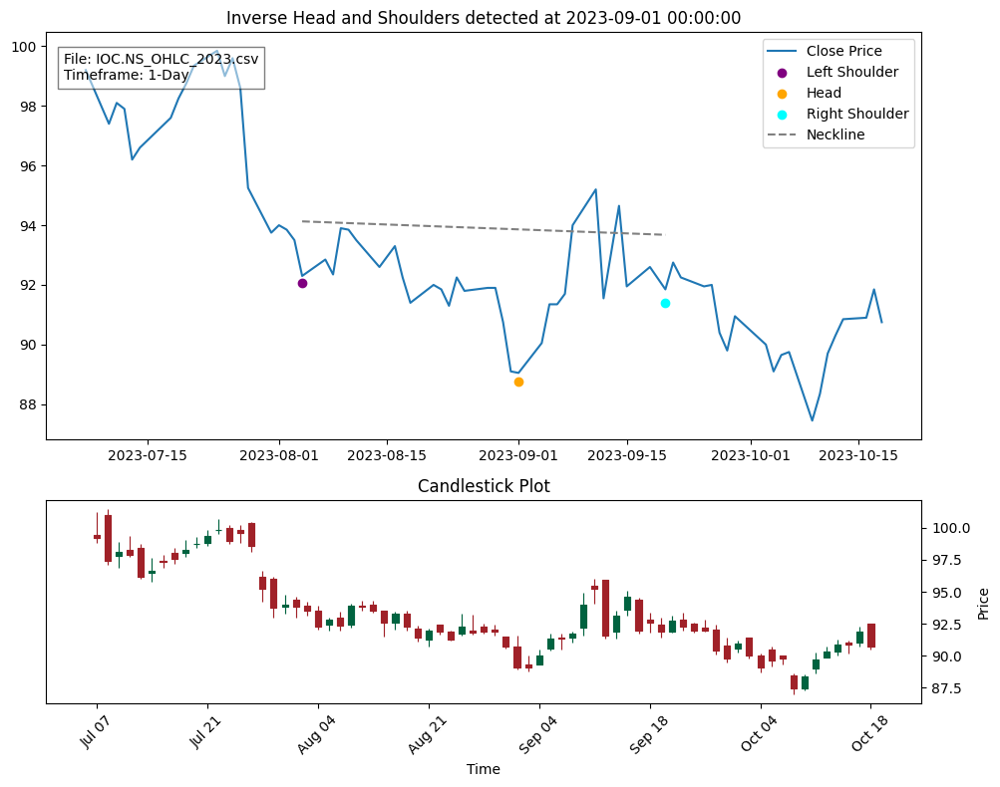

File: D:\AlgoT\yfinanceData\MARUTI.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (104, Timestamp('2023-06-06 00:00:00'), 9770.0), Head: (124, Timestamp('2023-07-05 00:00:00'), 10036.9501953125), Right Shoulder: (142, Timestamp('2023-07-31 00:00:00'), 9837.7001953125)


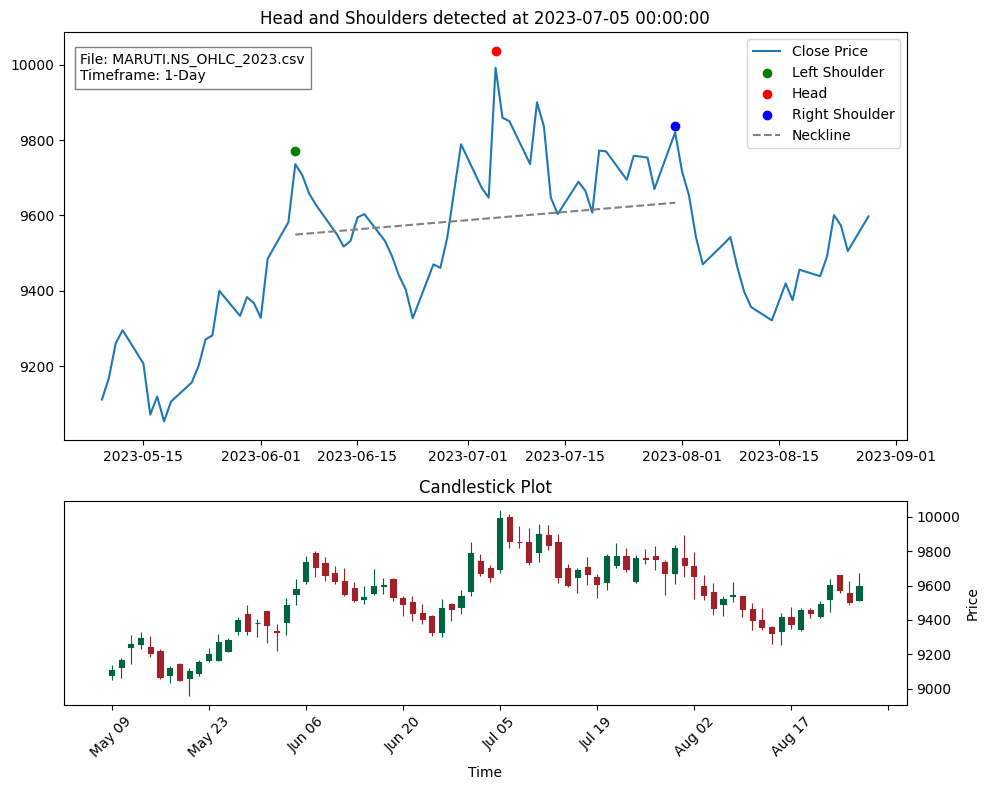

File: D:\AlgoT\yfinanceData\POWERGRID.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (87, Timestamp('2023-05-12 00:00:00'), 180.8625030517578), Head: (101, Timestamp('2023-06-01 00:00:00'), 172.53750610351562), Right Shoulder: (113, Timestamp('2023-06-19 00:00:00'), 181.8000030517578)


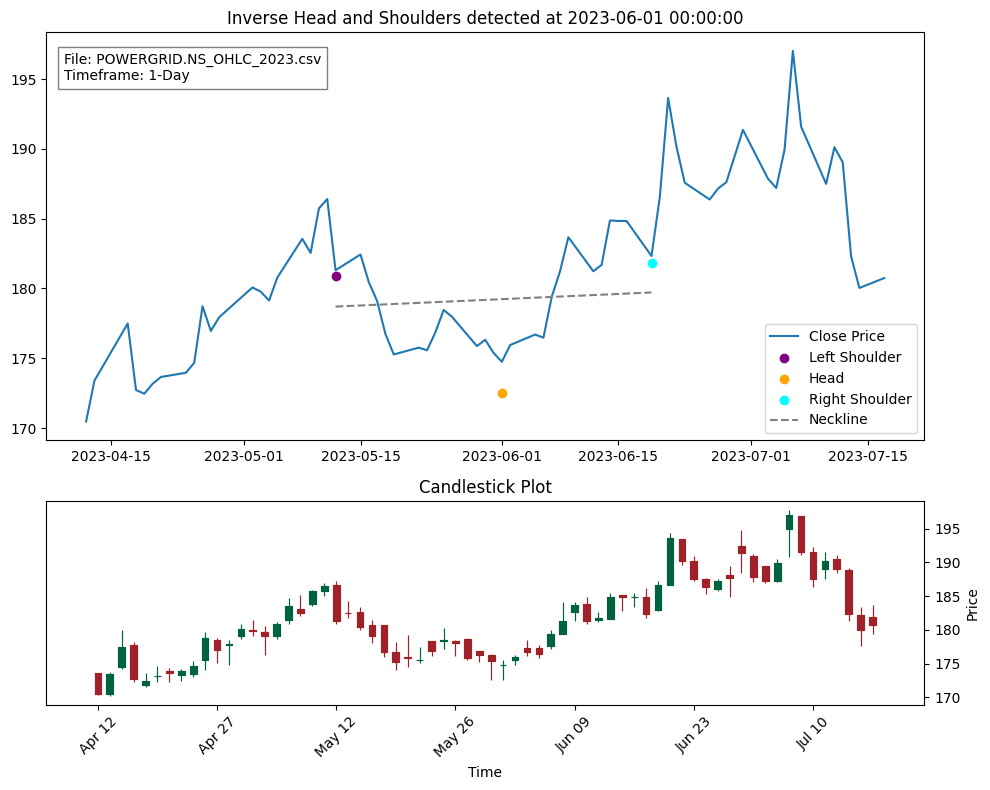

File: D:\AlgoT\yfinanceData\RELIANCE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 2135.498291015625), Head: (53, Timestamp('2023-03-20 00:00:00'), 2012.1392822265625), Right Shoulder: (65, Timestamp('2023-04-10 00:00:00'), 2142.789794921875)


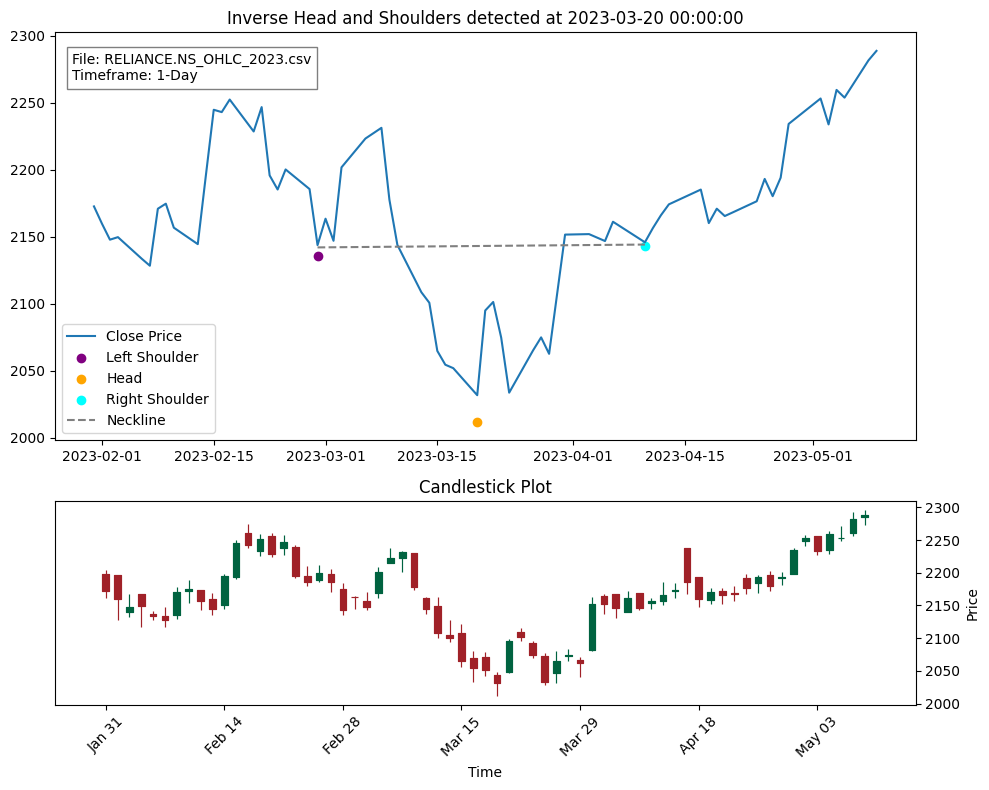

File: D:\AlgoT\yfinanceData\RELIANCE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (189, Timestamp('2023-10-09 00:00:00'), 2295.0), Head: (201, Timestamp('2023-10-26 00:00:00'), 2220.300048828125), Right Shoulder: (213, Timestamp('2023-11-13 00:00:00'), 2311.699951171875)


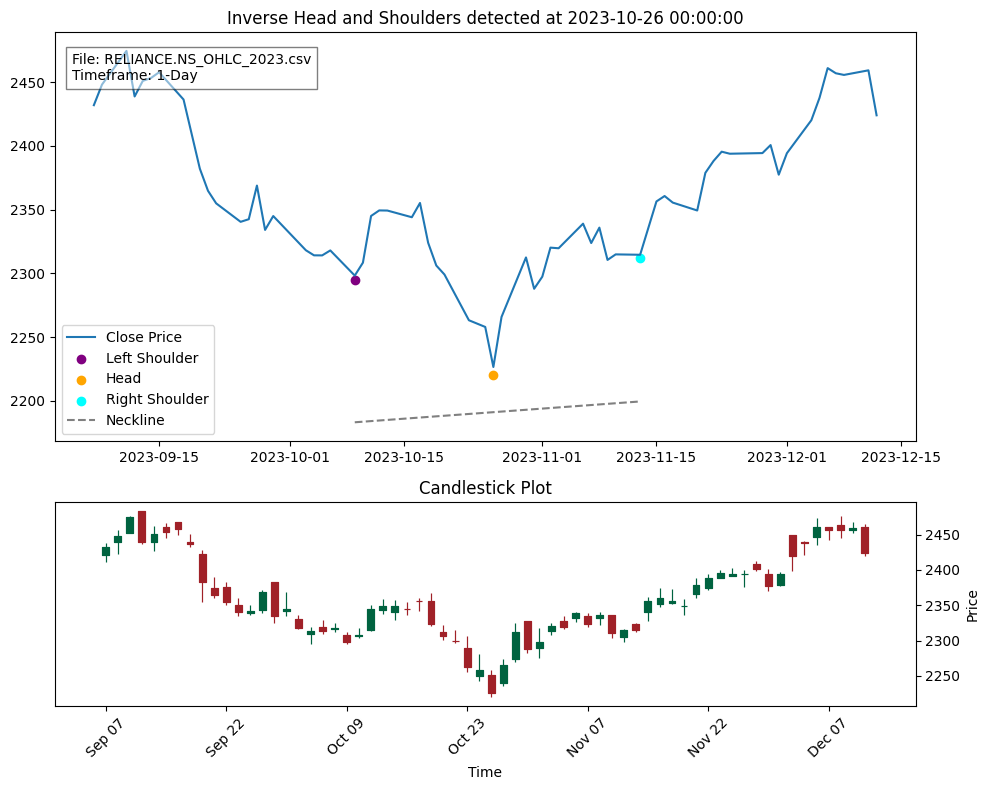

File: D:\AlgoT\yfinanceData\SBILIFE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (219, Timestamp('2023-11-22 00:00:00'), 1438.550048828125), Head: (232, Timestamp('2023-12-12 00:00:00'), 1491.9000244140625), Right Shoulder: (243, Timestamp('2023-12-28 00:00:00'), 1444.949951171875)


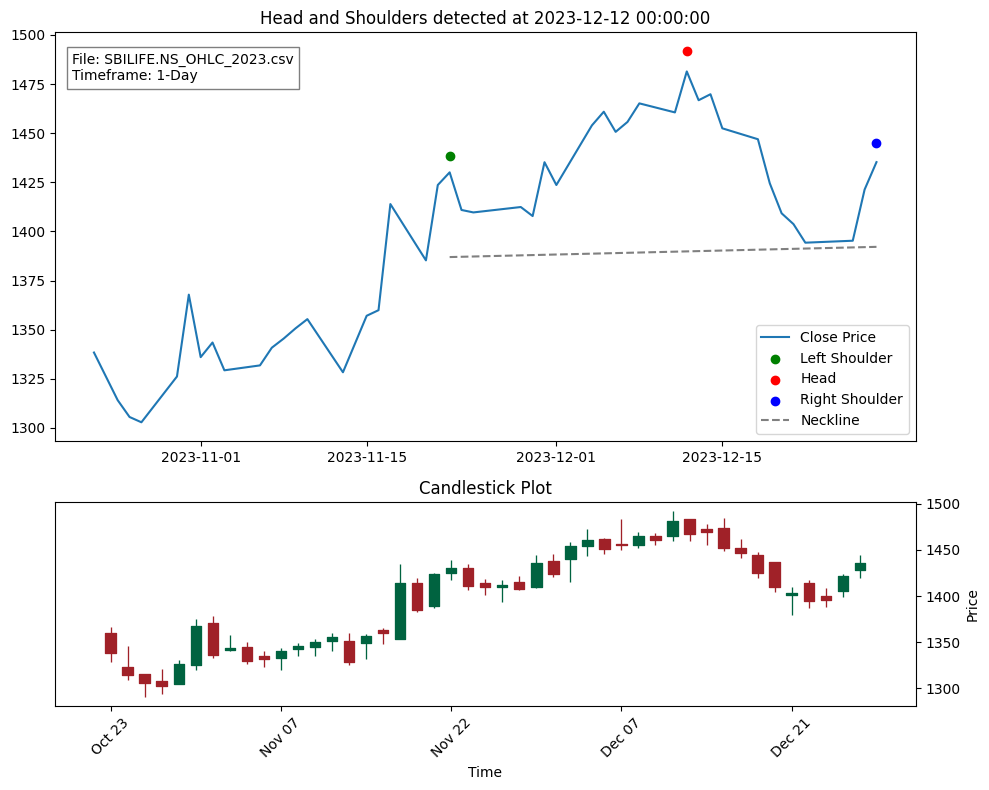

File: D:\AlgoT\yfinanceData\SUNPHARMA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (173, Timestamp('2023-09-13 00:00:00'), 1156.699951171875), Head: (184, Timestamp('2023-09-29 00:00:00'), 1167.4000244140625), Right Shoulder: (196, Timestamp('2023-10-18 00:00:00'), 1161.800048828125)


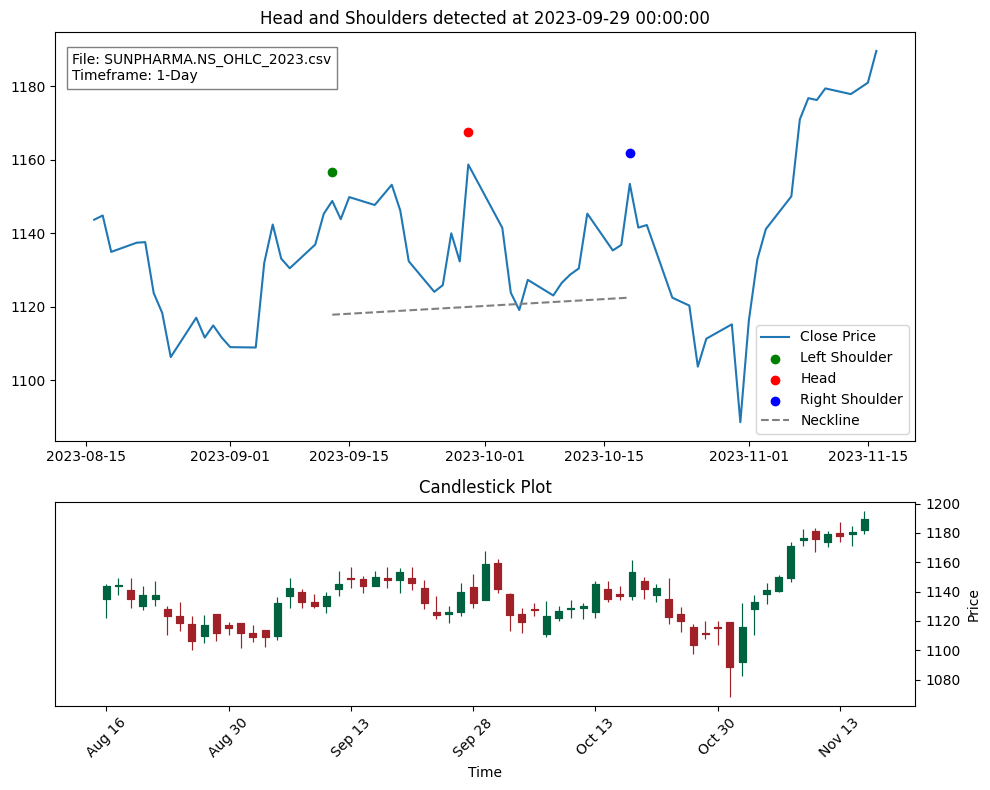

File: D:\AlgoT\yfinanceData\TATACONSUM.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (175, Timestamp('2023-09-15 00:00:00'), 873.5), Head: (187, Timestamp('2023-10-05 00:00:00'), 857.5), Right Shoulder: (201, Timestamp('2023-10-26 00:00:00'), 872.0)


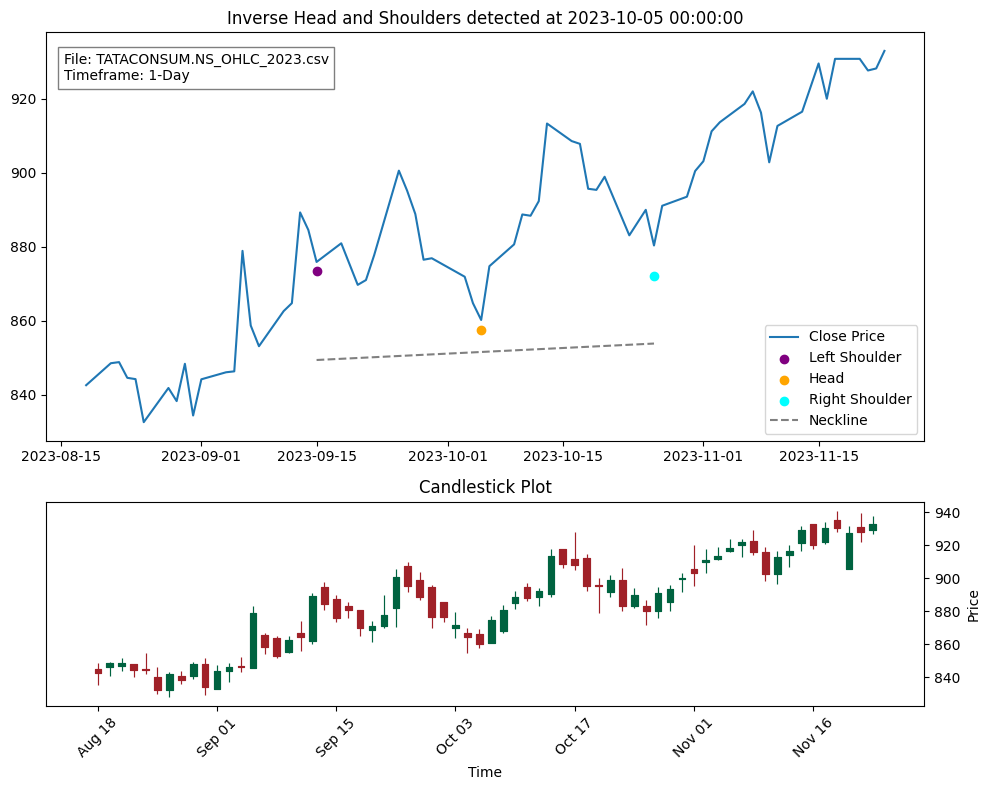

File: D:\AlgoT\yfinanceData\TITAN.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (10, Timestamp('2023-01-16 00:00:00'), 2392.0), Head: (22, Timestamp('2023-02-02 00:00:00'), 2269.60009765625), Right Shoulder: (37, Timestamp('2023-02-23 00:00:00'), 2380.0)


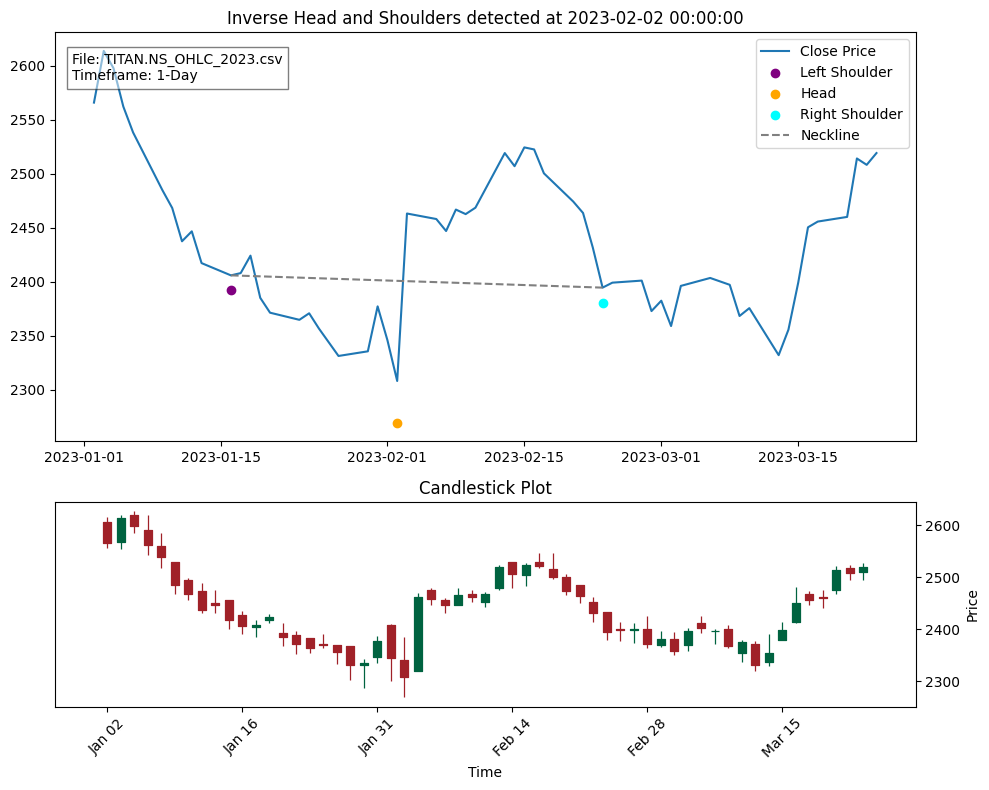

File: D:\AlgoT\yfinanceData\UPL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (90, Timestamp('2023-05-17 00:00:00'), 683.4500122070312), Head: (104, Timestamp('2023-06-06 00:00:00'), 696.9500122070312), Right Shoulder: (121, Timestamp('2023-06-30 00:00:00'), 688.25)


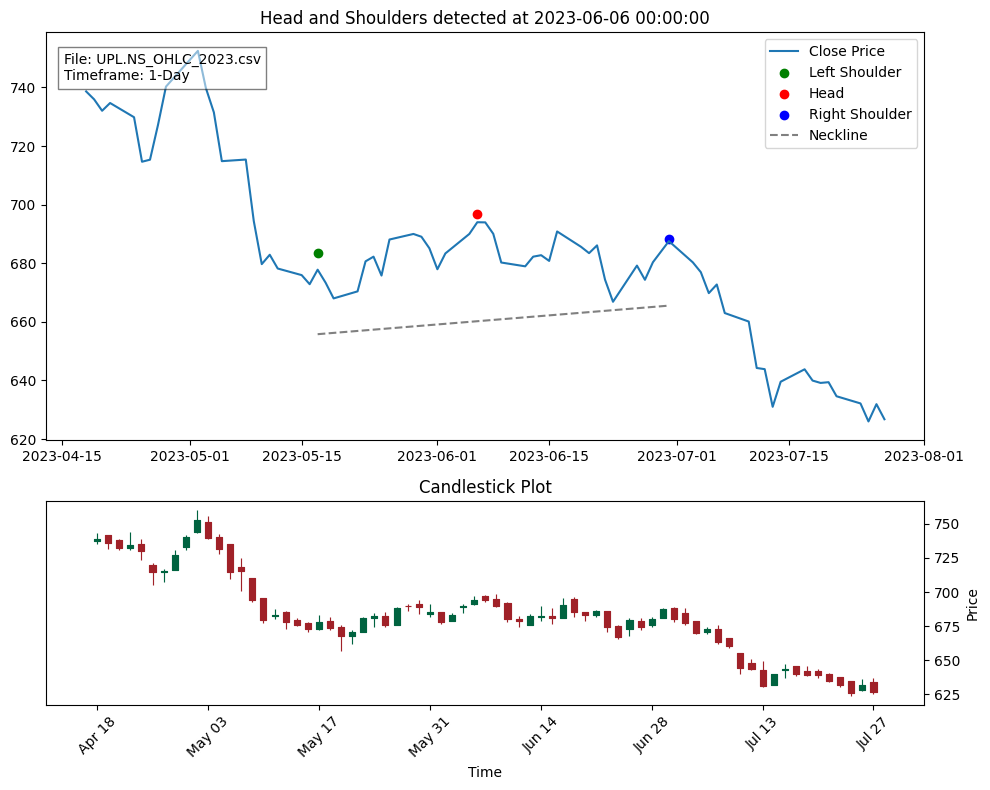

File: D:\AlgoT\yfinanceData\WIPRO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (153, Timestamp('2023-08-16 00:00:00'), 420.2000122070313), Head: (175, Timestamp('2023-09-15 00:00:00'), 443.75), Right Shoulder: (191, Timestamp('2023-10-11 00:00:00'), 423.9500122070313)


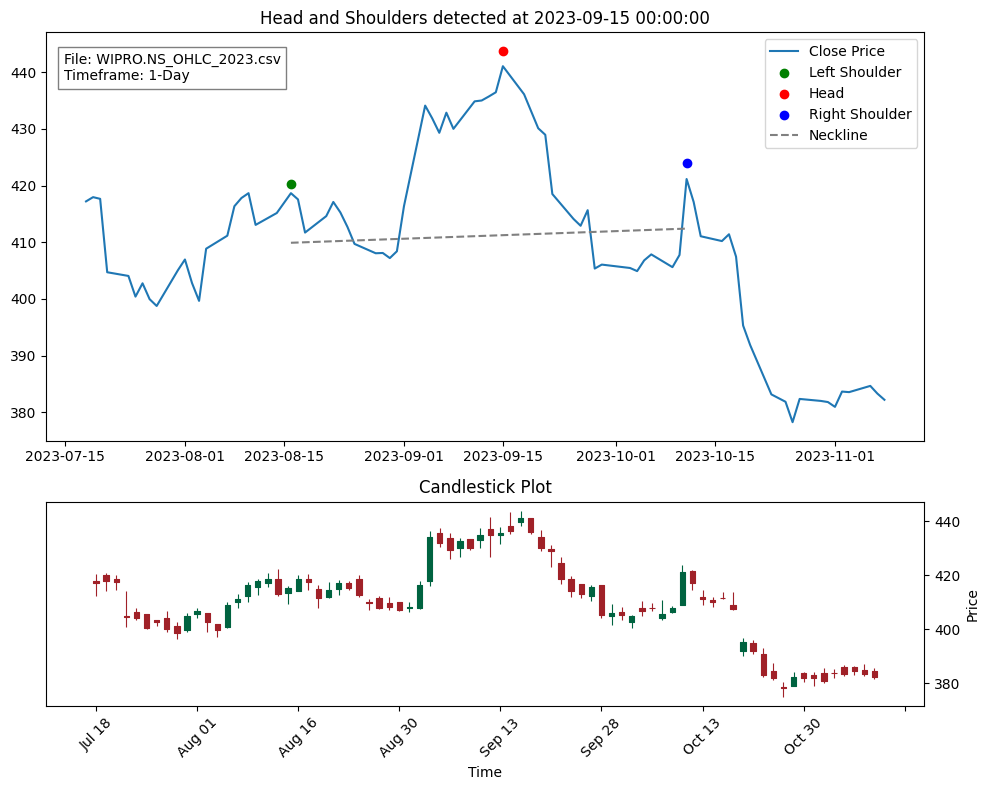

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils
import os
import glob
from scipy.stats import linregress

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, troughs, data):
    patterns = []
    
    # Detect regular head and shoulders
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is higher than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Calculate slanted neckline using linear regression on the close prices at troughs
            troughs_close_prices = [data['Close'][left_shoulder[0]], data['Close'][right_shoulder[0]]]
            troughs_indices = [left_shoulder[0], right_shoulder[0]]
            slope, intercept, _, _, _ = linregress(troughs_indices, troughs_close_prices)
            
            patterns.append({
                'type': 'Head and Shoulders',
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'slope': slope,
                'intercept': intercept
            })
    
    # Detect inverse head and shoulders
    for i in range(1, len(troughs) - 1):
        left_shoulder = troughs[i-1]
        head = troughs[i]
        right_shoulder = troughs[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is lower than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] > head[2] and right_shoulder[2] > head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Calculate slanted neckline using linear regression on the close prices at peaks
            peaks_close_prices = [data['Close'][left_shoulder[0]], data['Close'][right_shoulder[0]]]
            peaks_indices = [left_shoulder[0], right_shoulder[0]]
            slope, intercept, _, _, _ = linregress(peaks_indices, peaks_close_prices)
            
            patterns.append({
                'type': 'Inverse Head and Shoulders',
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'slope': slope,
                'intercept': intercept
            })
    
    return patterns

# Function to process a single CSV file
def process_csv_file(file_path):
    data = pd.read_csv(file_path)
    if data.empty or 'Close' not in data.columns:
        print(f"Skipping {file_path}: Empty or missing 'Close' data.")
        return
    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index('Date', inplace=True)
    
    timeframes = {'1-Day': data}

    for timeframe, resampled_data in timeframes.items():
        # Find peaks and troughs in the data
        peaks, troughs = find_peaks_and_troughs(resampled_data)
        
        # Detect Head and Shoulders patterns
        patterns = detect_head_and_shoulders(peaks, troughs, resampled_data)
        
        # Display detected patterns and plot the chart for each pattern
        for pattern in patterns:
            print(f"File: {file_path}, Timeframe: {timeframe}, Type: {pattern['type']}")
            print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}")
            
            start_index = max(0, pattern['left_shoulder'][0] - 20)
            end_index = min(len(resampled_data) - 1, pattern['right_shoulder'][0] + 20)
            pattern_data = resampled_data.iloc[start_index:end_index]
            
            # Setup figure and subplots
            fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})
            
            # First subplot for the pattern
            ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
            if pattern['type'] == 'Head and Shoulders':
                ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
                ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
                ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
                
                # Plot slanted neckline
                neckline_x = np.array([pattern_data.index.get_loc(pattern['left_shoulder'][1]), pattern_data.index.get_loc(pattern['right_shoulder'][1])])
                neckline_y = pattern['slope'] * neckline_x + pattern['intercept']
                ax.plot(pattern_data.index[neckline_x], neckline_y, color='gray', linestyle='--', label='Neckline')
                
                ax.set_title(f"{pattern['type']} detected at {pattern['head'][1]}")
            else:
                ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='purple', label='Left Shoulder')
                ax.scatter(pattern['head'][1], pattern['head'][2], color='orange', label='Head')
                ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='cyan', label='Right Shoulder')
                
                # Plot slanted neckline
                neckline_x = np.array([pattern_data.index.get_loc(pattern['left_shoulder'][1]), pattern_data.index.get_loc(pattern['right_shoulder'][1])])
                neckline_y = pattern['slope'] * neckline_x + pattern['intercept']
                ax.plot(pattern_data.index[neckline_x], neckline_y, color='gray', linestyle='--', label='Neckline')
                
                ax.set_title(f"{pattern['type']} detected at {pattern['head'][1]}")
            ax.legend()
            
            # Add file name and timeframe text
            ax.text(0.02, 0.95, f'File: {os.path.basename(file_path)}\nTimeframe: {timeframe}', transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
            
            # Second subplot for candlestick
            mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
            ax2.set_xlabel('Time')
            ax2.set_ylabel('Price')
            ax2.set_title('Candlestick Plot')
            
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

# Main function to process all CSV files in a directory
def process_all_csv_files_in_directory(directory_path):
    csv_files = glob.glob(os.path.join(directory_path, "*.csv"))
    
    for file_path in csv_files:
        process_csv_file(file_path)

# Example usage
directory_path = r"D:\AlgoT\yfinanceData"
process_all_csv_files_in_directory(directory_path)


File: D:\AlgoT\yfinanceData\BAJAJFINSV.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (180, Timestamp('2023-09-25 00:00:00'), 1591.0), Head: (195, Timestamp('2023-10-17 00:00:00'), 1676.75), Right Shoulder: (206, Timestamp('2023-11-02 00:00:00'), 1592.5999755859375)


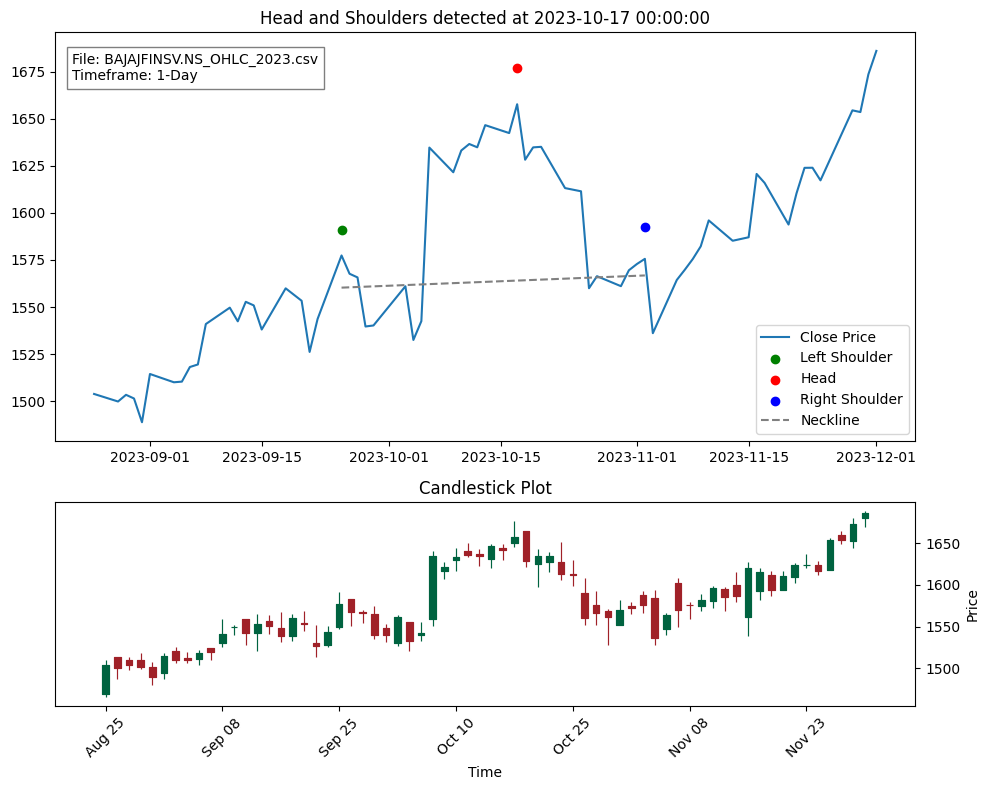

File: D:\AlgoT\yfinanceData\BPCL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (88, Timestamp('2023-05-15 00:00:00'), 178.1750030517578), Head: (104, Timestamp('2023-06-06 00:00:00'), 177.3000030517578), Right Shoulder: (118, Timestamp('2023-06-26 00:00:00'), 177.8249969482422)


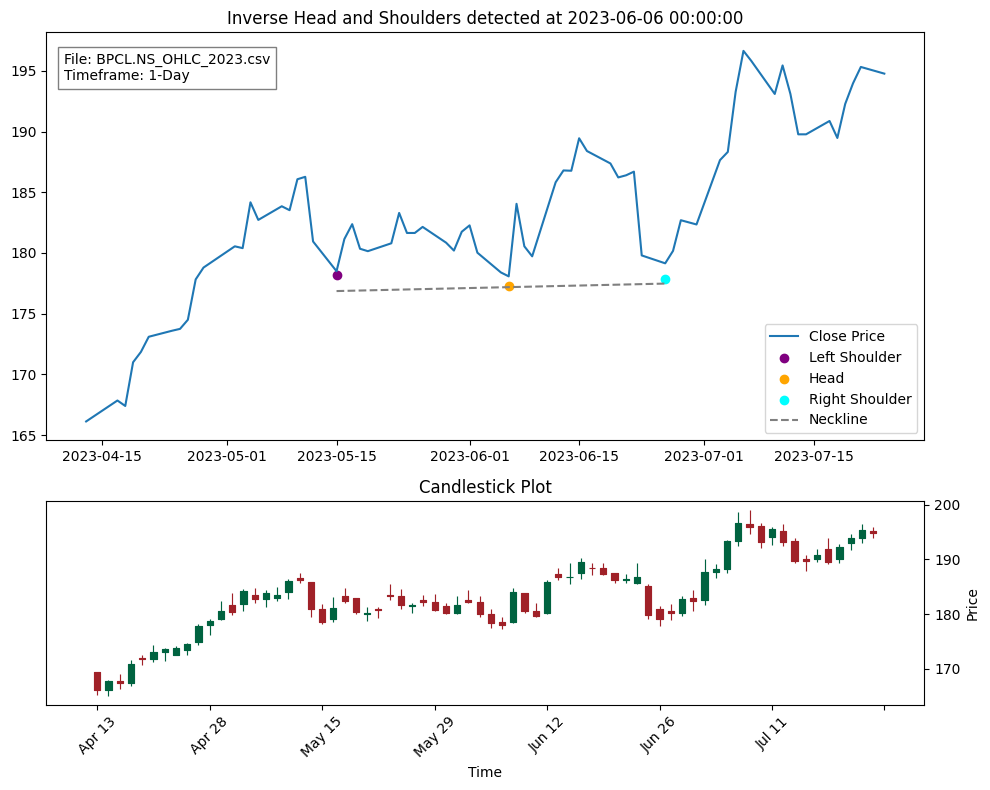

File: D:\AlgoT\yfinanceData\BPCL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (152, Timestamp('2023-08-14 00:00:00'), 175.64999389648438), Head: (164, Timestamp('2023-08-31 00:00:00'), 169.5500030517578), Right Shoulder: (175, Timestamp('2023-09-15 00:00:00'), 175.625)


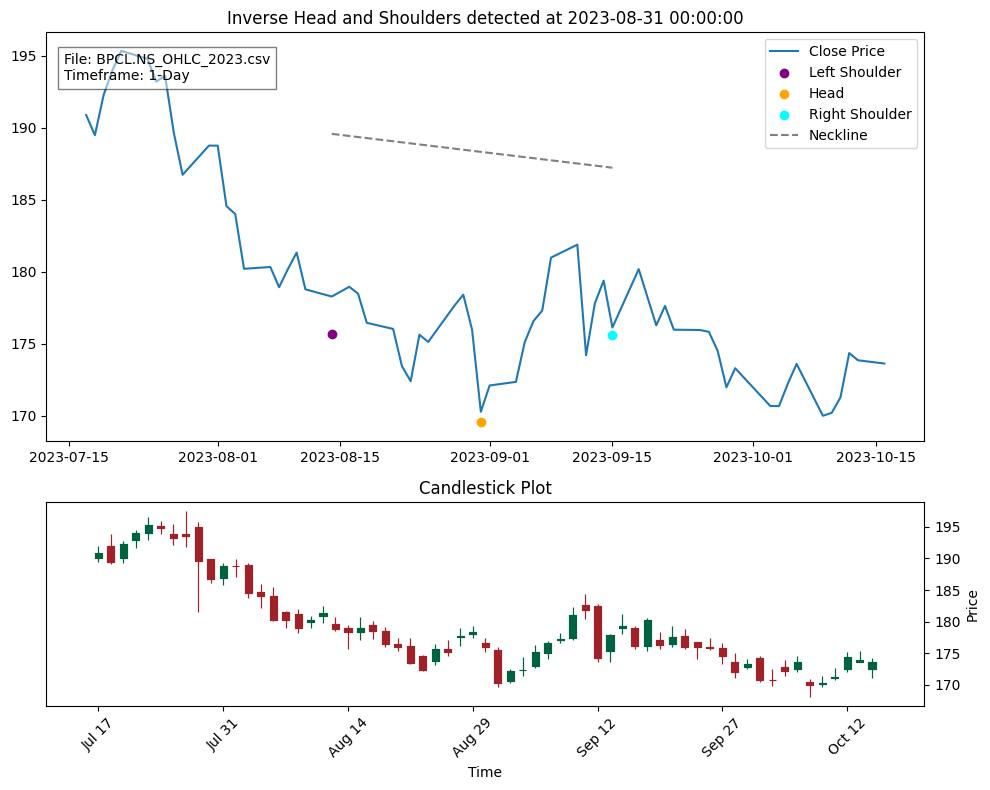

File: D:\AlgoT\yfinanceData\COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (11, Timestamp('2023-01-17 00:00:00'), 211.1000061035156), Head: (28, Timestamp('2023-02-10 00:00:00'), 210.9499969482422), Right Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 212.0)


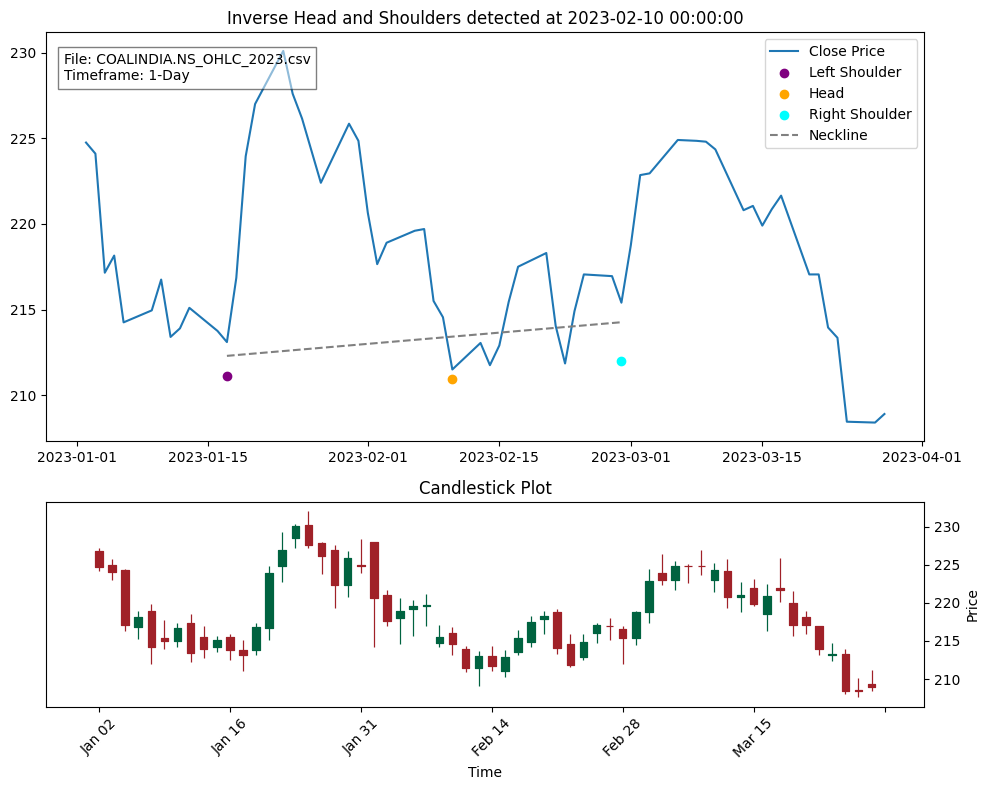

File: D:\AlgoT\yfinanceData\COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (107, Timestamp('2023-06-09 00:00:00'), 227.3500061035156), Head: (118, Timestamp('2023-06-26 00:00:00'), 223.25), Right Shoulder: (130, Timestamp('2023-07-13 00:00:00'), 229.0)


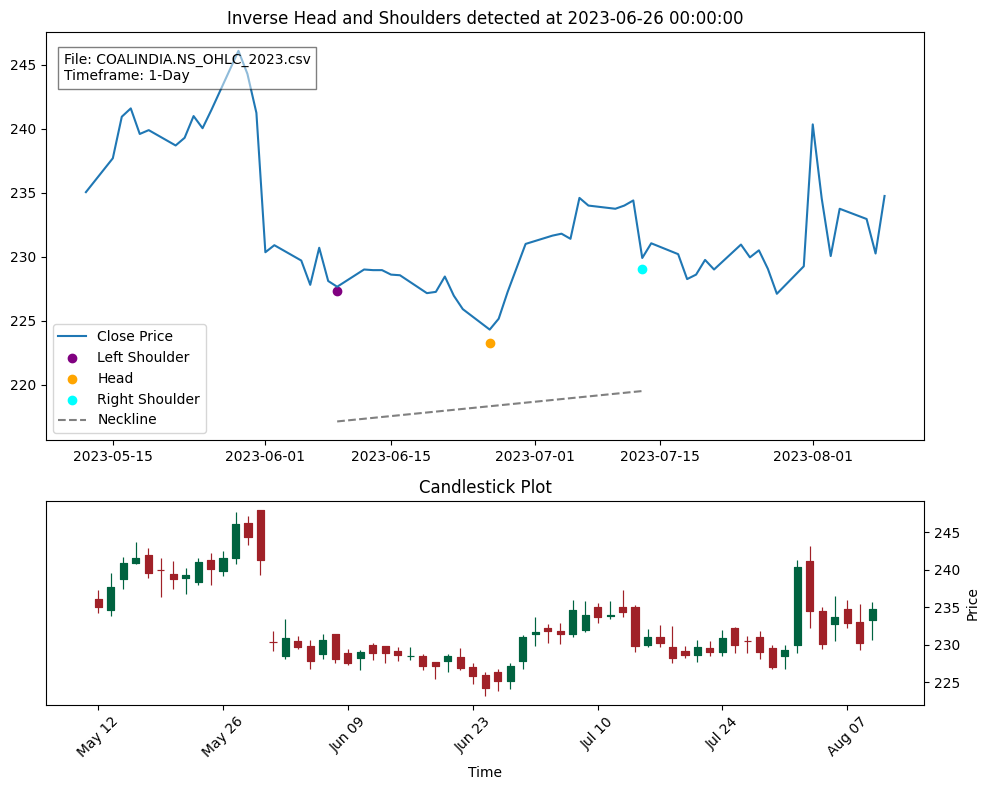

File: D:\AlgoT\yfinanceData\COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (130, Timestamp('2023-07-13 00:00:00'), 229.0), Head: (141, Timestamp('2023-07-28 00:00:00'), 226.8500061035156), Right Shoulder: (155, Timestamp('2023-08-18 00:00:00'), 227.0)


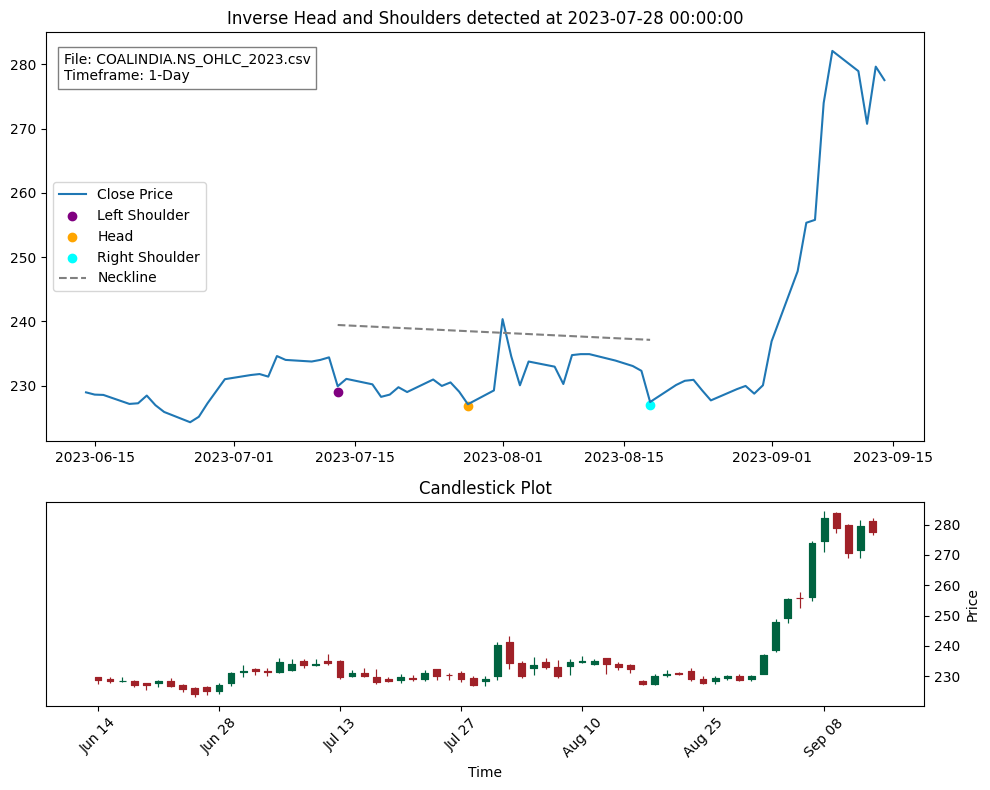

File: D:\AlgoT\yfinanceData\DIVISLAB.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (136, Timestamp('2023-07-21 00:00:00'), 3747.0), Head: (147, Timestamp('2023-08-07 00:00:00'), 3920.0), Right Shoulder: (158, Timestamp('2023-08-23 00:00:00'), 3728.800048828125)


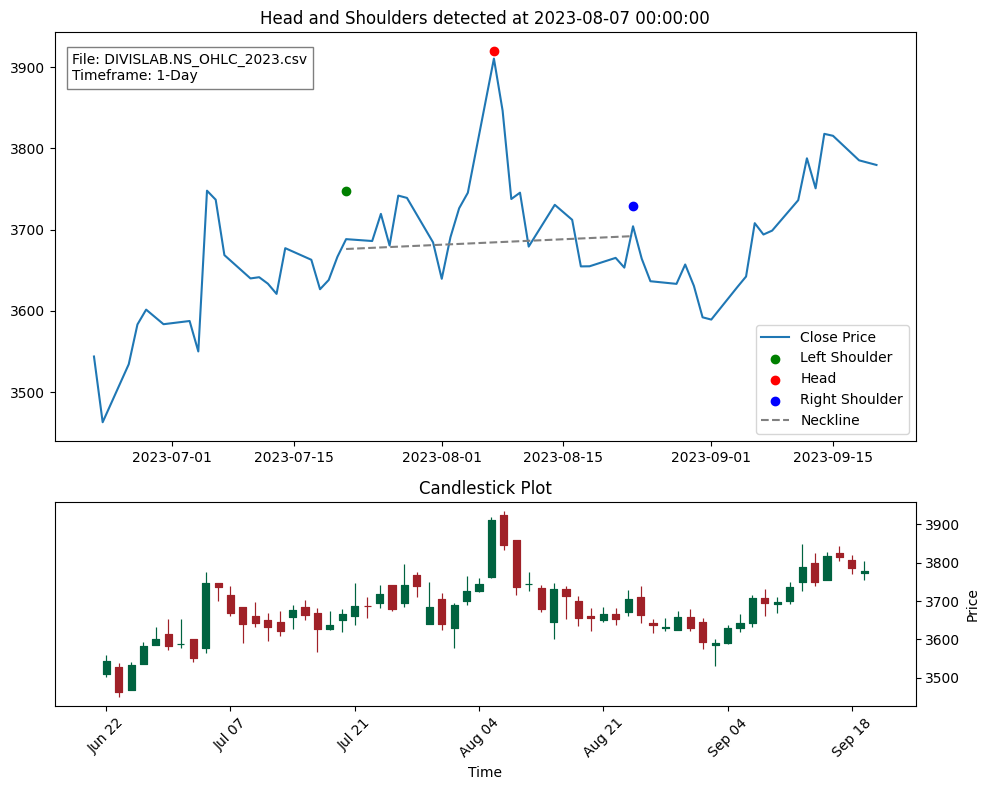

File: D:\AlgoT\yfinanceData\EICHERMOT.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (140, Timestamp('2023-07-27 00:00:00'), 3320.39990234375), Head: (154, Timestamp('2023-08-17 00:00:00'), 3291.75), Right Shoulder: (173, Timestamp('2023-09-13 00:00:00'), 3308.0)


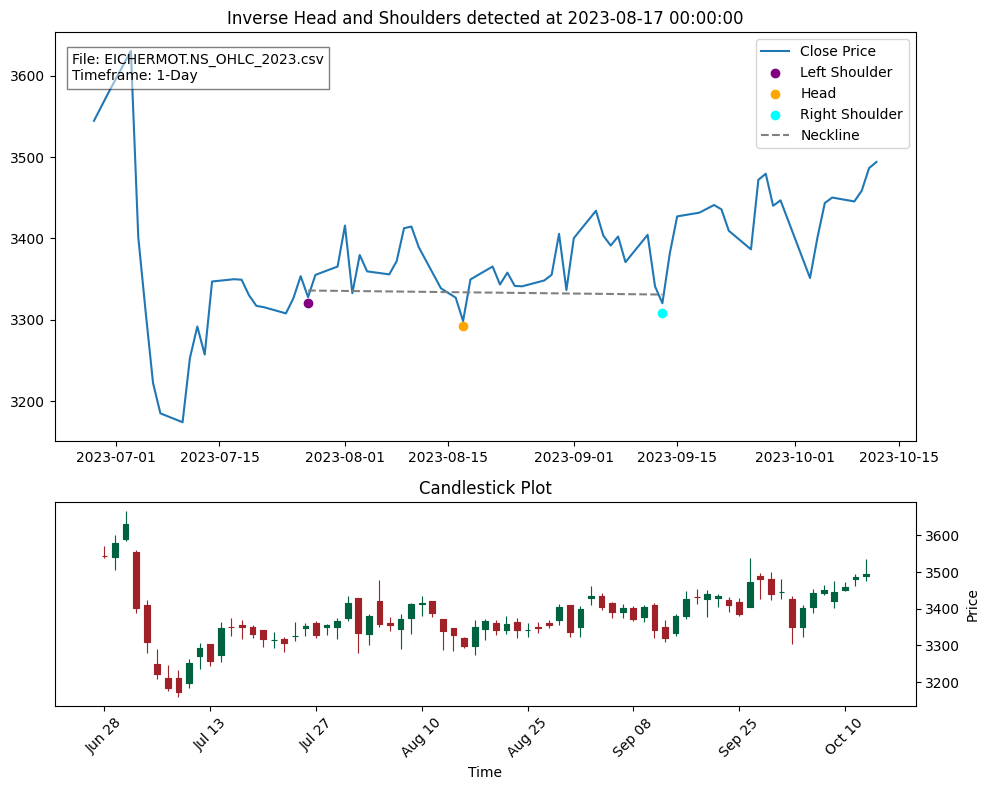

Skipping D:\AlgoT\yfinanceData\HDFC.NS_OHLC_2023.csv: Empty or missing 'Close' data.
File: D:\AlgoT\yfinanceData\HEROMOTOCO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 2410.35009765625), Head: (59, Timestamp('2023-03-28 00:00:00'), 2246.0), Right Shoulder: (70, Timestamp('2023-04-18 00:00:00'), 2425.0)


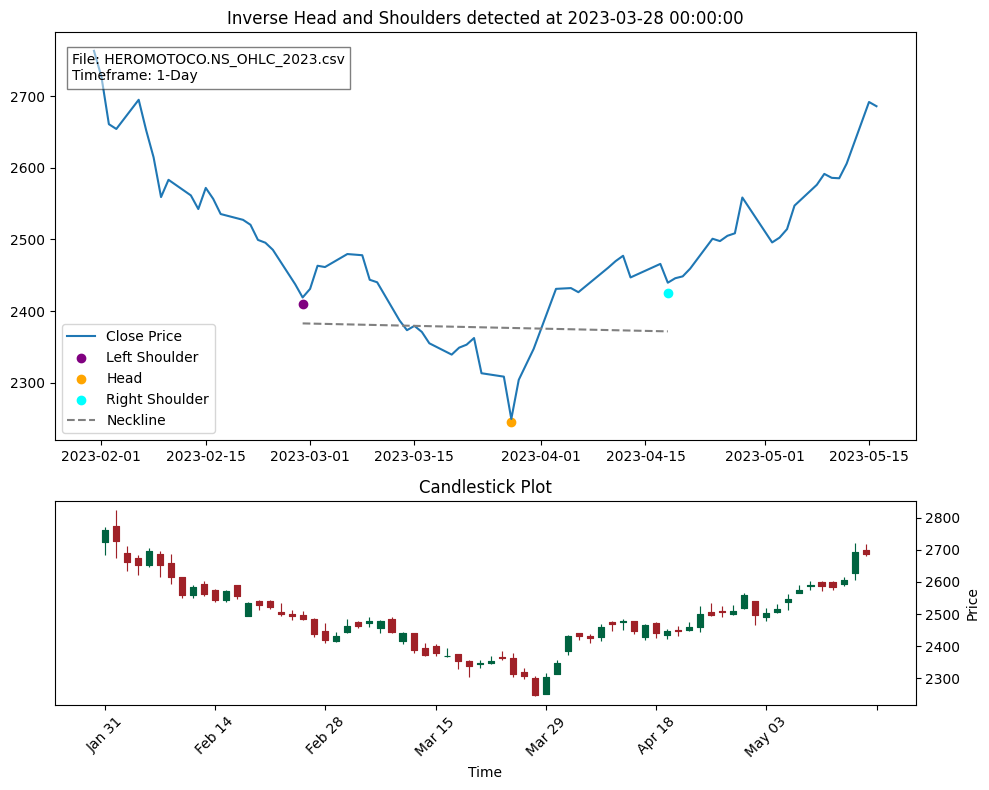

File: D:\AlgoT\yfinanceData\HINDALCO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 398.0), Head: (51, Timestamp('2023-03-16 00:00:00'), 383.1000061035156), Right Shoulder: (62, Timestamp('2023-04-03 00:00:00'), 399.5499877929688)


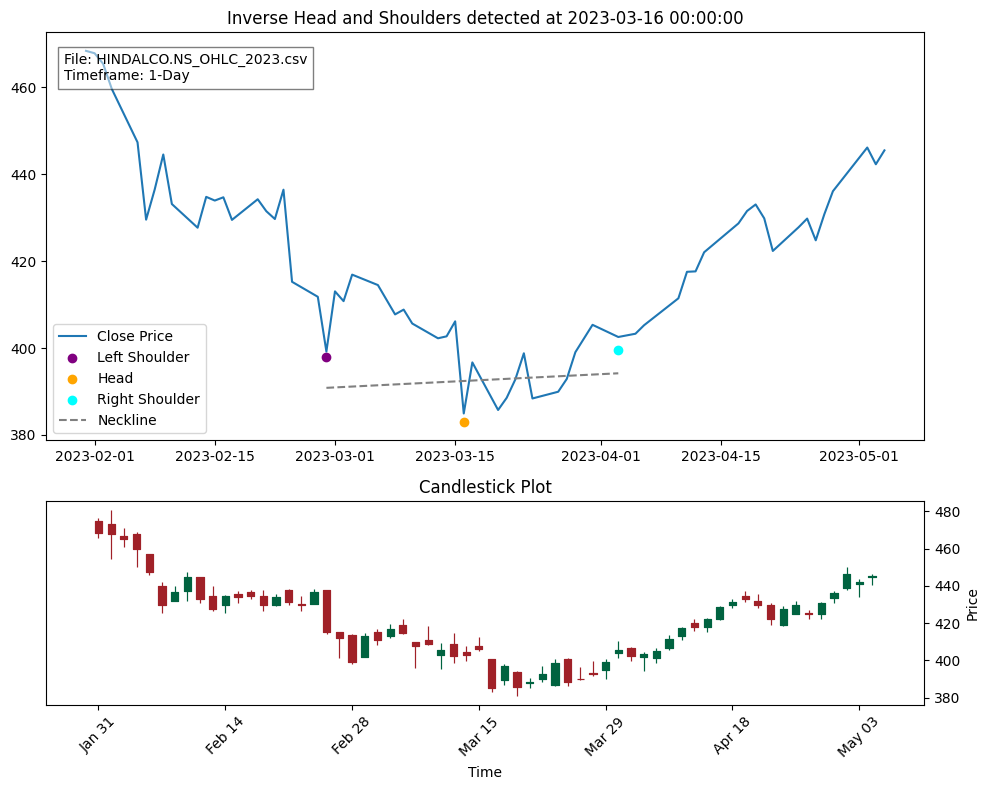

File: D:\AlgoT\yfinanceData\HINDUNILVR.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (34, Timestamp('2023-02-20 00:00:00'), 2508.199951171875), Head: (50, Timestamp('2023-03-15 00:00:00'), 2393.0), Right Shoulder: (67, Timestamp('2023-04-12 00:00:00'), 2518.64990234375)


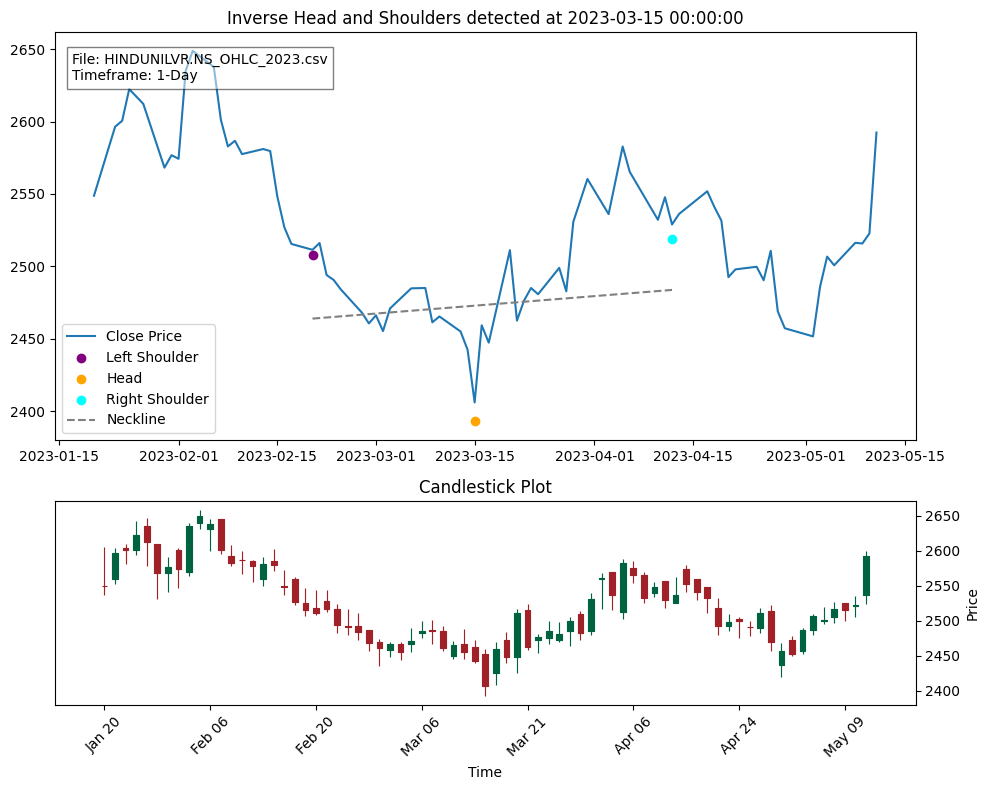

File: D:\AlgoT\yfinanceData\INDUSINDBK.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (37, Timestamp('2023-02-23 00:00:00'), 1066.6500244140625), Head: (53, Timestamp('2023-03-20 00:00:00'), 990.2000122070312), Right Shoulder: (65, Timestamp('2023-04-10 00:00:00'), 1063.0)


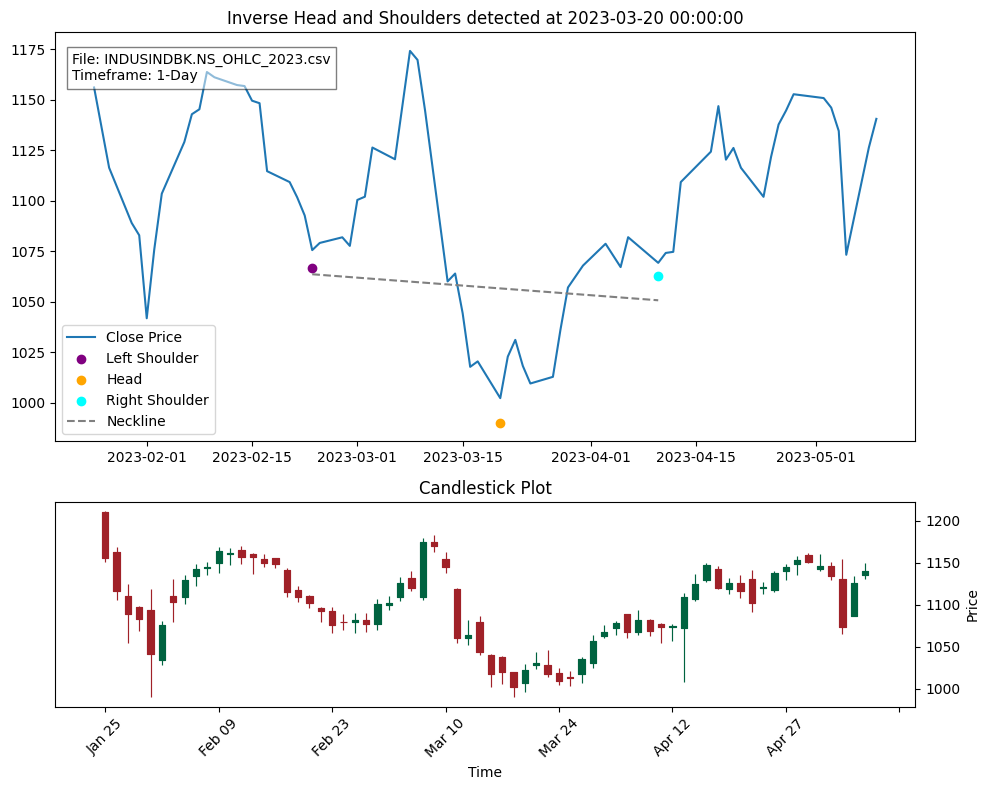

File: D:\AlgoT\yfinanceData\IOC.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (146, Timestamp('2023-08-04 00:00:00'), 92.0500030517578), Head: (165, Timestamp('2023-09-01 00:00:00'), 88.75), Right Shoulder: (177, Timestamp('2023-09-20 00:00:00'), 91.4000015258789)


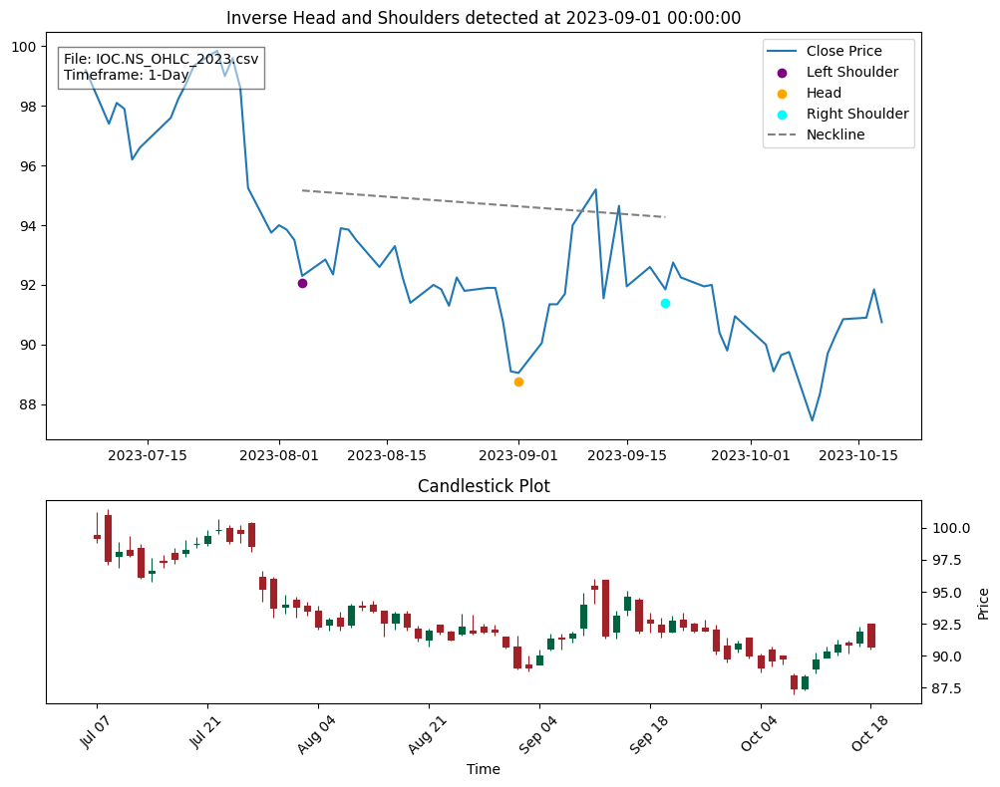

File: D:\AlgoT\yfinanceData\MARUTI.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (104, Timestamp('2023-06-06 00:00:00'), 9770.0), Head: (124, Timestamp('2023-07-05 00:00:00'), 10036.9501953125), Right Shoulder: (142, Timestamp('2023-07-31 00:00:00'), 9837.7001953125)


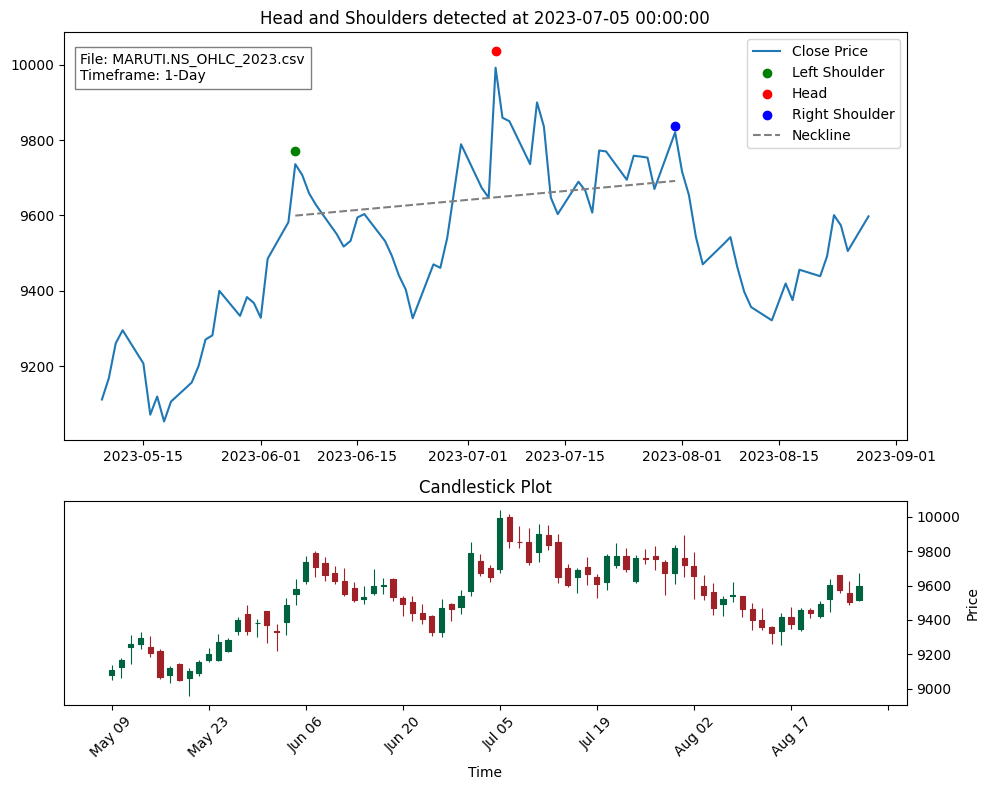

File: D:\AlgoT\yfinanceData\POWERGRID.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (87, Timestamp('2023-05-12 00:00:00'), 180.8625030517578), Head: (101, Timestamp('2023-06-01 00:00:00'), 172.53750610351562), Right Shoulder: (113, Timestamp('2023-06-19 00:00:00'), 181.8000030517578)


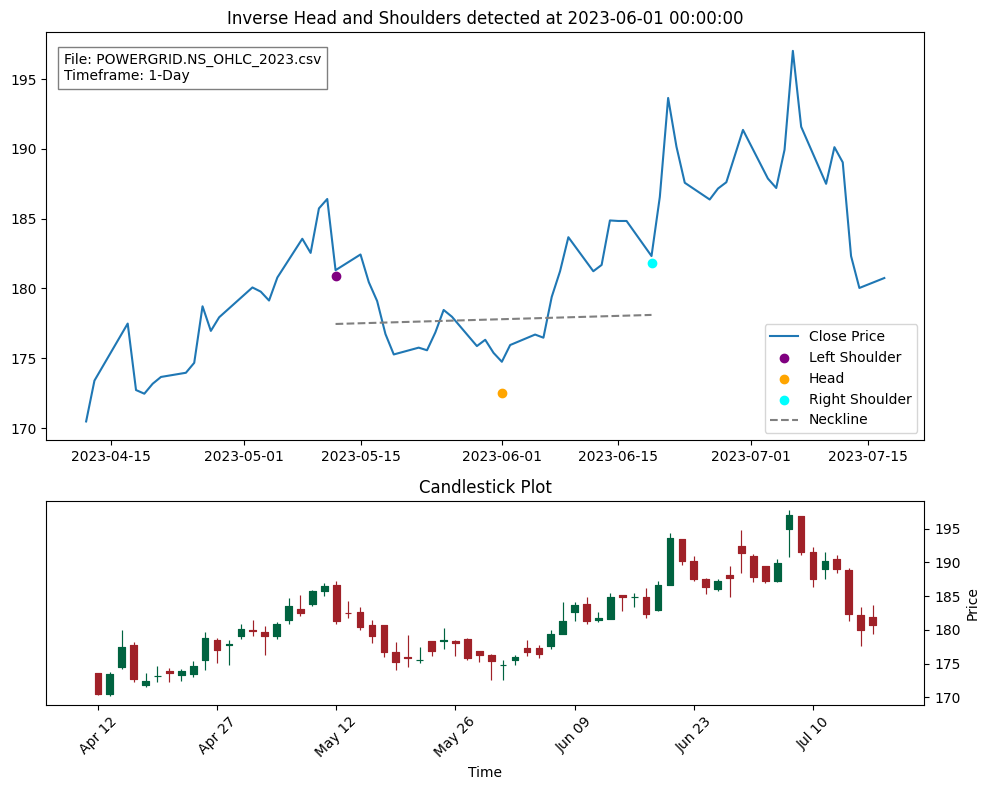

File: D:\AlgoT\yfinanceData\RELIANCE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 2135.498291015625), Head: (53, Timestamp('2023-03-20 00:00:00'), 2012.1392822265625), Right Shoulder: (65, Timestamp('2023-04-10 00:00:00'), 2142.789794921875)


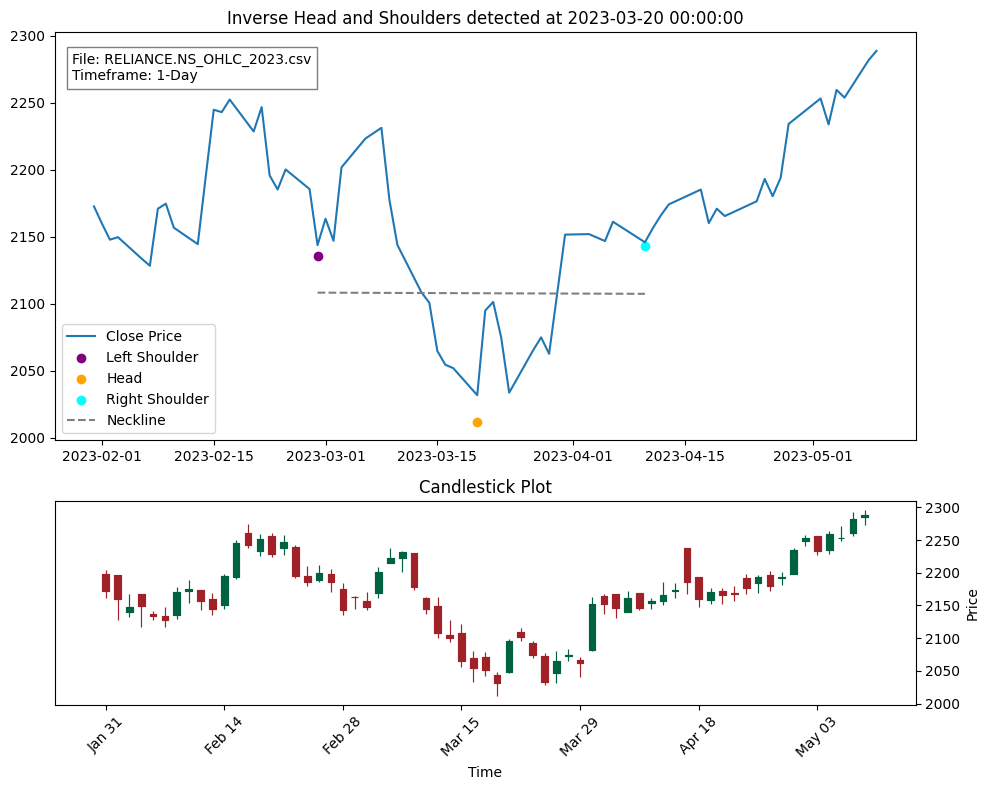

File: D:\AlgoT\yfinanceData\RELIANCE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (189, Timestamp('2023-10-09 00:00:00'), 2295.0), Head: (201, Timestamp('2023-10-26 00:00:00'), 2220.300048828125), Right Shoulder: (213, Timestamp('2023-11-13 00:00:00'), 2311.699951171875)


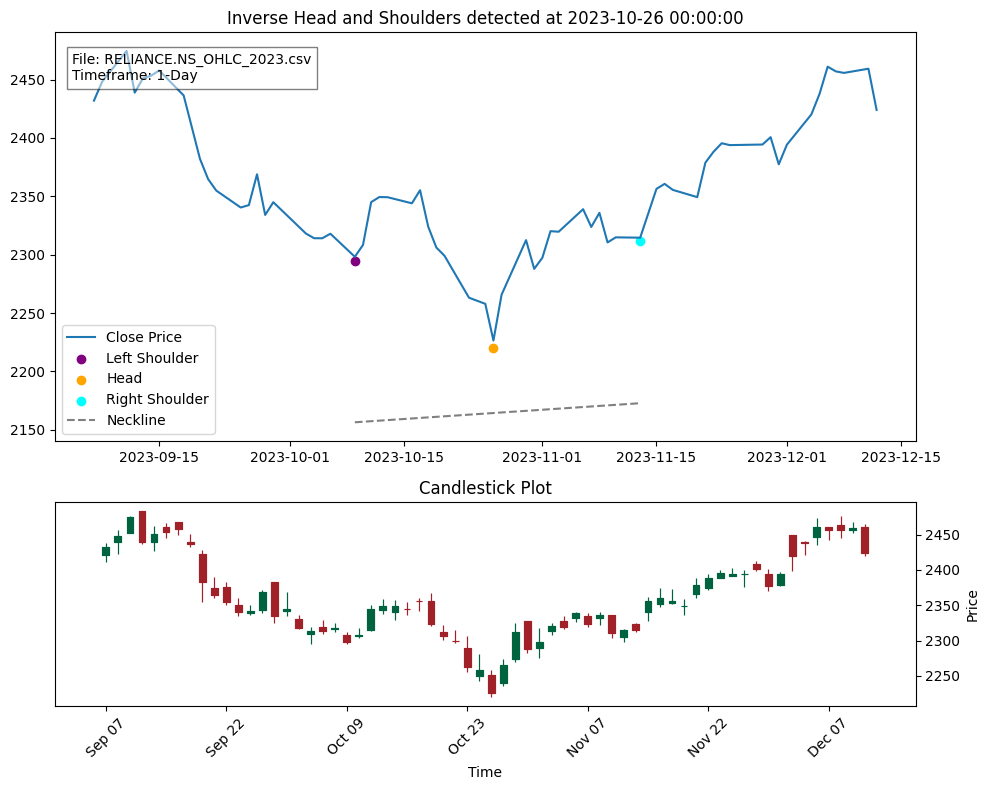

File: D:\AlgoT\yfinanceData\SBILIFE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (219, Timestamp('2023-11-22 00:00:00'), 1438.550048828125), Head: (232, Timestamp('2023-12-12 00:00:00'), 1491.9000244140625), Right Shoulder: (243, Timestamp('2023-12-28 00:00:00'), 1444.949951171875)


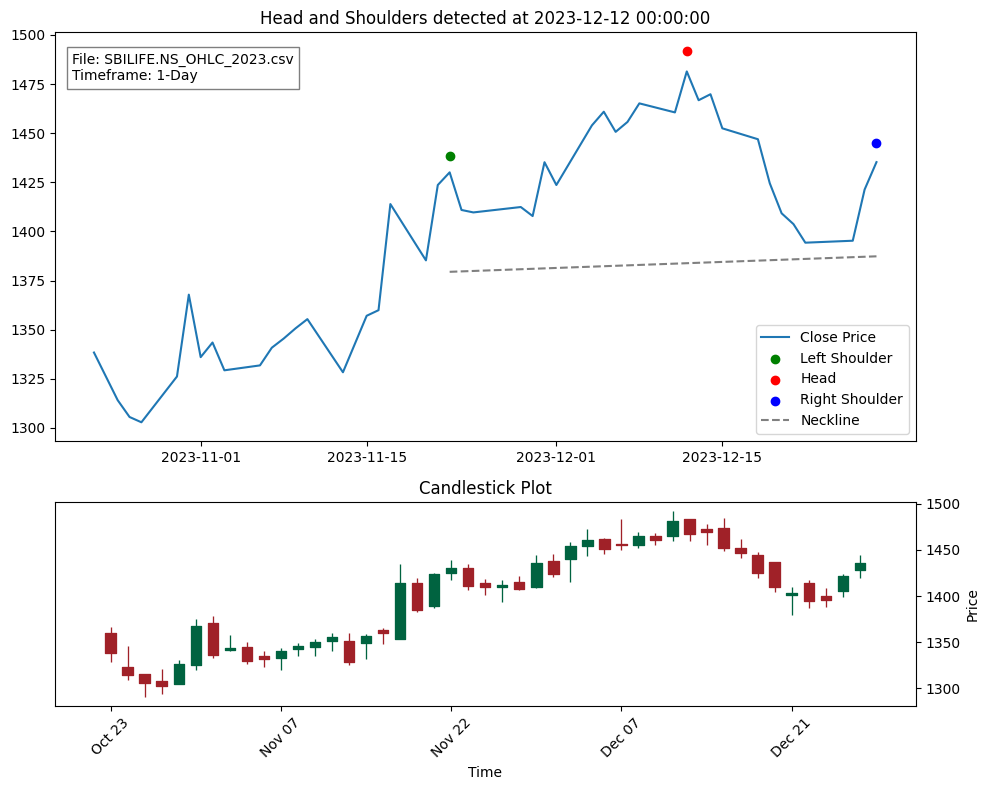

File: D:\AlgoT\yfinanceData\SUNPHARMA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (173, Timestamp('2023-09-13 00:00:00'), 1156.699951171875), Head: (184, Timestamp('2023-09-29 00:00:00'), 1167.4000244140625), Right Shoulder: (196, Timestamp('2023-10-18 00:00:00'), 1161.800048828125)


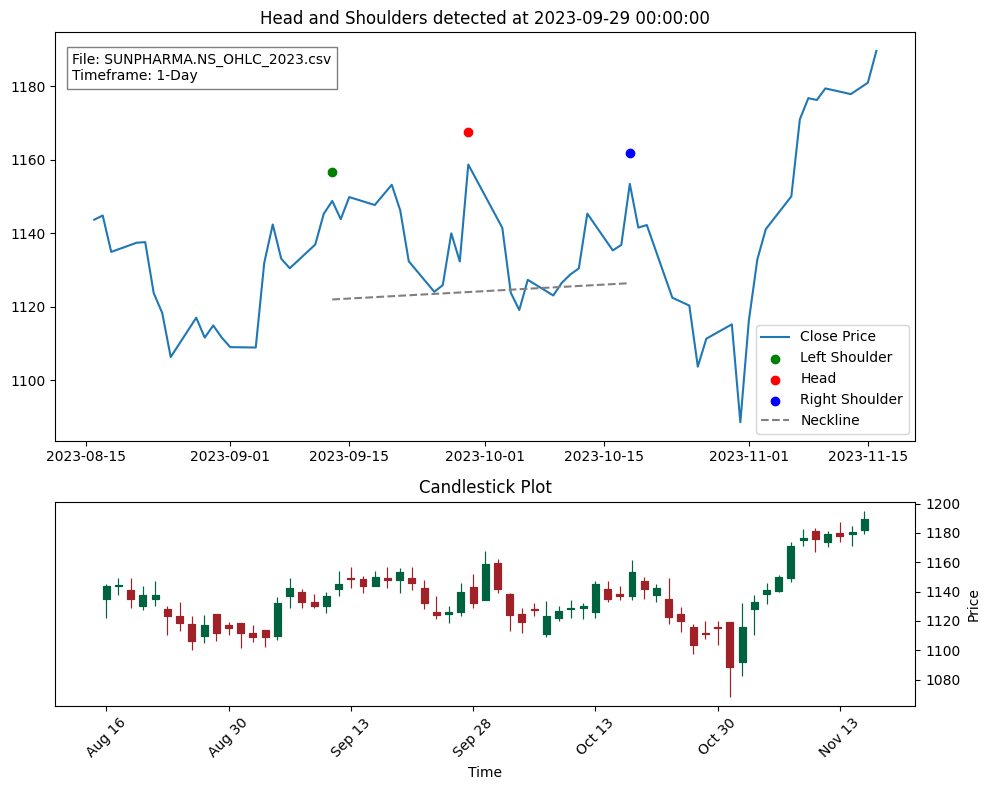

File: D:\AlgoT\yfinanceData\TATACONSUM.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (175, Timestamp('2023-09-15 00:00:00'), 873.5), Head: (187, Timestamp('2023-10-05 00:00:00'), 857.5), Right Shoulder: (201, Timestamp('2023-10-26 00:00:00'), 872.0)


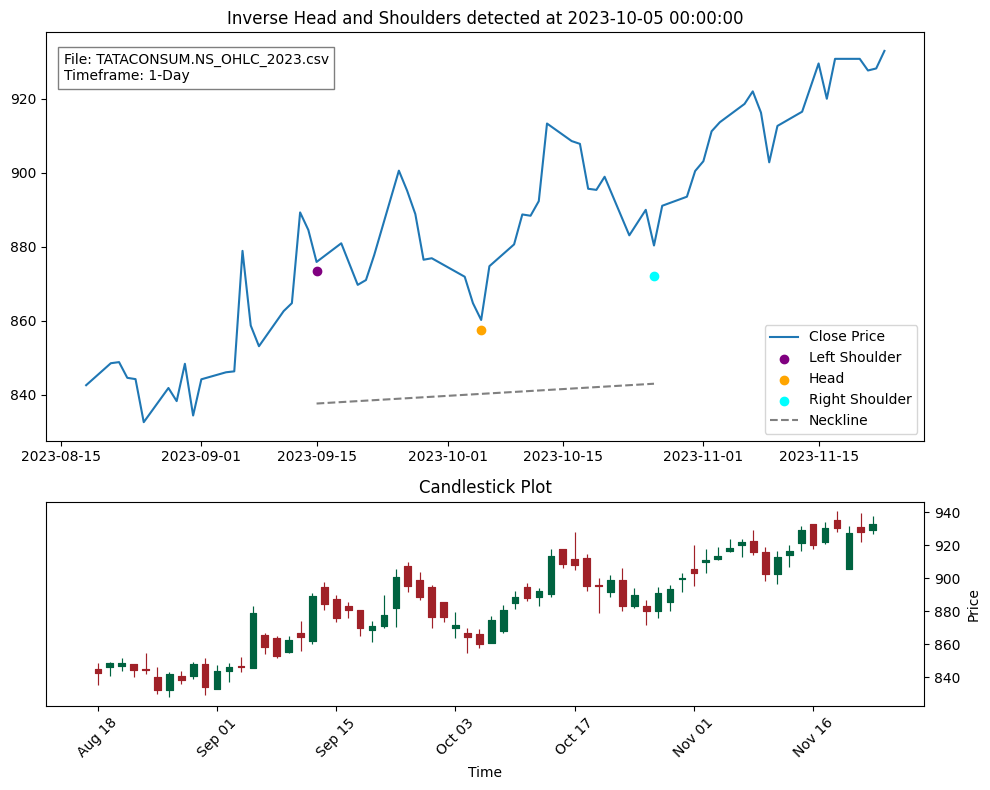

File: D:\AlgoT\yfinanceData\TITAN.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (10, Timestamp('2023-01-16 00:00:00'), 2392.0), Head: (22, Timestamp('2023-02-02 00:00:00'), 2269.60009765625), Right Shoulder: (37, Timestamp('2023-02-23 00:00:00'), 2380.0)


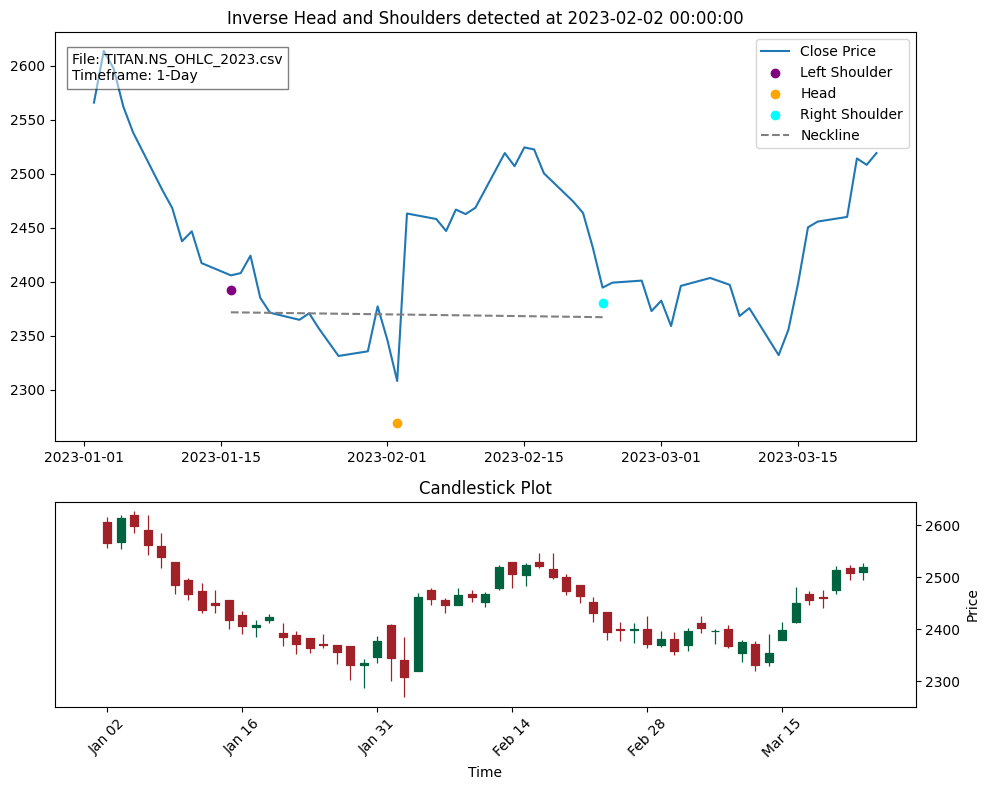

File: D:\AlgoT\yfinanceData\UPL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (90, Timestamp('2023-05-17 00:00:00'), 683.4500122070312), Head: (104, Timestamp('2023-06-06 00:00:00'), 696.9500122070312), Right Shoulder: (121, Timestamp('2023-06-30 00:00:00'), 688.25)


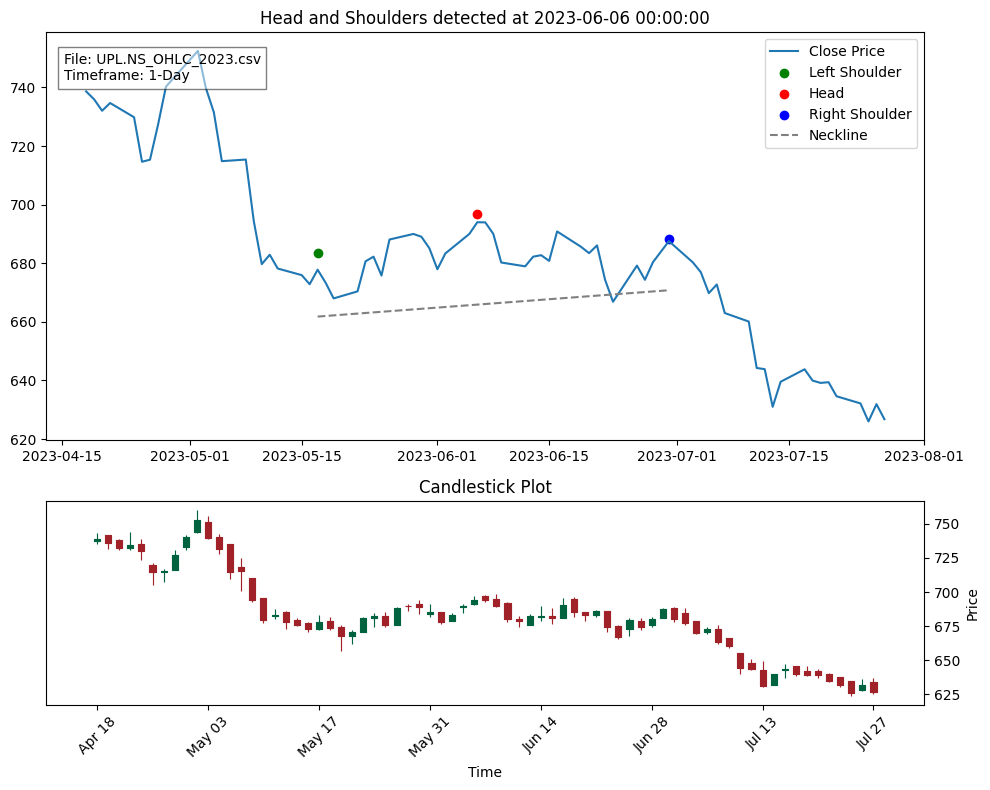

File: D:\AlgoT\yfinanceData\WIPRO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (153, Timestamp('2023-08-16 00:00:00'), 420.2000122070313), Head: (175, Timestamp('2023-09-15 00:00:00'), 443.75), Right Shoulder: (191, Timestamp('2023-10-11 00:00:00'), 423.9500122070313)


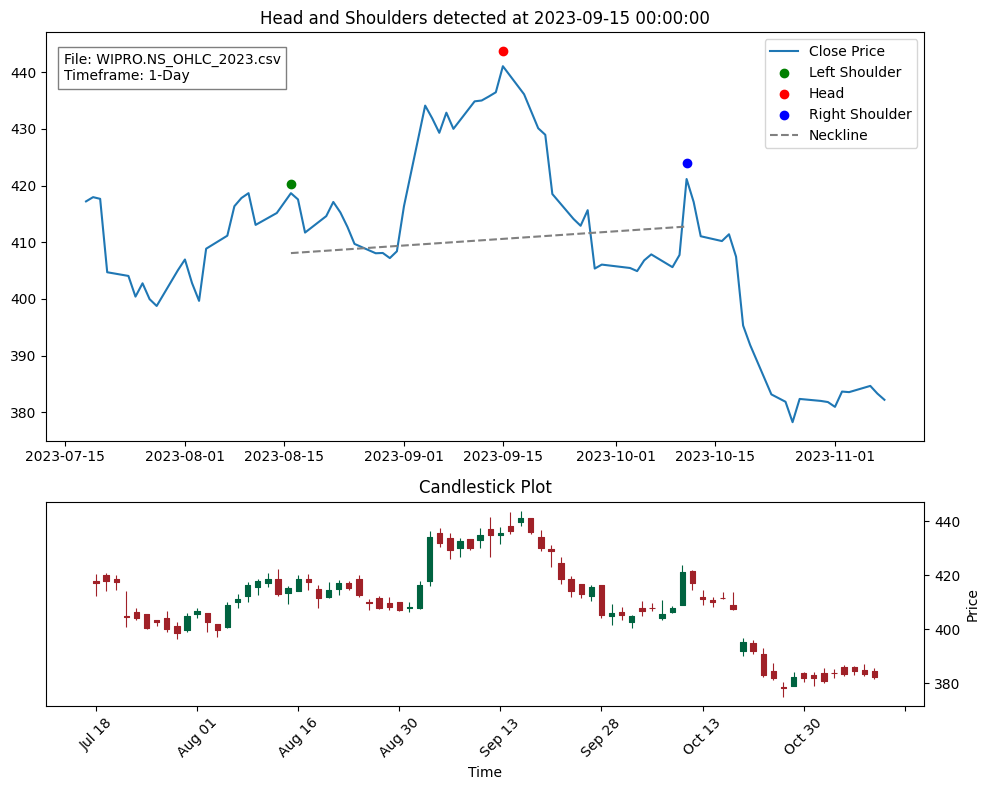

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils
import os
import glob
from scipy.stats import linregress

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, troughs, data):
    patterns = []
    
    # Detect regular head and shoulders
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is higher than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Calculate slanted neckline using linear regression on the close prices at troughs
            troughs_close_prices = [data['Close'][left_shoulder[0]], data['Close'][head[0]], data['Close'][right_shoulder[0]]]
            troughs_indices = [left_shoulder[0], head[0], right_shoulder[0]]
            slope, intercept, _, _, _ = linregress(troughs_indices, troughs_close_prices)
            
            patterns.append({
                'type': 'Head and Shoulders',
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'slope': slope,
                'intercept': intercept
            })
    
    # Detect inverse head and shoulders
    for i in range(1, len(troughs) - 1):
        left_shoulder = troughs[i-1]
        head = troughs[i]
        right_shoulder = troughs[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is lower than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] > head[2] and right_shoulder[2] > head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Calculate slanted neckline using linear regression on the close prices at peaks
            peaks_close_prices = [data['Close'][left_shoulder[0]], data['Close'][head[0]], data['Close'][right_shoulder[0]]]
            peaks_indices = [left_shoulder[0], head[0], right_shoulder[0]]
            slope, intercept, _, _, _ = linregress(peaks_indices, peaks_close_prices)
            
            patterns.append({
                'type': 'Inverse Head and Shoulders',
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'slope': slope,
                'intercept': intercept
            })
    
    return patterns

# Function to process a single CSV file
def process_csv_file(file_path):
    data = pd.read_csv(file_path)
    if data.empty or 'Close' not in data.columns:
        print(f"Skipping {file_path}: Empty or missing 'Close' data.")
        return
    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index('Date', inplace=True)
    
    timeframes = {'1-Day': data}

    for timeframe, resampled_data in timeframes.items():
        # Find peaks and troughs in the data
        peaks, troughs = find_peaks_and_troughs(resampled_data)
        
        # Detect Head and Shoulders patterns
        patterns = detect_head_and_shoulders(peaks, troughs, resampled_data)
        
        # Display detected patterns and plot the chart for each pattern
        for pattern in patterns:
            print(f"File: {file_path}, Timeframe: {timeframe}, Type: {pattern['type']}")
            print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}")
            
            start_index = max(0, pattern['left_shoulder'][0] - 20)
            end_index = min(len(resampled_data) - 1, pattern['right_shoulder'][0] + 20)
            pattern_data = resampled_data.iloc[start_index:end_index]
            
            # Setup figure and subplots
            fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})
            
            # First subplot for the pattern
            ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
            if pattern['type'] == 'Head and Shoulders':
                ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
                ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
                ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
                
                # Plot slanted neckline
                neckline_x = np.array([pattern_data.index.get_loc(pattern['left_shoulder'][1]), pattern_data.index.get_loc(pattern['right_shoulder'][1])])
                neckline_y = pattern['slope'] * neckline_x + pattern['intercept']
                ax.plot(pattern_data.index[neckline_x], neckline_y, color='gray', linestyle='--', label='Neckline')
                
                ax.set_title(f"{pattern['type']} detected at {pattern['head'][1]}")
            else:
                ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='purple', label='Left Shoulder')
                ax.scatter(pattern['head'][1], pattern['head'][2], color='orange', label='Head')
                ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='cyan', label='Right Shoulder')
                
                # Plot slanted neckline
                neckline_x = np.array([pattern_data.index.get_loc(pattern['left_shoulder'][1]), pattern_data.index.get_loc(pattern['right_shoulder'][1])])
                neckline_y = pattern['slope'] * neckline_x + pattern['intercept']
                ax.plot(pattern_data.index[neckline_x], neckline_y, color='gray', linestyle='--', label='Neckline')
                
                ax.set_title(f"{pattern['type']} detected at {pattern['head'][1]}")
            ax.legend()
            
            # Add file name and timeframe text
            ax.text(0.02, 0.95, f'File: {os.path.basename(file_path)}\nTimeframe: {timeframe}', transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
            
            # Second subplot for candlestick
            mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
            ax2.set_xlabel('Time')
            ax2.set_ylabel('Price')
            ax2.set_title('Candlestick Plot')
            
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

# Main function to process all CSV files in a directory
def process_all_csv_files_in_directory(directory_path):
    csv_files = glob.glob(os.path.join(directory_path, "*.csv"))
    
    for file_path in csv_files:
        process_csv_file(file_path)

# Example usage
directory_path = r"D:\AlgoT\yfinanceData"
process_all_csv_files_in_directory(directory_path)


File: D:\AlgoT\yfinanceData\BAJAJFINSV.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (180, Timestamp('2023-09-25 00:00:00'), 1591.0), Head: (195, Timestamp('2023-10-17 00:00:00'), 1676.75), Right Shoulder: (206, Timestamp('2023-11-02 00:00:00'), 1592.5999755859375)


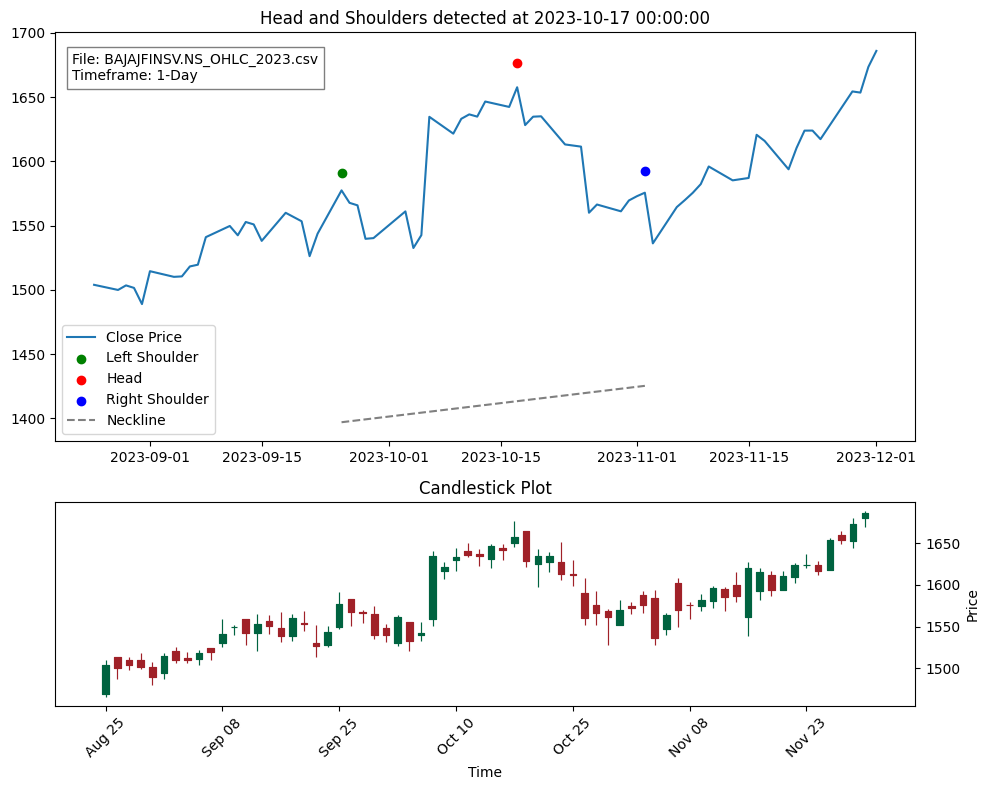

File: D:\AlgoT\yfinanceData\BPCL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (88, Timestamp('2023-05-15 00:00:00'), 178.1750030517578), Head: (104, Timestamp('2023-06-06 00:00:00'), 177.3000030517578), Right Shoulder: (118, Timestamp('2023-06-26 00:00:00'), 177.8249969482422)


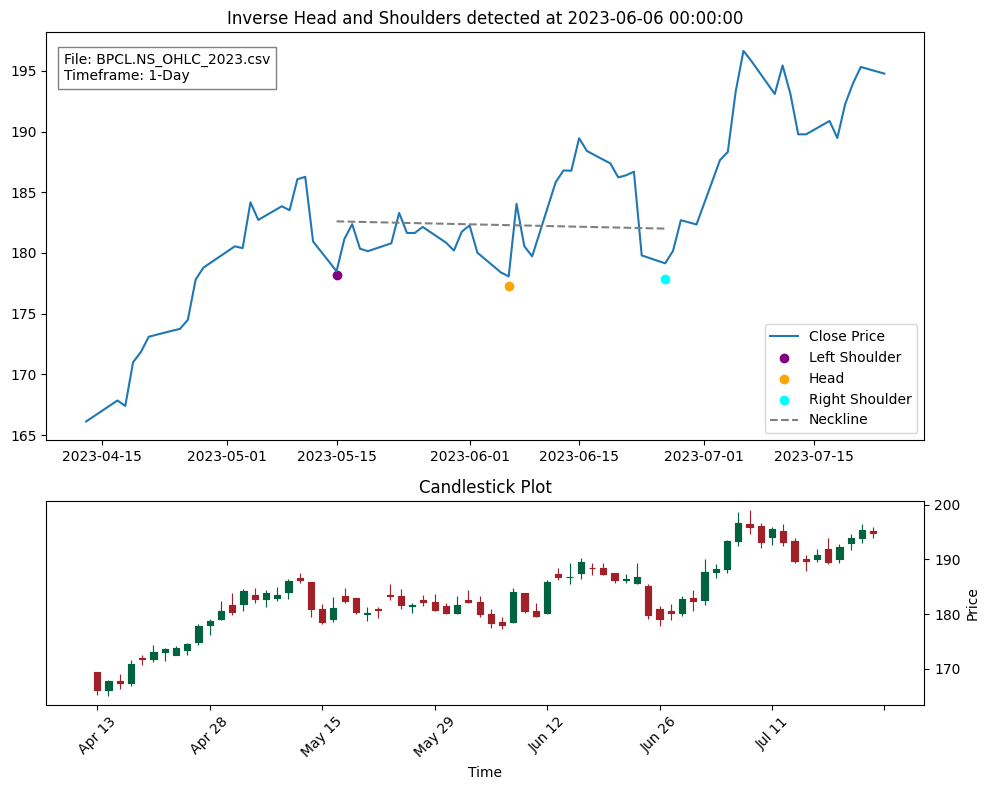

File: D:\AlgoT\yfinanceData\BPCL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (152, Timestamp('2023-08-14 00:00:00'), 175.64999389648438), Head: (164, Timestamp('2023-08-31 00:00:00'), 169.5500030517578), Right Shoulder: (175, Timestamp('2023-09-15 00:00:00'), 175.625)


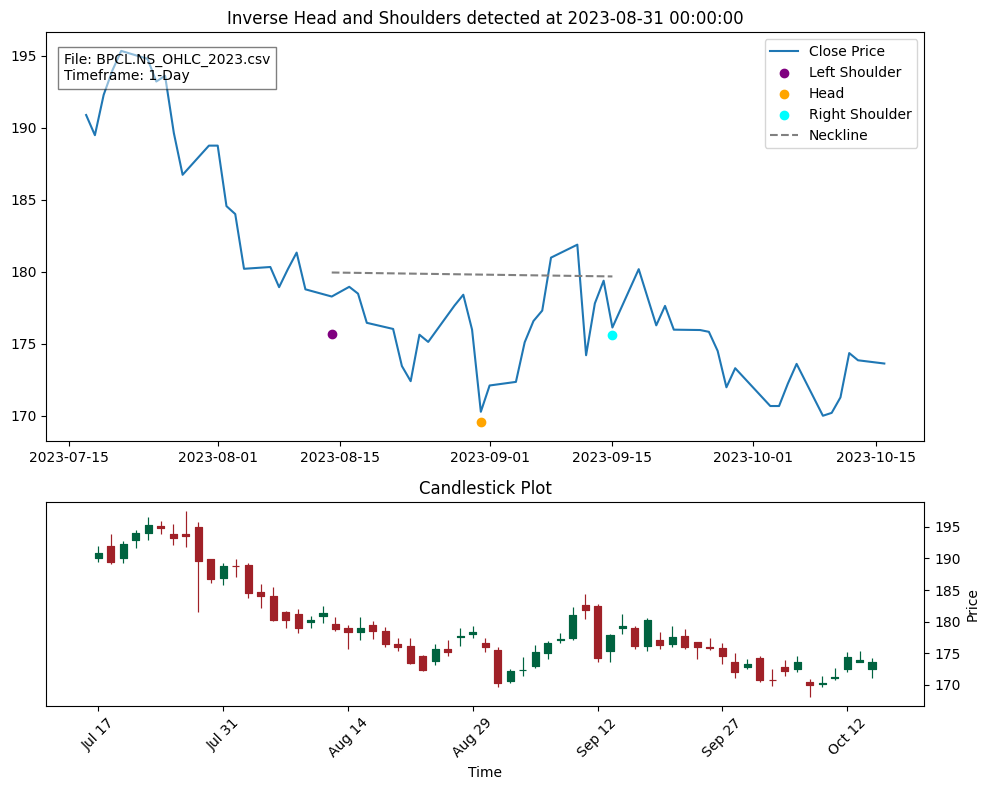

File: D:\AlgoT\yfinanceData\COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (11, Timestamp('2023-01-17 00:00:00'), 211.1000061035156), Head: (28, Timestamp('2023-02-10 00:00:00'), 210.9499969482422), Right Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 212.0)


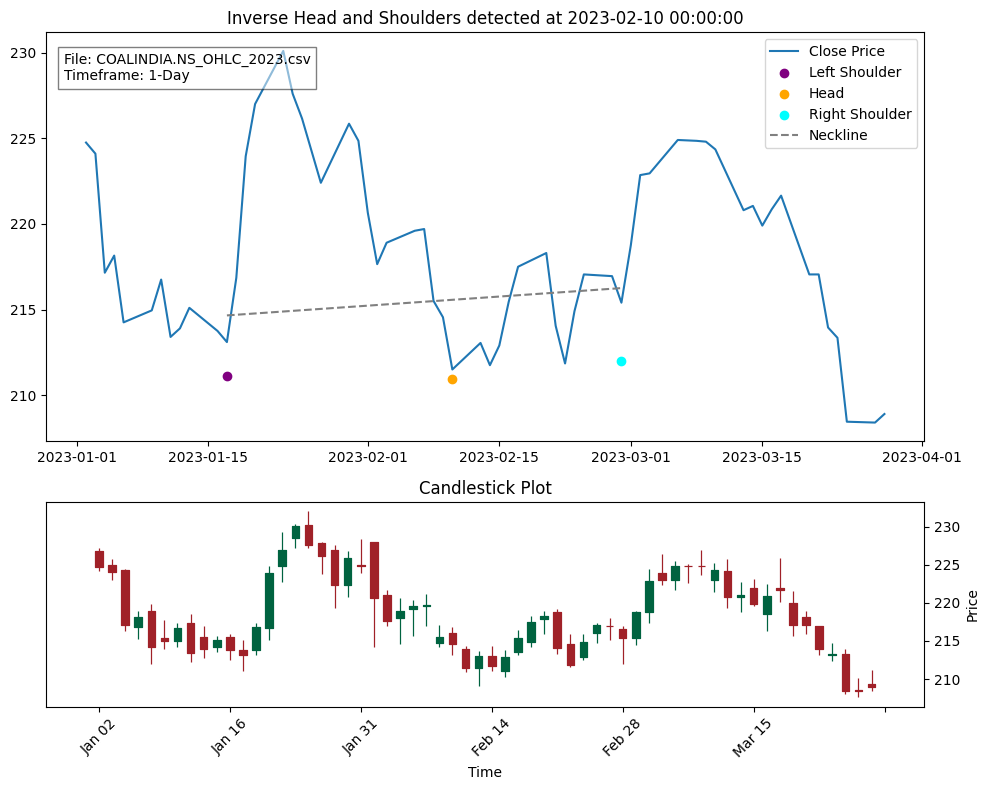

File: D:\AlgoT\yfinanceData\COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (107, Timestamp('2023-06-09 00:00:00'), 227.3500061035156), Head: (118, Timestamp('2023-06-26 00:00:00'), 223.25), Right Shoulder: (130, Timestamp('2023-07-13 00:00:00'), 229.0)


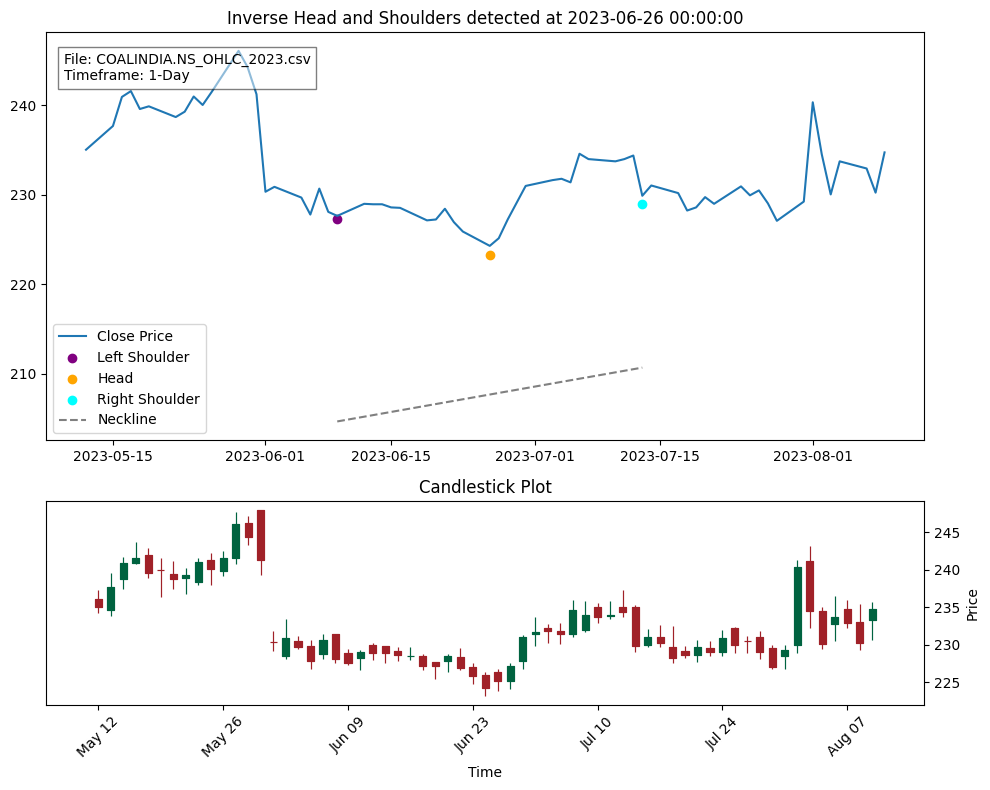

File: D:\AlgoT\yfinanceData\COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (130, Timestamp('2023-07-13 00:00:00'), 229.0), Head: (141, Timestamp('2023-07-28 00:00:00'), 226.8500061035156), Right Shoulder: (155, Timestamp('2023-08-18 00:00:00'), 227.0)


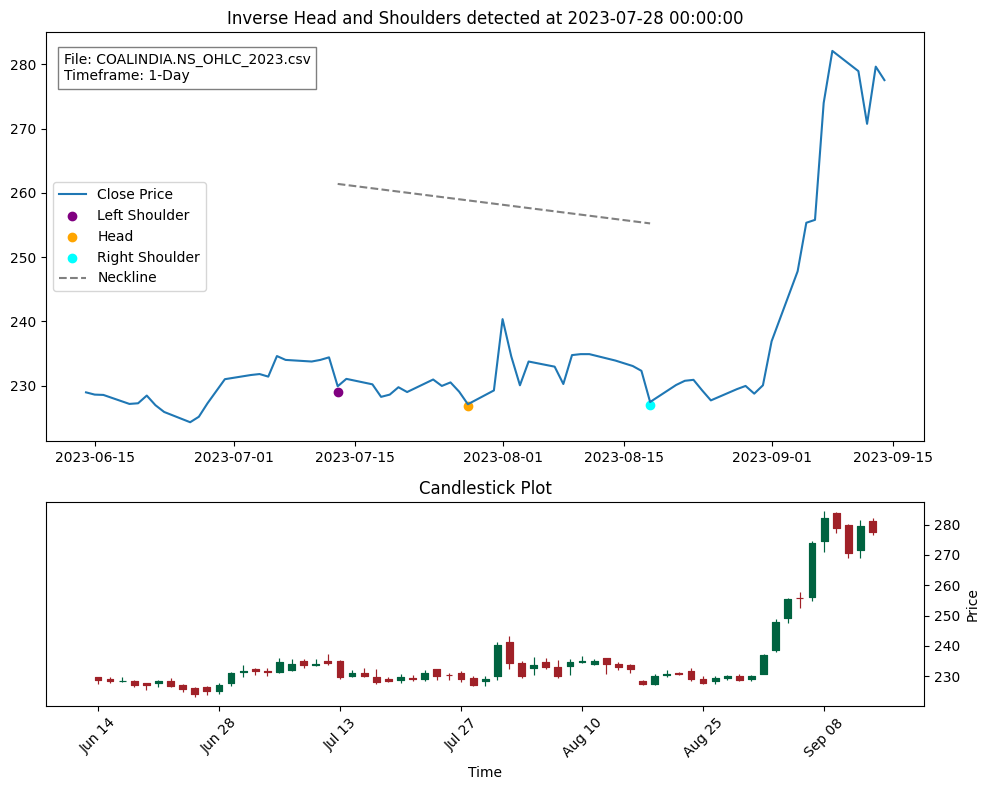

File: D:\AlgoT\yfinanceData\DIVISLAB.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (136, Timestamp('2023-07-21 00:00:00'), 3747.0), Head: (147, Timestamp('2023-08-07 00:00:00'), 3920.0), Right Shoulder: (158, Timestamp('2023-08-23 00:00:00'), 3728.800048828125)


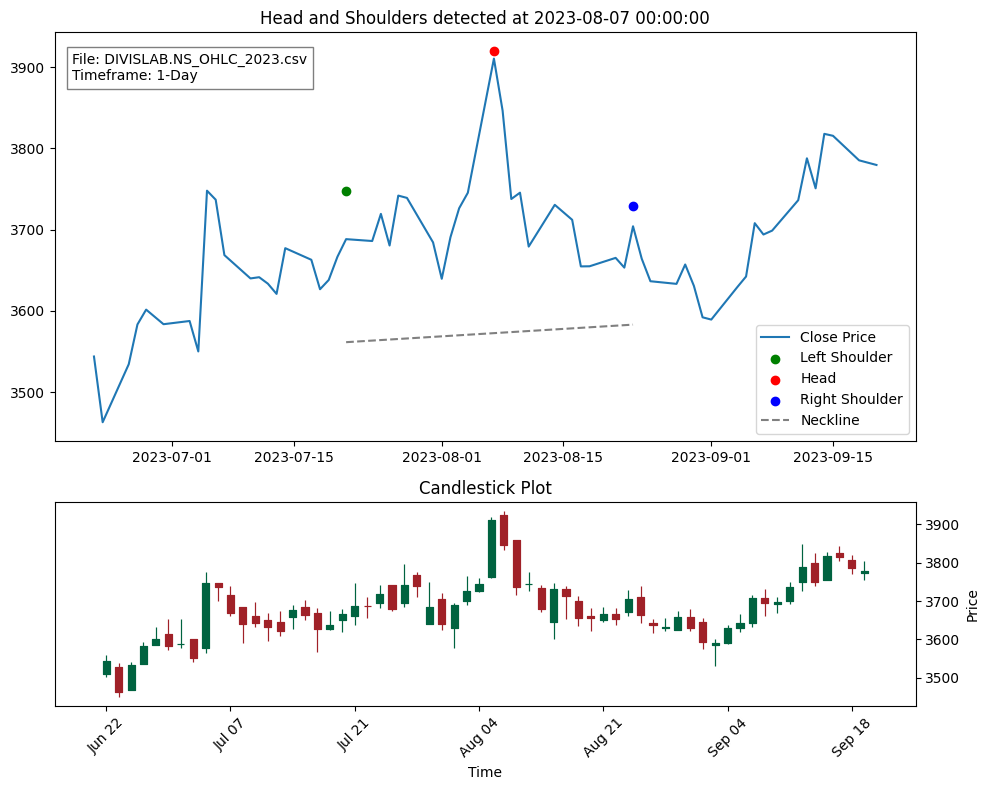

File: D:\AlgoT\yfinanceData\EICHERMOT.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (140, Timestamp('2023-07-27 00:00:00'), 3320.39990234375), Head: (154, Timestamp('2023-08-17 00:00:00'), 3291.75), Right Shoulder: (173, Timestamp('2023-09-13 00:00:00'), 3308.0)


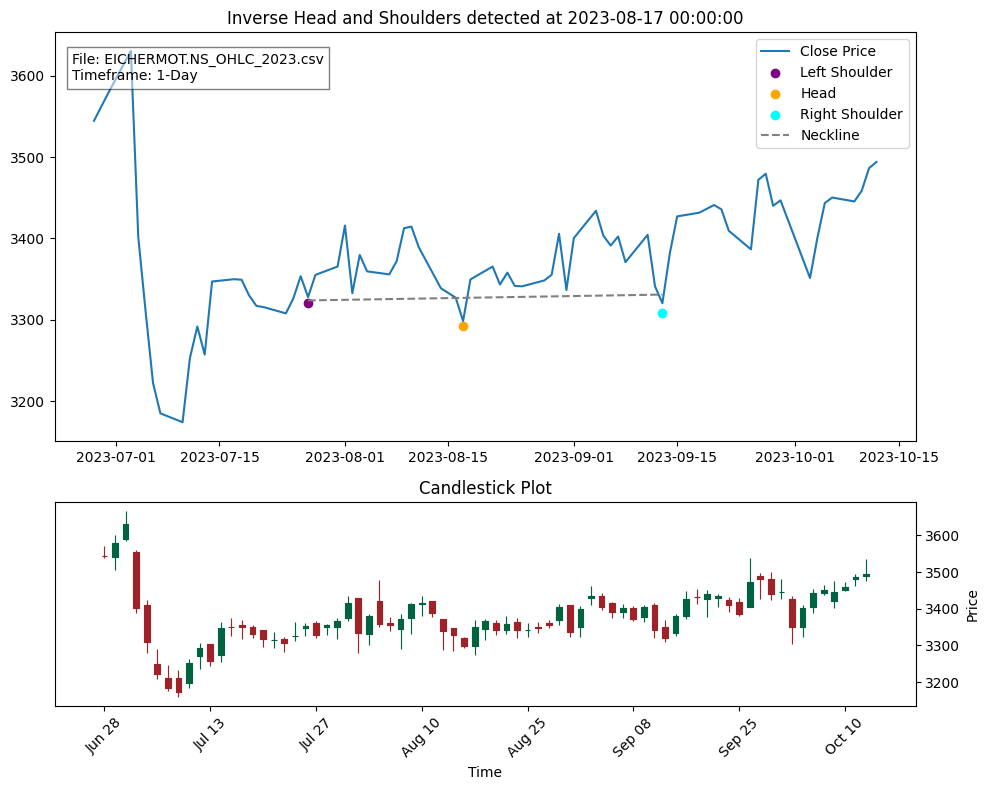

Skipping D:\AlgoT\yfinanceData\HDFC.NS_OHLC_2023.csv: Empty or missing 'Close' data.
File: D:\AlgoT\yfinanceData\HEROMOTOCO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 2410.35009765625), Head: (59, Timestamp('2023-03-28 00:00:00'), 2246.0), Right Shoulder: (70, Timestamp('2023-04-18 00:00:00'), 2425.0)


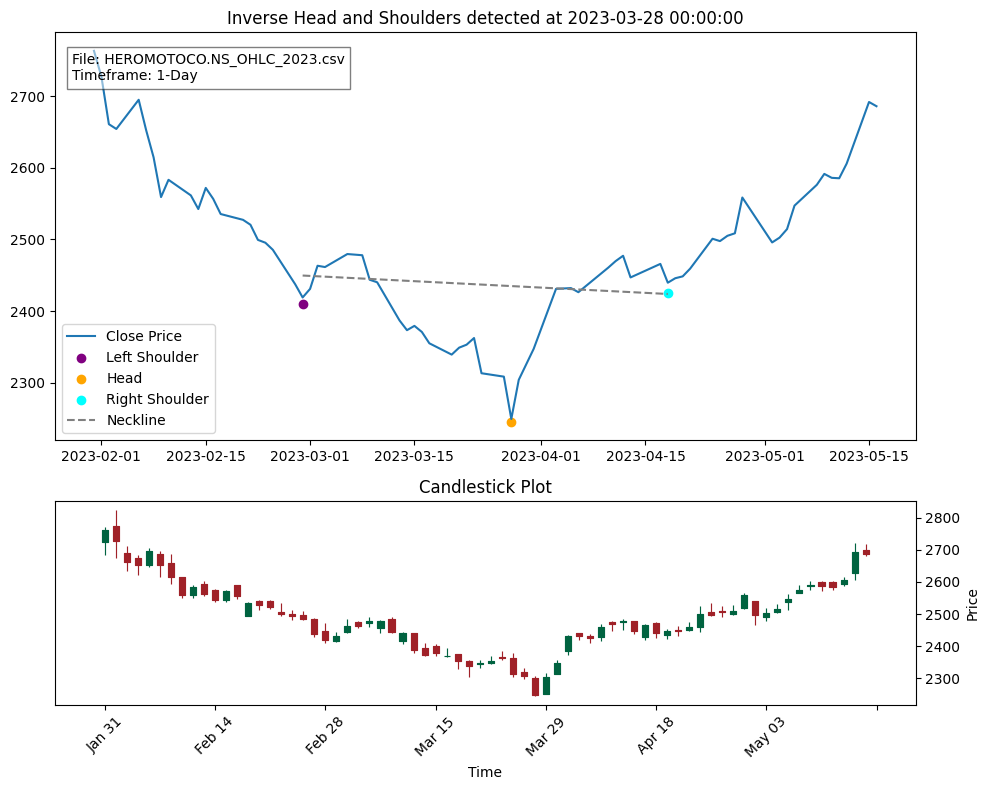

File: D:\AlgoT\yfinanceData\HINDALCO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 398.0), Head: (51, Timestamp('2023-03-16 00:00:00'), 383.1000061035156), Right Shoulder: (62, Timestamp('2023-04-03 00:00:00'), 399.5499877929688)


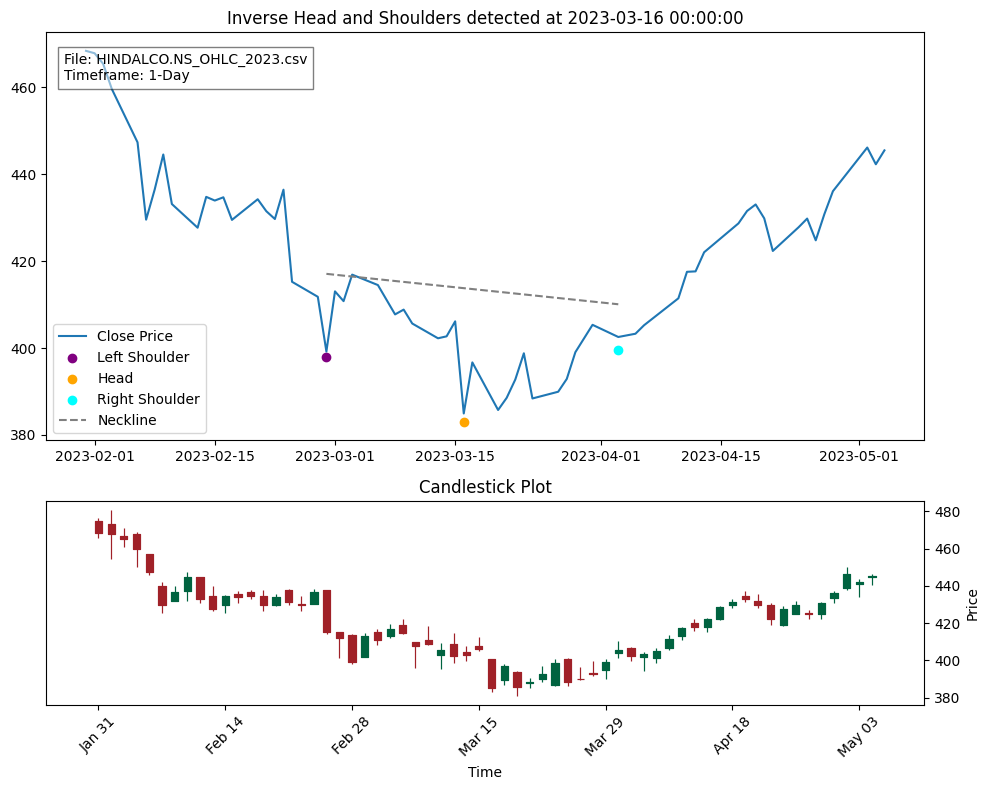

File: D:\AlgoT\yfinanceData\HINDUNILVR.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (34, Timestamp('2023-02-20 00:00:00'), 2508.199951171875), Head: (50, Timestamp('2023-03-15 00:00:00'), 2393.0), Right Shoulder: (67, Timestamp('2023-04-12 00:00:00'), 2518.64990234375)


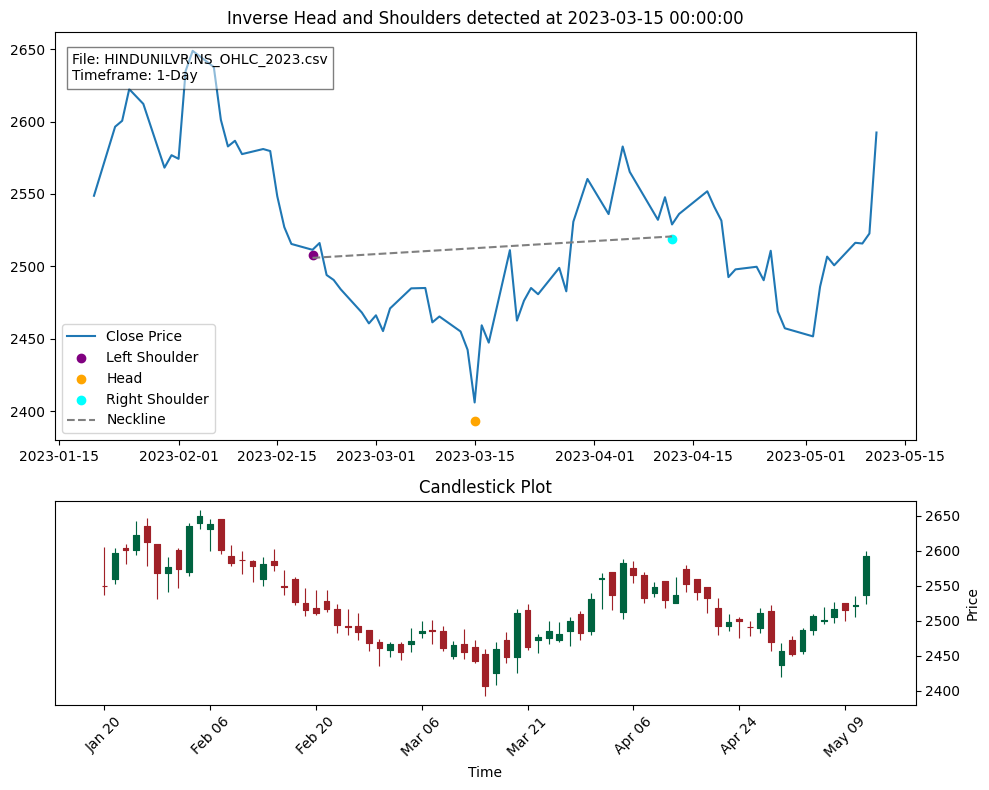

File: D:\AlgoT\yfinanceData\INDUSINDBK.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (37, Timestamp('2023-02-23 00:00:00'), 1066.6500244140625), Head: (53, Timestamp('2023-03-20 00:00:00'), 990.2000122070312), Right Shoulder: (65, Timestamp('2023-04-10 00:00:00'), 1063.0)


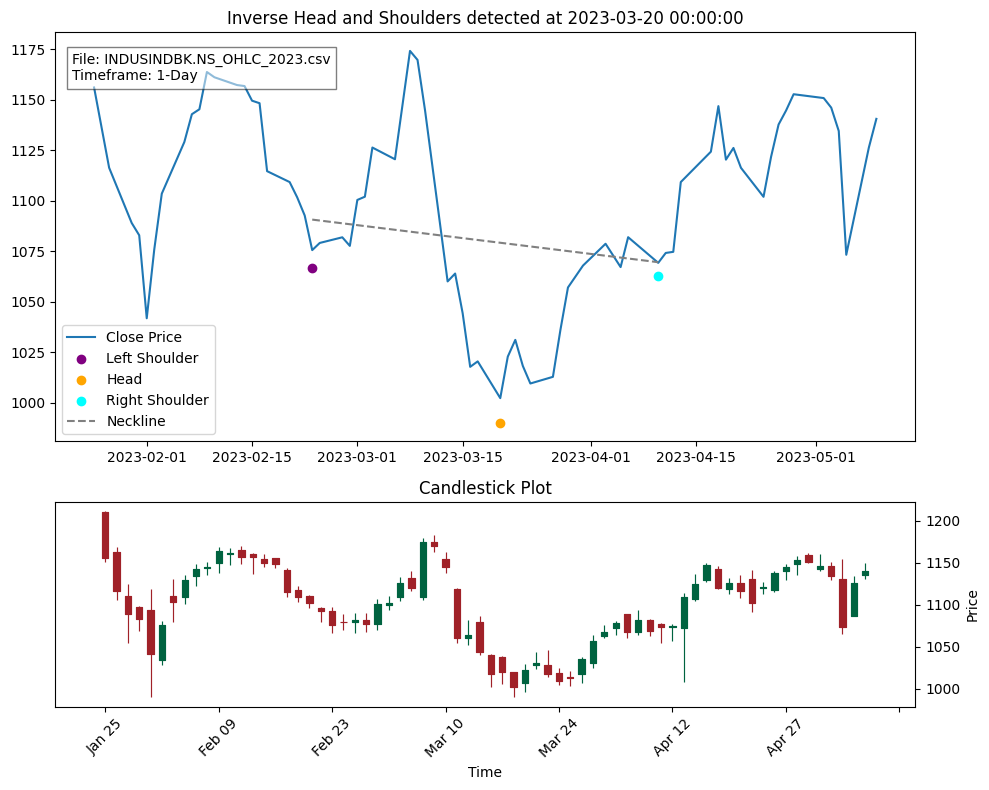

File: D:\AlgoT\yfinanceData\IOC.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (146, Timestamp('2023-08-04 00:00:00'), 92.0500030517578), Head: (165, Timestamp('2023-09-01 00:00:00'), 88.75), Right Shoulder: (177, Timestamp('2023-09-20 00:00:00'), 91.4000015258789)


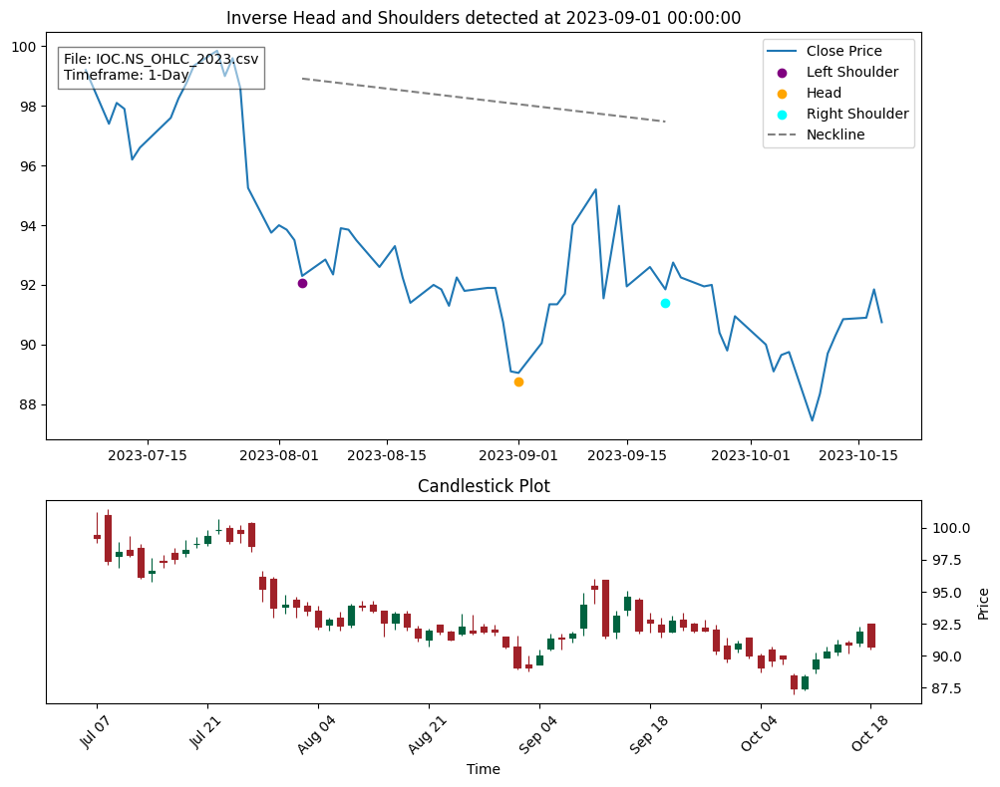

File: D:\AlgoT\yfinanceData\MARUTI.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (104, Timestamp('2023-06-06 00:00:00'), 9770.0), Head: (124, Timestamp('2023-07-05 00:00:00'), 10036.9501953125), Right Shoulder: (142, Timestamp('2023-07-31 00:00:00'), 9837.7001953125)


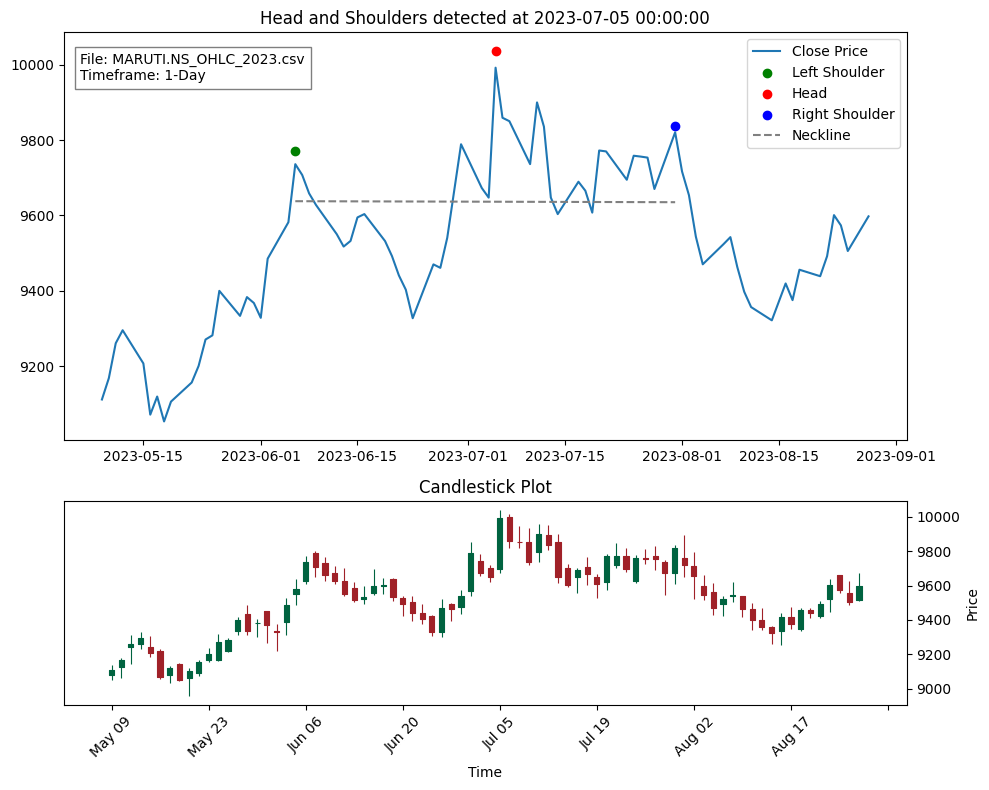

File: D:\AlgoT\yfinanceData\POWERGRID.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (87, Timestamp('2023-05-12 00:00:00'), 180.8625030517578), Head: (101, Timestamp('2023-06-01 00:00:00'), 172.53750610351562), Right Shoulder: (113, Timestamp('2023-06-19 00:00:00'), 181.8000030517578)


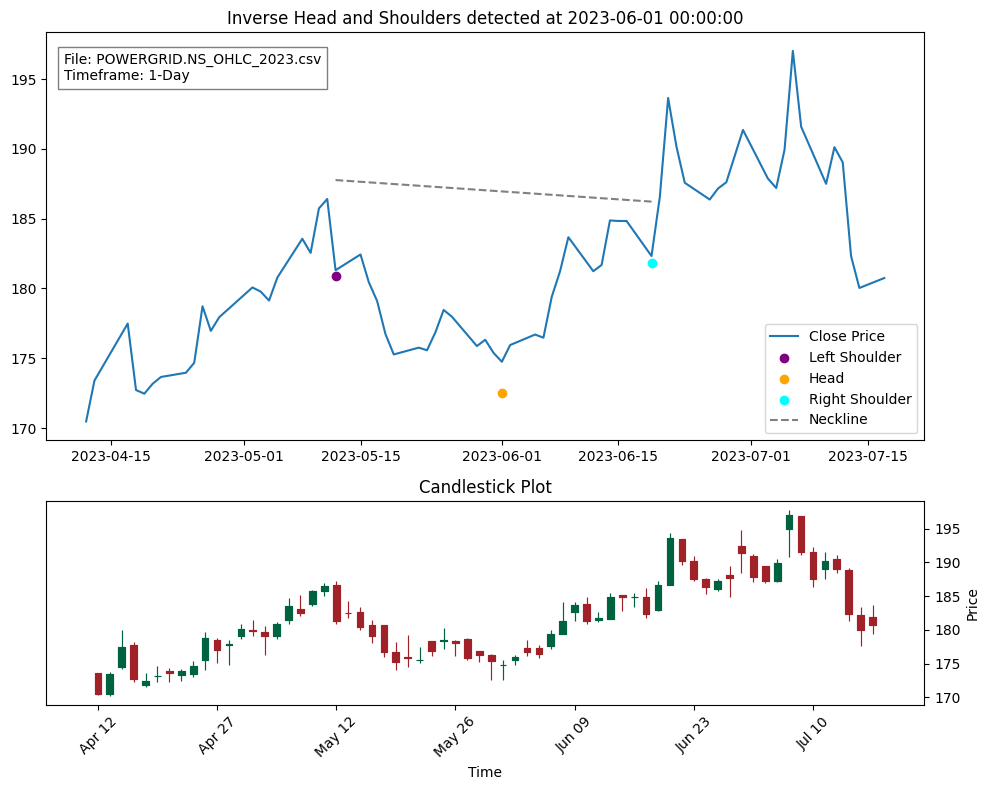

File: D:\AlgoT\yfinanceData\processed_BAJAJFINSV.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (180, Timestamp('2023-09-25 00:00:00'), 1591.0), Head: (195, Timestamp('2023-10-17 00:00:00'), 1676.75), Right Shoulder: (206, Timestamp('2023-11-02 00:00:00'), 1592.5999755859375)


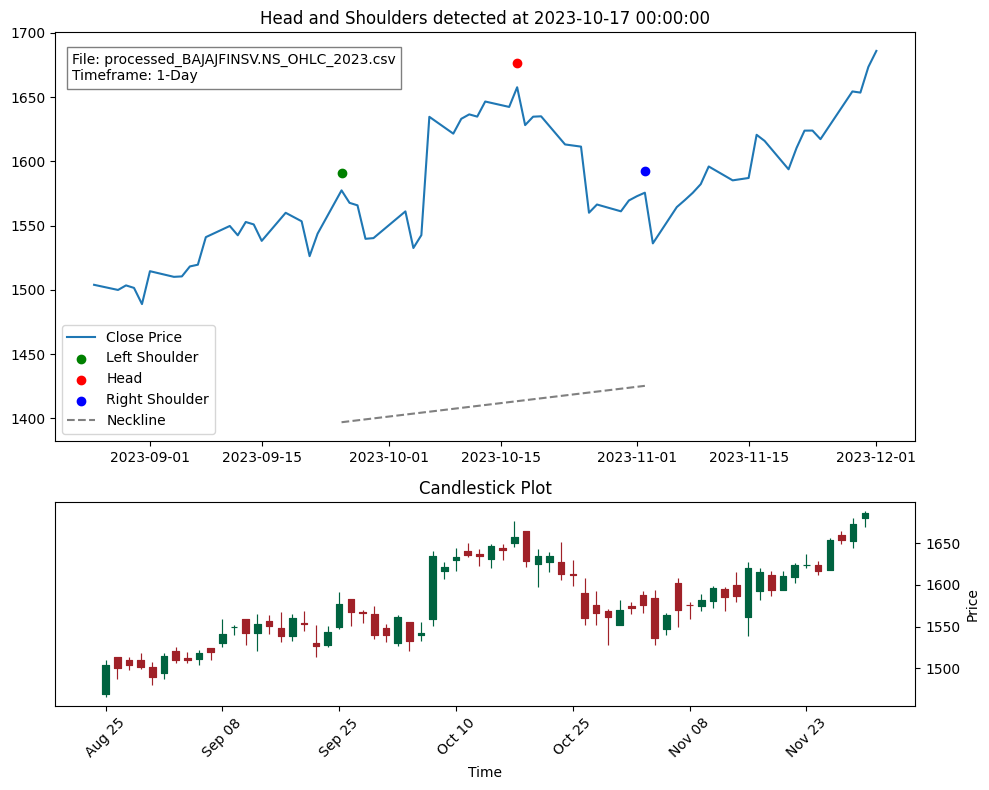

File: D:\AlgoT\yfinanceData\processed_BPCL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (88, Timestamp('2023-05-15 00:00:00'), 178.1750030517578), Head: (104, Timestamp('2023-06-06 00:00:00'), 177.3000030517578), Right Shoulder: (118, Timestamp('2023-06-26 00:00:00'), 177.8249969482422)


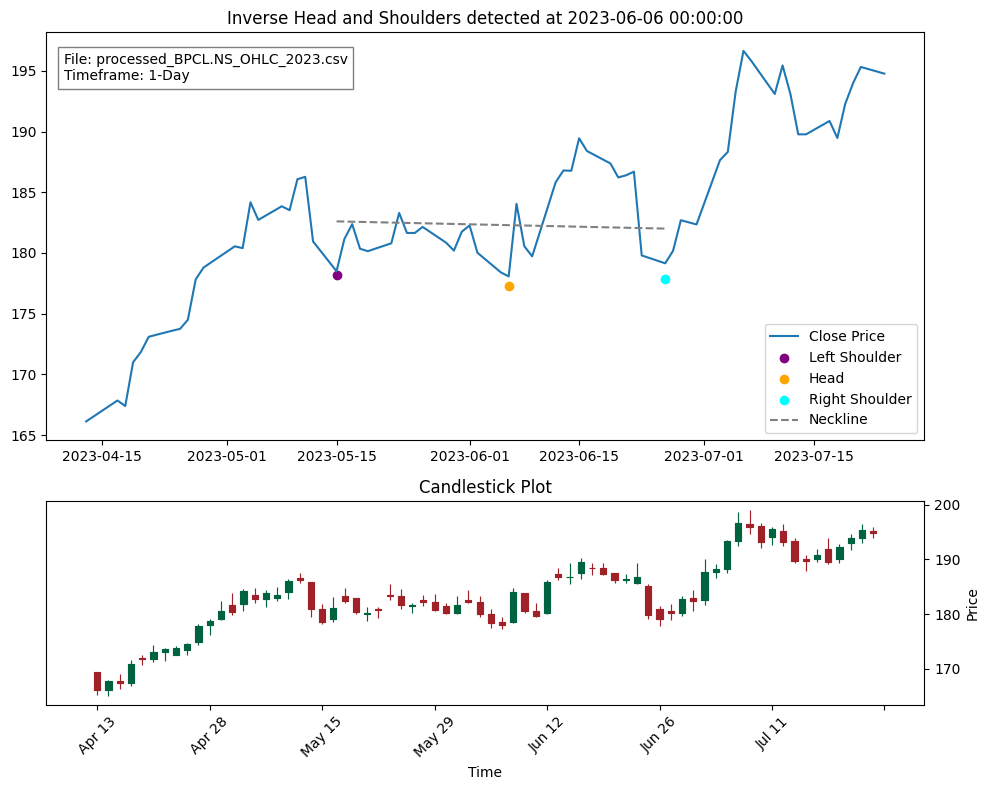

File: D:\AlgoT\yfinanceData\processed_BPCL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (152, Timestamp('2023-08-14 00:00:00'), 175.64999389648438), Head: (164, Timestamp('2023-08-31 00:00:00'), 169.5500030517578), Right Shoulder: (175, Timestamp('2023-09-15 00:00:00'), 175.625)


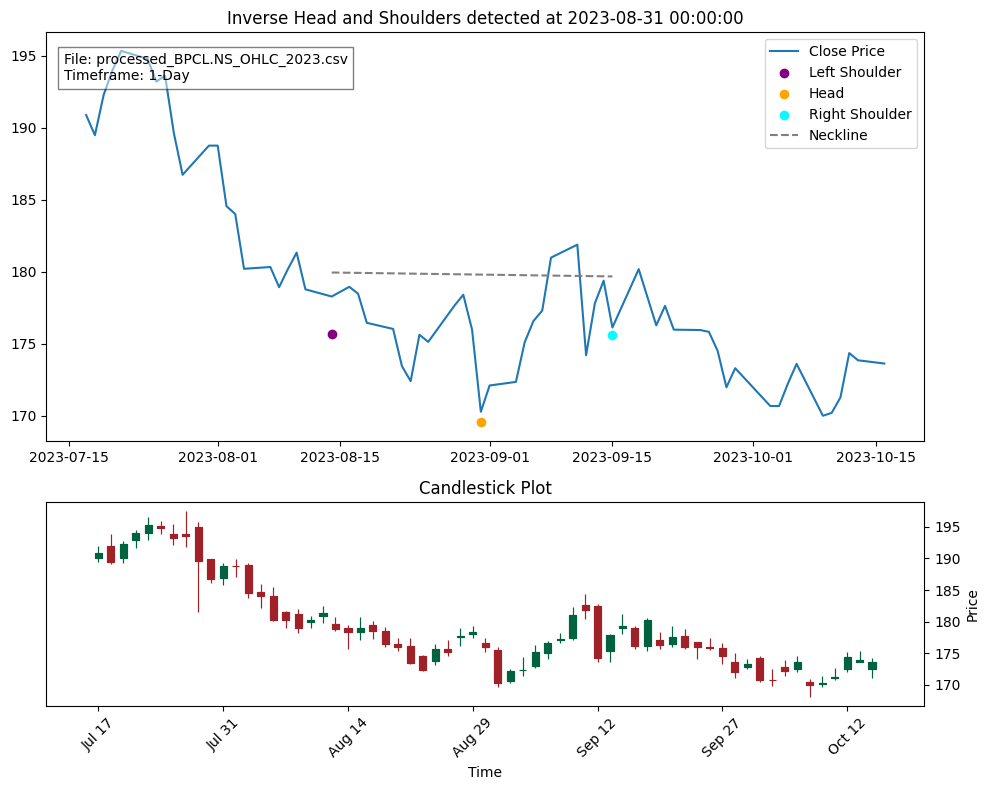

File: D:\AlgoT\yfinanceData\processed_COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (11, Timestamp('2023-01-17 00:00:00'), 211.1000061035156), Head: (28, Timestamp('2023-02-10 00:00:00'), 210.9499969482422), Right Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 212.0)


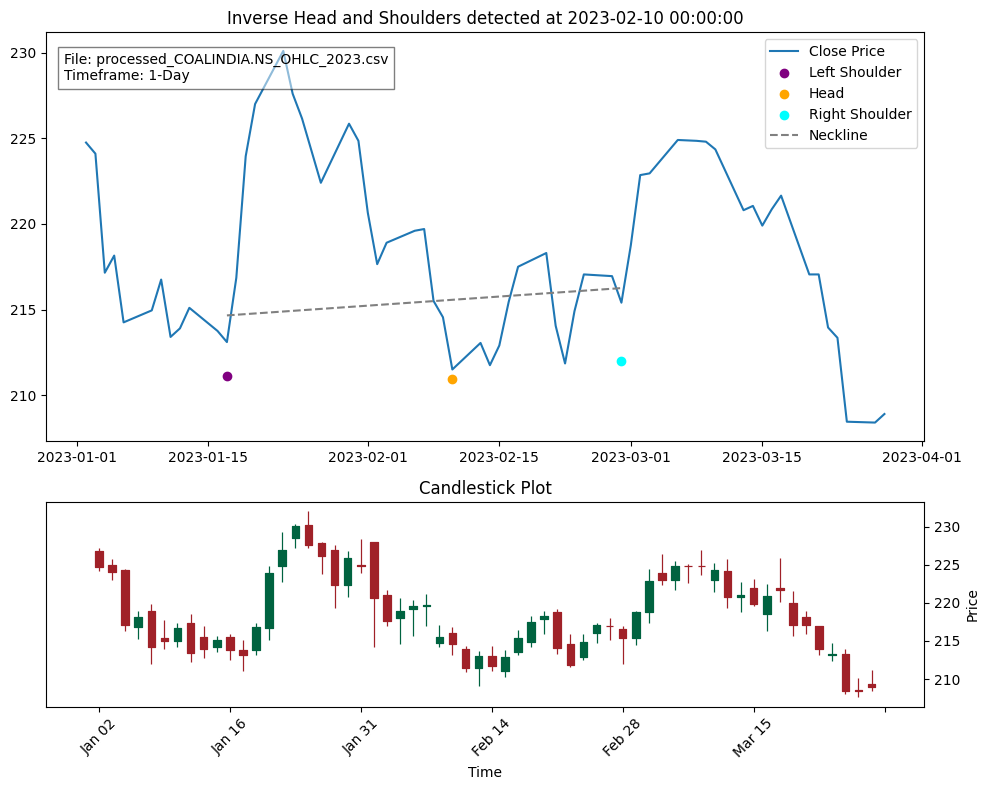

File: D:\AlgoT\yfinanceData\processed_COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (107, Timestamp('2023-06-09 00:00:00'), 227.3500061035156), Head: (118, Timestamp('2023-06-26 00:00:00'), 223.25), Right Shoulder: (130, Timestamp('2023-07-13 00:00:00'), 229.0)


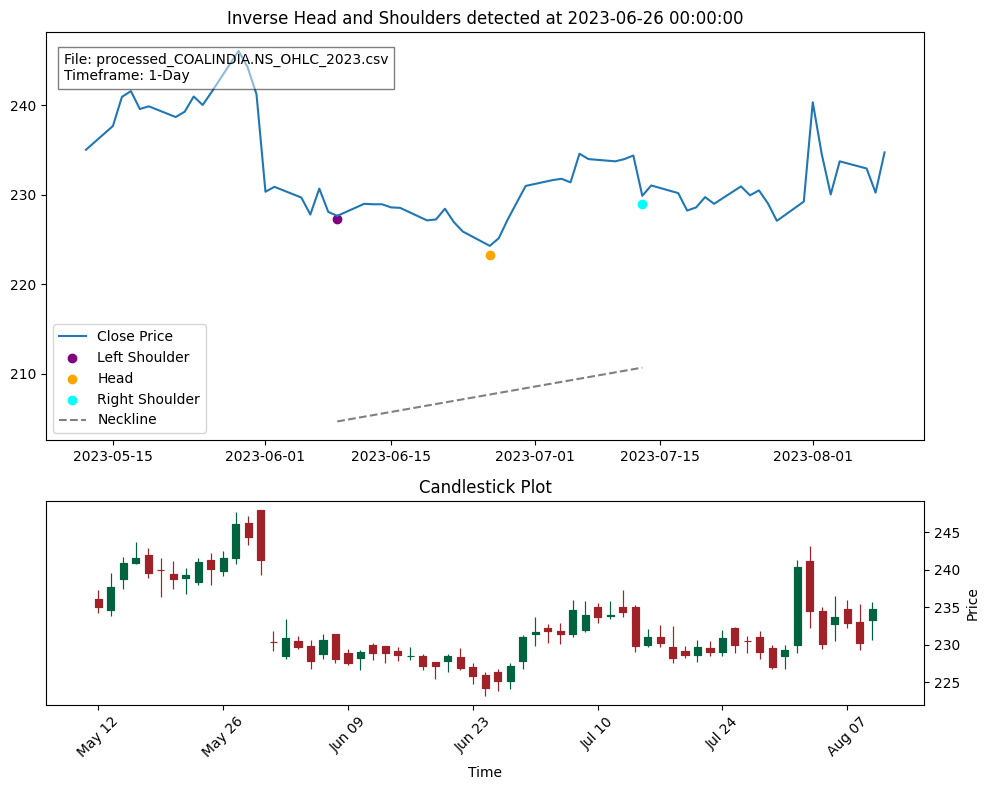

File: D:\AlgoT\yfinanceData\processed_COALINDIA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (130, Timestamp('2023-07-13 00:00:00'), 229.0), Head: (141, Timestamp('2023-07-28 00:00:00'), 226.8500061035156), Right Shoulder: (155, Timestamp('2023-08-18 00:00:00'), 227.0)


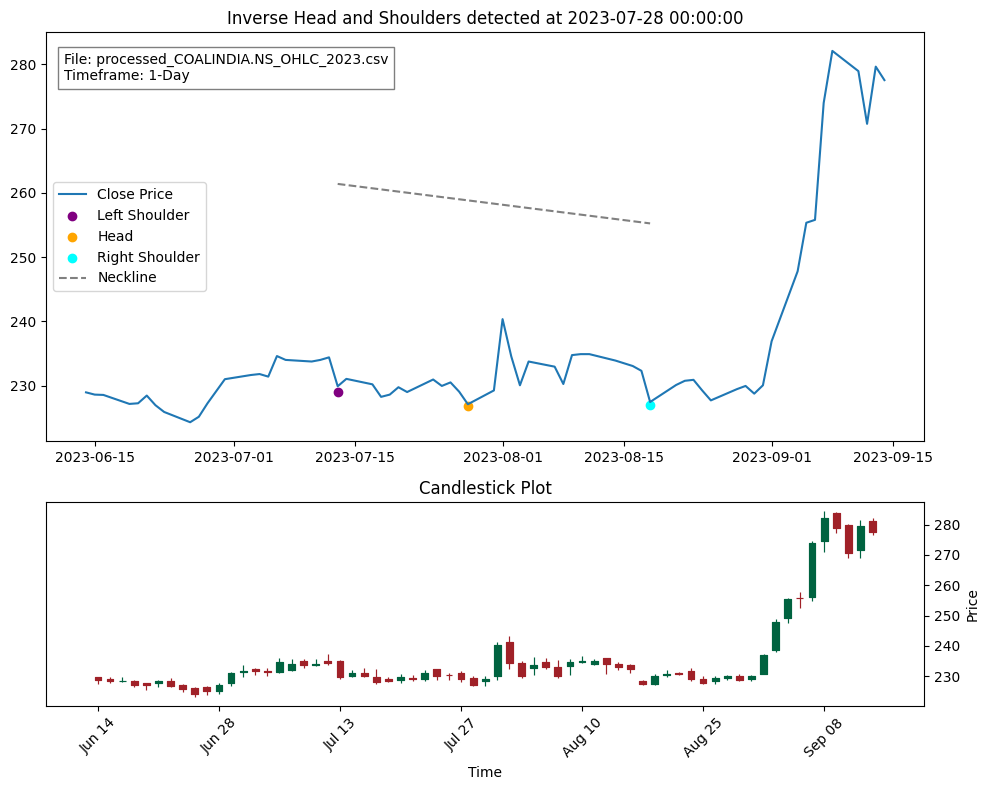

File: D:\AlgoT\yfinanceData\processed_DIVISLAB.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (136, Timestamp('2023-07-21 00:00:00'), 3747.0), Head: (147, Timestamp('2023-08-07 00:00:00'), 3920.0), Right Shoulder: (158, Timestamp('2023-08-23 00:00:00'), 3728.800048828125)


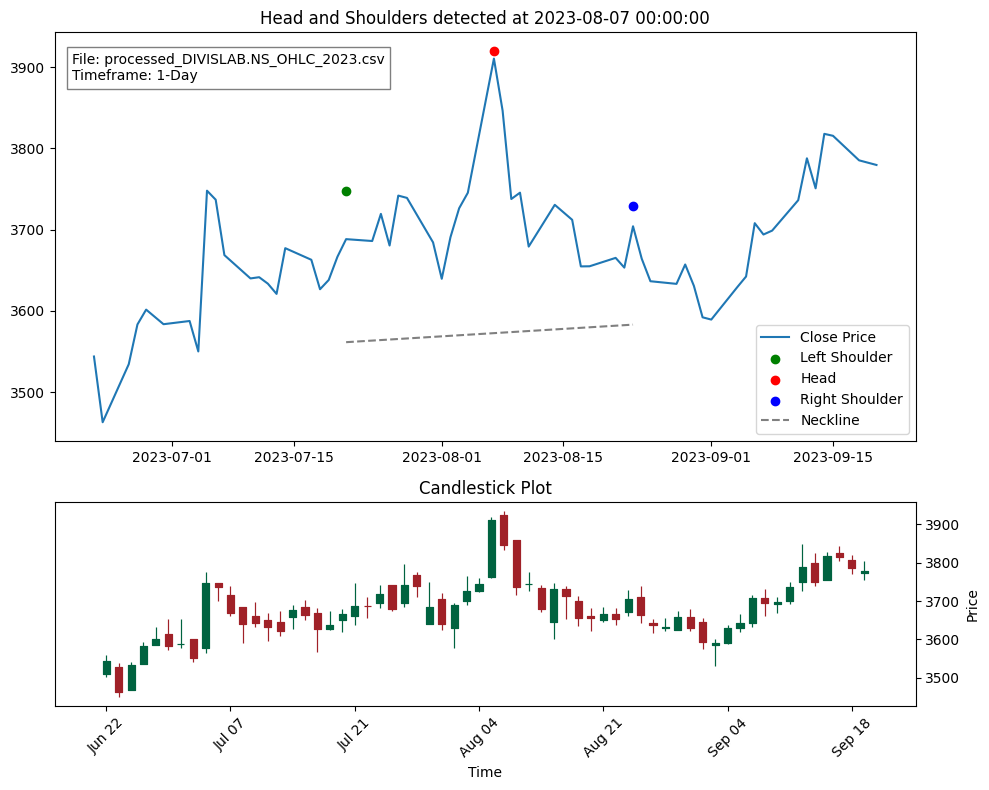

File: D:\AlgoT\yfinanceData\processed_EICHERMOT.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (140, Timestamp('2023-07-27 00:00:00'), 3320.39990234375), Head: (154, Timestamp('2023-08-17 00:00:00'), 3291.75), Right Shoulder: (173, Timestamp('2023-09-13 00:00:00'), 3308.0)


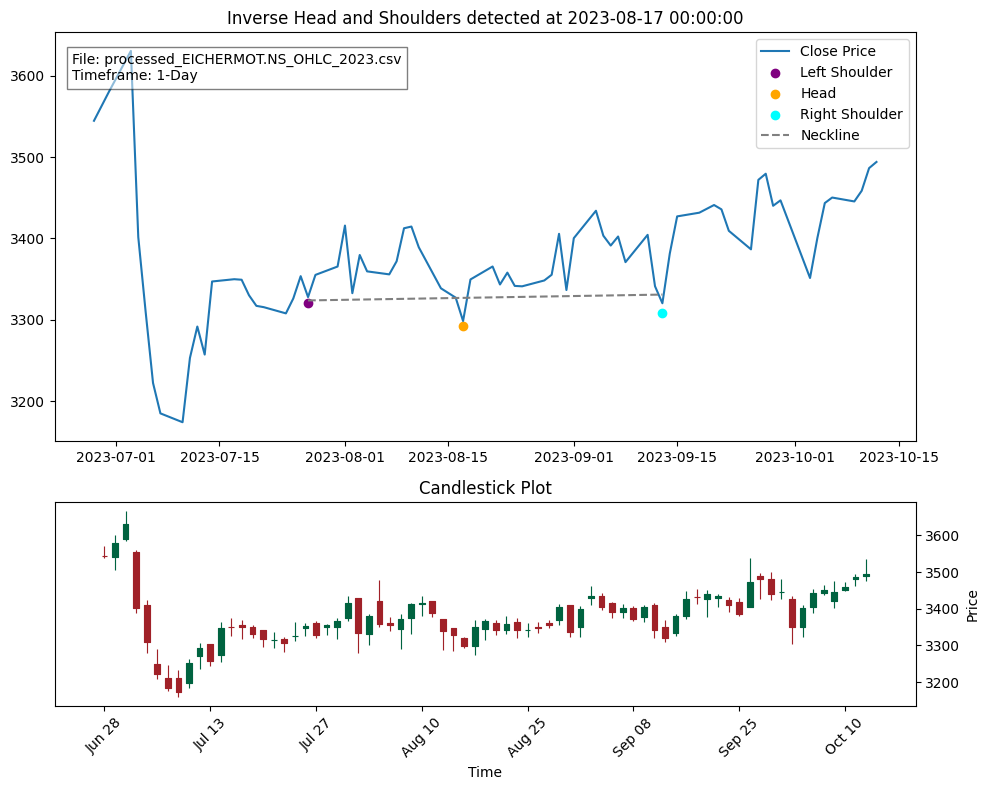

File: D:\AlgoT\yfinanceData\processed_HEROMOTOCO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 2410.35009765625), Head: (59, Timestamp('2023-03-28 00:00:00'), 2246.0), Right Shoulder: (70, Timestamp('2023-04-18 00:00:00'), 2425.0)


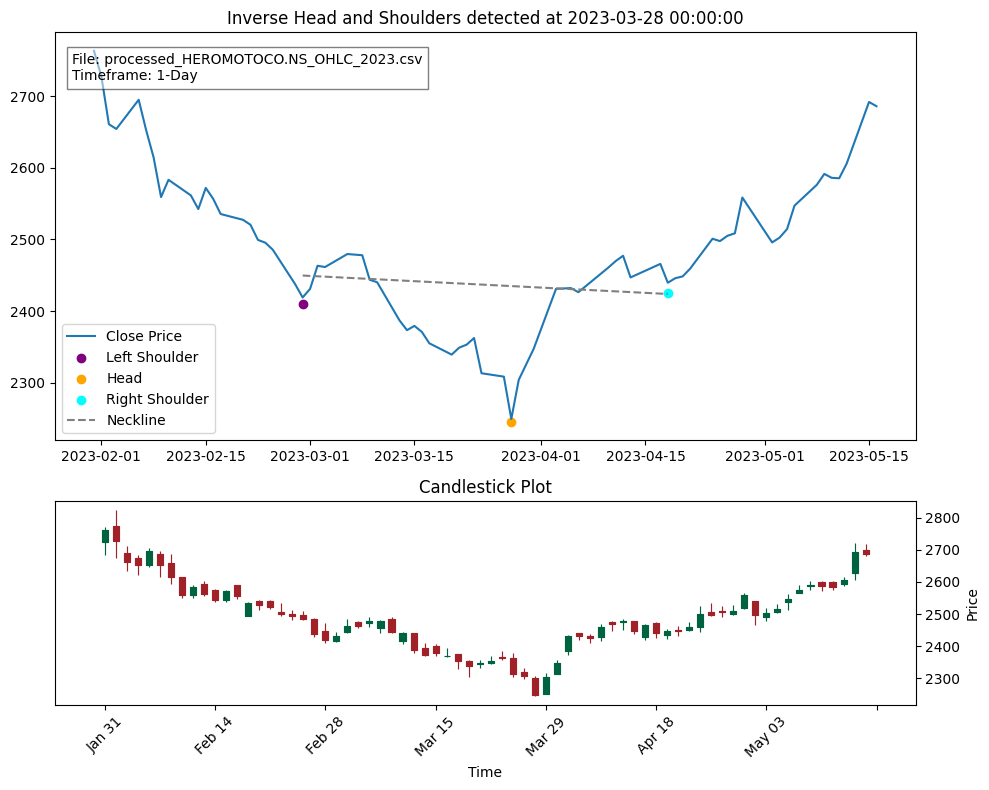

File: D:\AlgoT\yfinanceData\processed_HINDALCO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 398.0), Head: (51, Timestamp('2023-03-16 00:00:00'), 383.1000061035156), Right Shoulder: (62, Timestamp('2023-04-03 00:00:00'), 399.5499877929688)


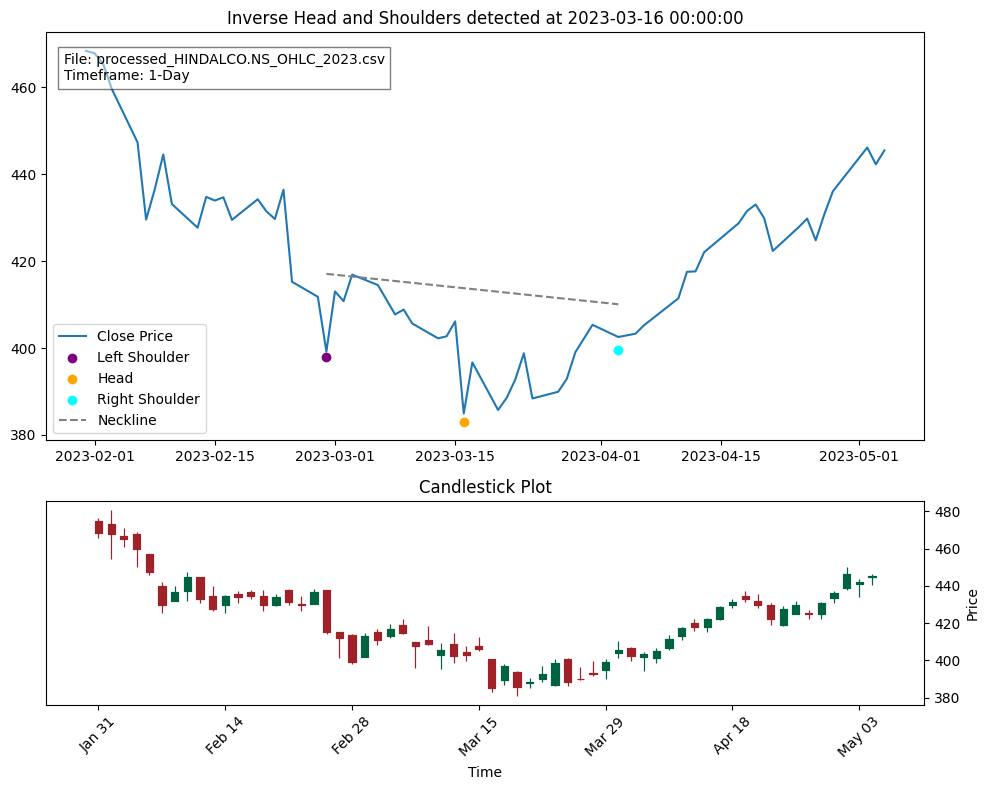

File: D:\AlgoT\yfinanceData\processed_HINDUNILVR.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (34, Timestamp('2023-02-20 00:00:00'), 2508.199951171875), Head: (50, Timestamp('2023-03-15 00:00:00'), 2393.0), Right Shoulder: (67, Timestamp('2023-04-12 00:00:00'), 2518.64990234375)


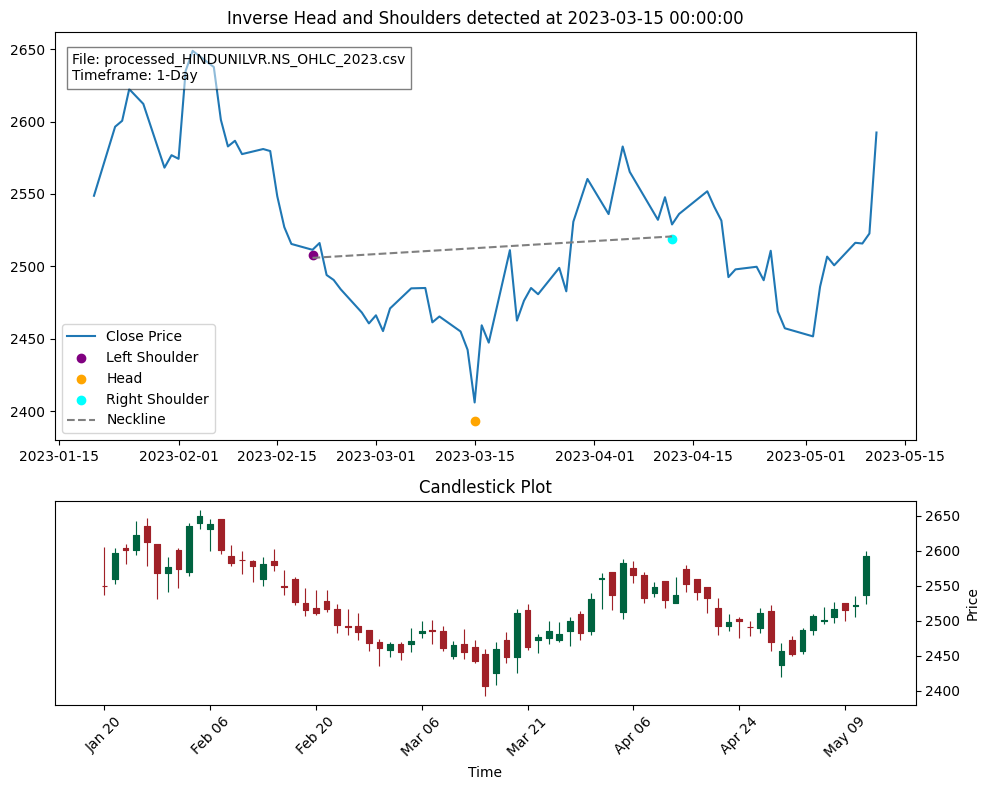

File: D:\AlgoT\yfinanceData\processed_INDUSINDBK.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (37, Timestamp('2023-02-23 00:00:00'), 1066.6500244140625), Head: (53, Timestamp('2023-03-20 00:00:00'), 990.2000122070312), Right Shoulder: (65, Timestamp('2023-04-10 00:00:00'), 1063.0)


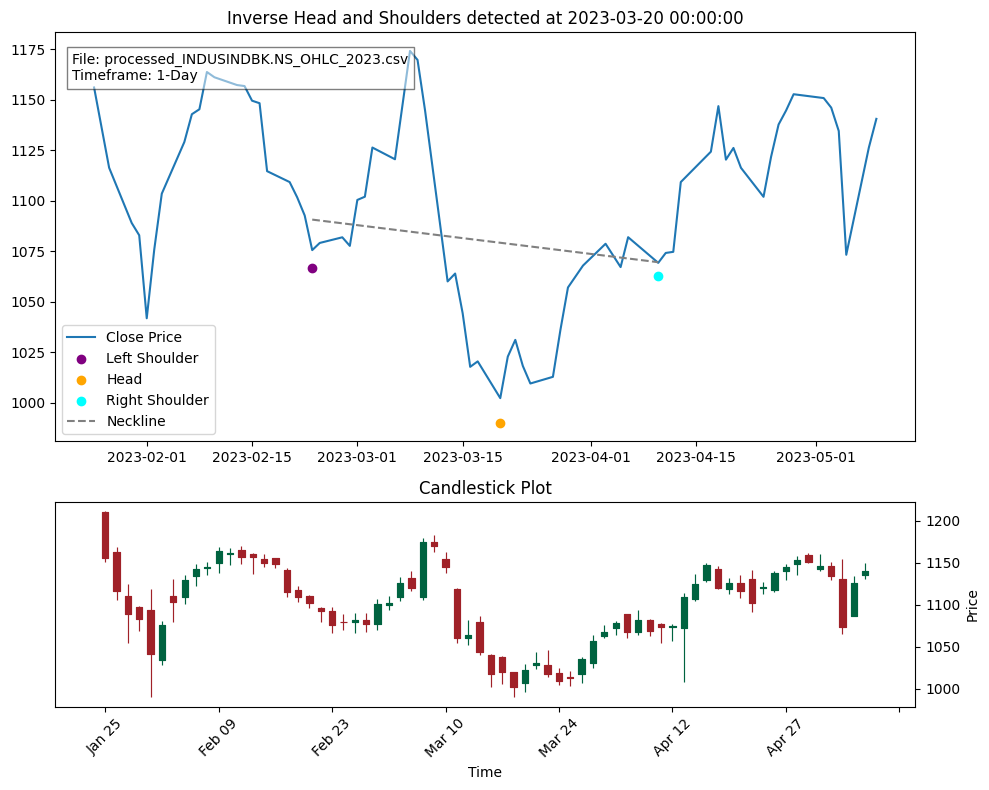

File: D:\AlgoT\yfinanceData\processed_IOC.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (146, Timestamp('2023-08-04 00:00:00'), 92.0500030517578), Head: (165, Timestamp('2023-09-01 00:00:00'), 88.75), Right Shoulder: (177, Timestamp('2023-09-20 00:00:00'), 91.4000015258789)


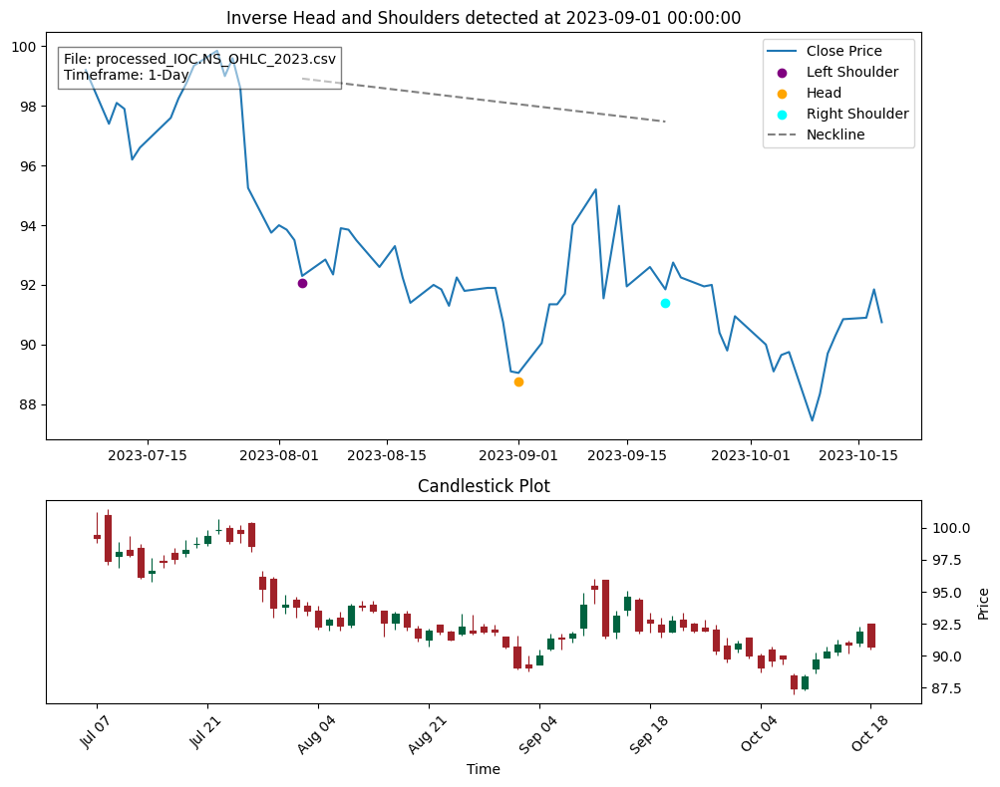

File: D:\AlgoT\yfinanceData\processed_MARUTI.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (104, Timestamp('2023-06-06 00:00:00'), 9770.0), Head: (124, Timestamp('2023-07-05 00:00:00'), 10036.9501953125), Right Shoulder: (142, Timestamp('2023-07-31 00:00:00'), 9837.7001953125)


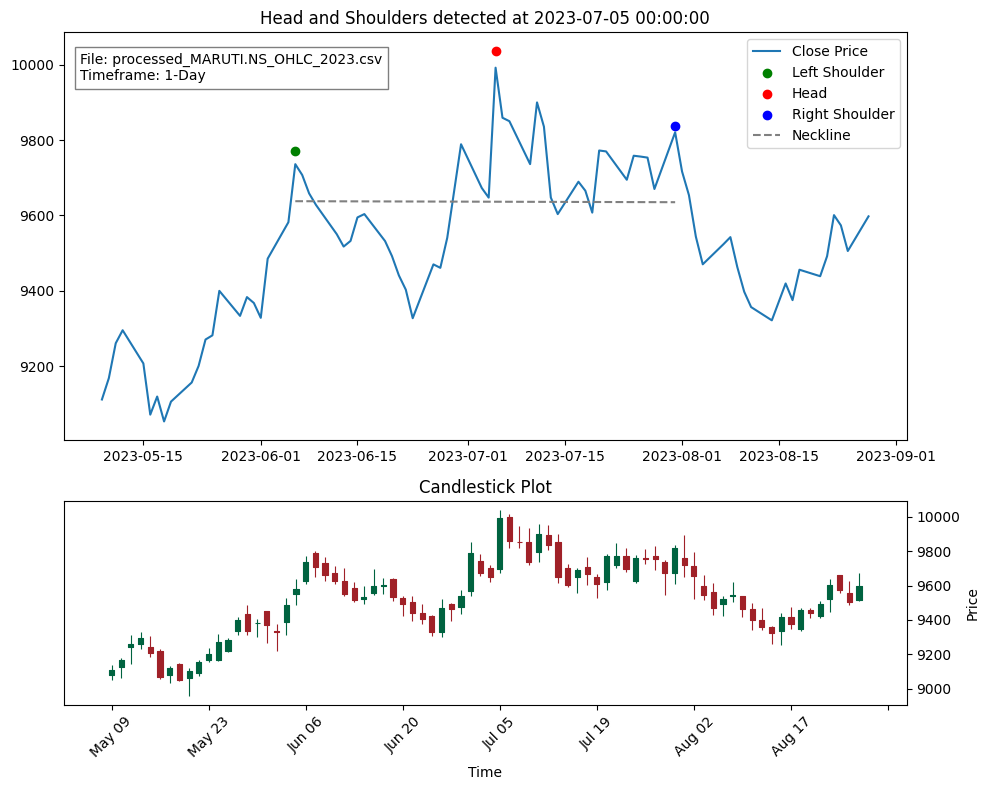

File: D:\AlgoT\yfinanceData\processed_POWERGRID.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (87, Timestamp('2023-05-12 00:00:00'), 180.8625030517578), Head: (101, Timestamp('2023-06-01 00:00:00'), 172.53750610351562), Right Shoulder: (113, Timestamp('2023-06-19 00:00:00'), 181.8000030517578)


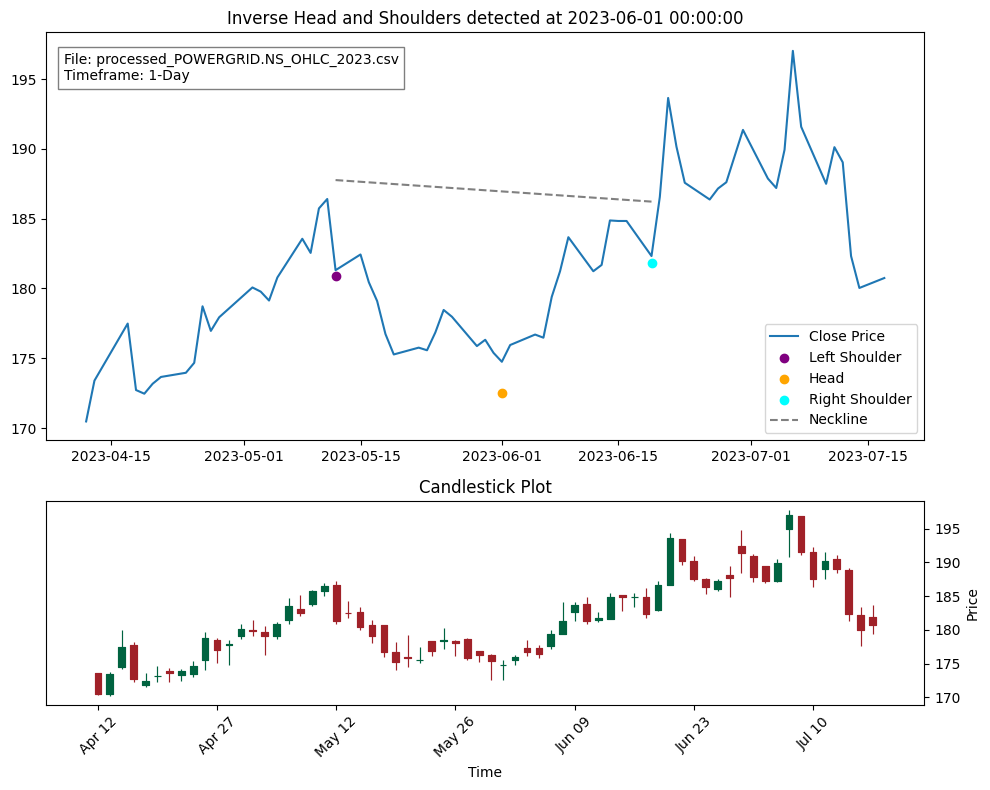

File: D:\AlgoT\yfinanceData\processed_RELIANCE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 2135.498291015625), Head: (53, Timestamp('2023-03-20 00:00:00'), 2012.1392822265625), Right Shoulder: (65, Timestamp('2023-04-10 00:00:00'), 2142.789794921875)


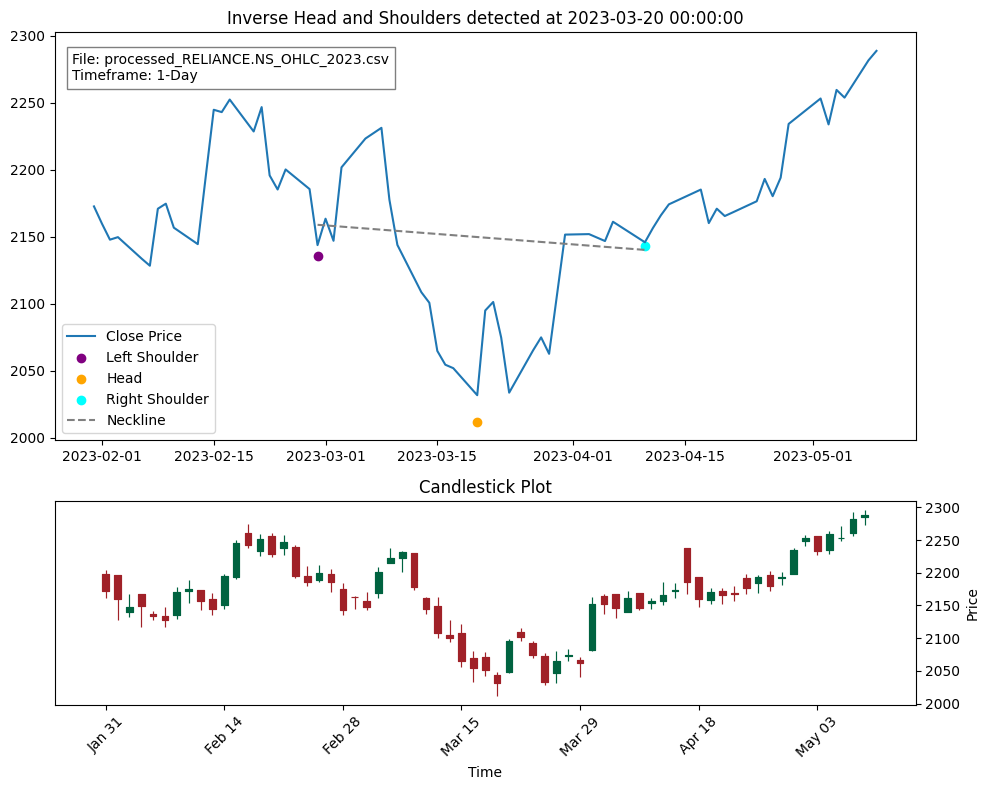

File: D:\AlgoT\yfinanceData\processed_RELIANCE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (189, Timestamp('2023-10-09 00:00:00'), 2295.0), Head: (201, Timestamp('2023-10-26 00:00:00'), 2220.300048828125), Right Shoulder: (213, Timestamp('2023-11-13 00:00:00'), 2311.699951171875)


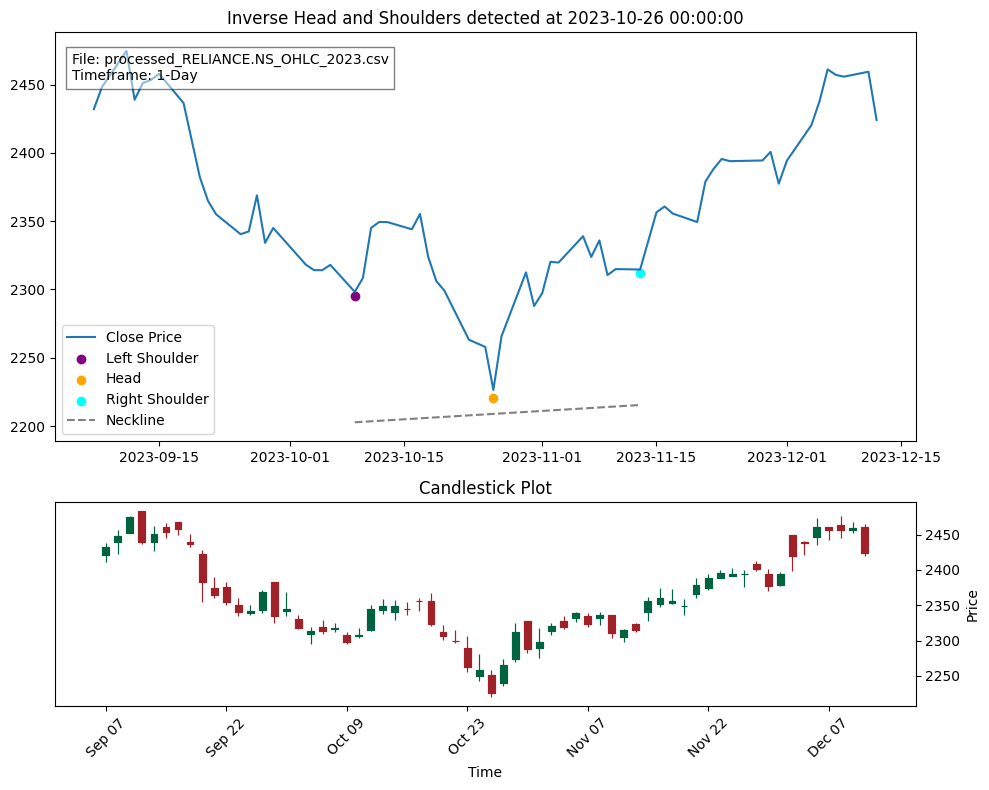

File: D:\AlgoT\yfinanceData\processed_SBILIFE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (219, Timestamp('2023-11-22 00:00:00'), 1438.550048828125), Head: (232, Timestamp('2023-12-12 00:00:00'), 1491.9000244140625), Right Shoulder: (243, Timestamp('2023-12-28 00:00:00'), 1444.949951171875)


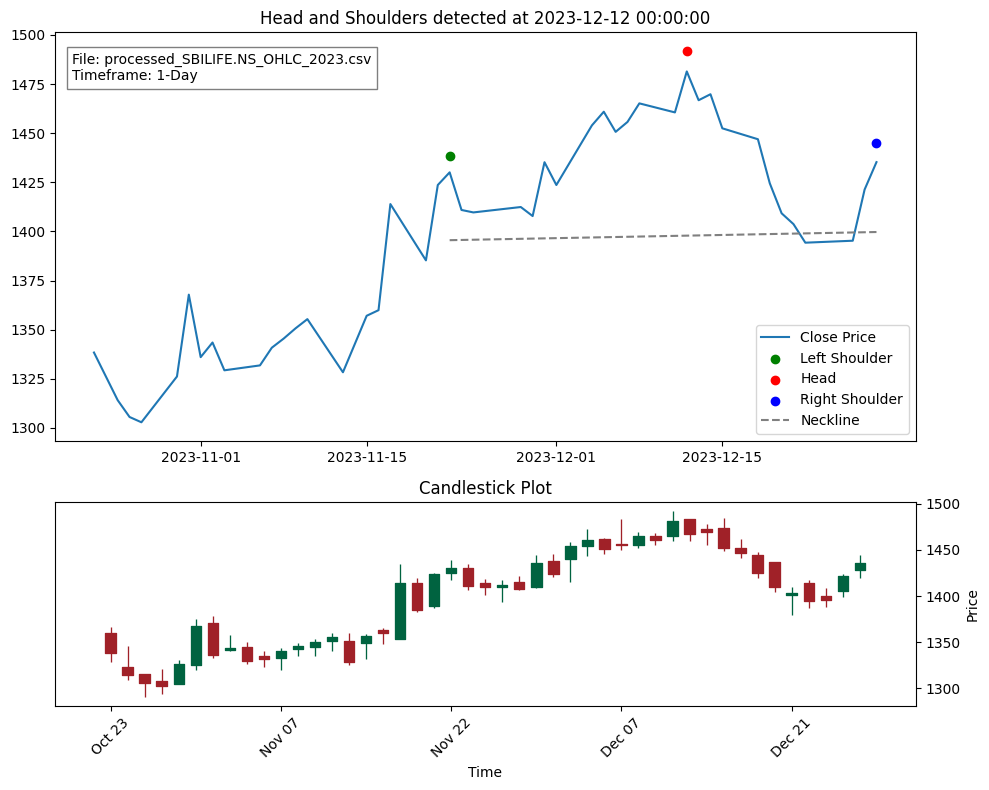

File: D:\AlgoT\yfinanceData\processed_SUNPHARMA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (173, Timestamp('2023-09-13 00:00:00'), 1156.699951171875), Head: (184, Timestamp('2023-09-29 00:00:00'), 1167.4000244140625), Right Shoulder: (196, Timestamp('2023-10-18 00:00:00'), 1161.800048828125)


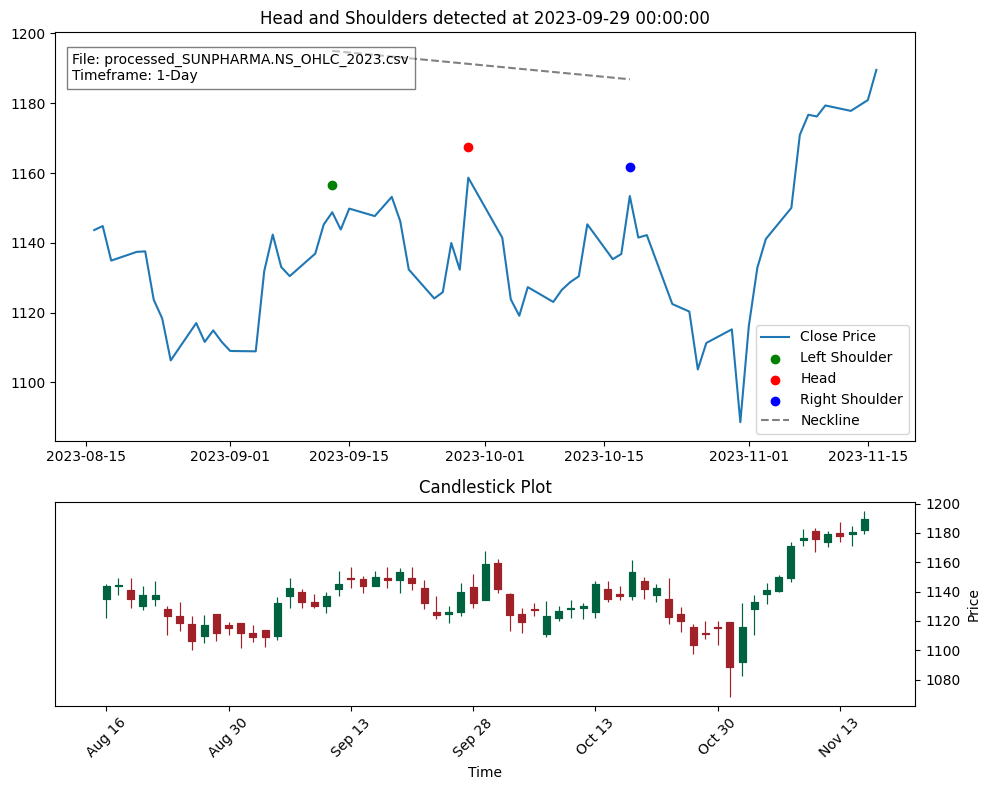

File: D:\AlgoT\yfinanceData\processed_TATACONSUM.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (175, Timestamp('2023-09-15 00:00:00'), 873.5), Head: (187, Timestamp('2023-10-05 00:00:00'), 857.5), Right Shoulder: (201, Timestamp('2023-10-26 00:00:00'), 872.0)


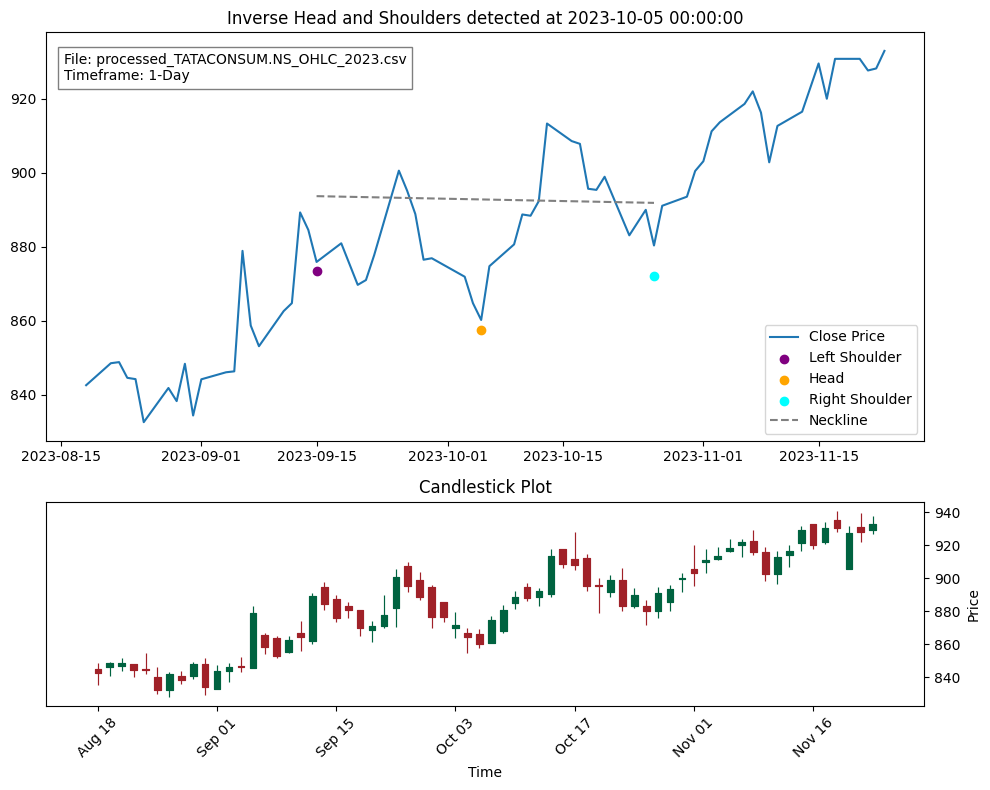

File: D:\AlgoT\yfinanceData\processed_TITAN.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (10, Timestamp('2023-01-16 00:00:00'), 2392.0), Head: (22, Timestamp('2023-02-02 00:00:00'), 2269.60009765625), Right Shoulder: (37, Timestamp('2023-02-23 00:00:00'), 2380.0)


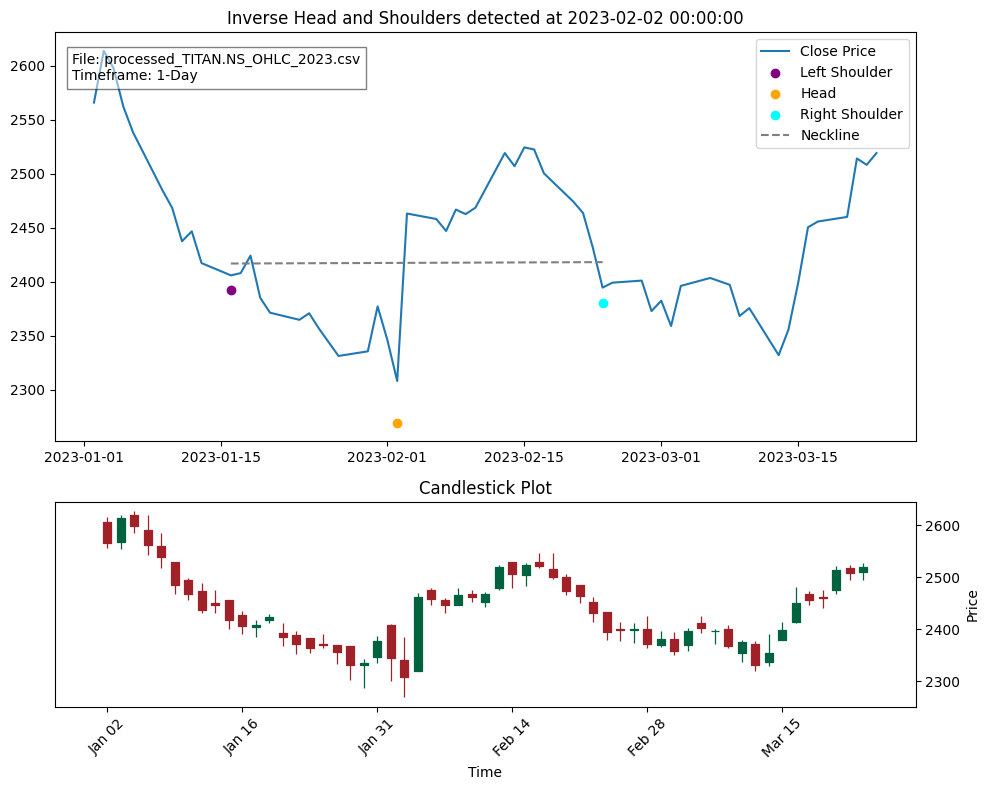

File: D:\AlgoT\yfinanceData\processed_UPL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (90, Timestamp('2023-05-17 00:00:00'), 683.4500122070312), Head: (104, Timestamp('2023-06-06 00:00:00'), 696.9500122070312), Right Shoulder: (121, Timestamp('2023-06-30 00:00:00'), 688.25)


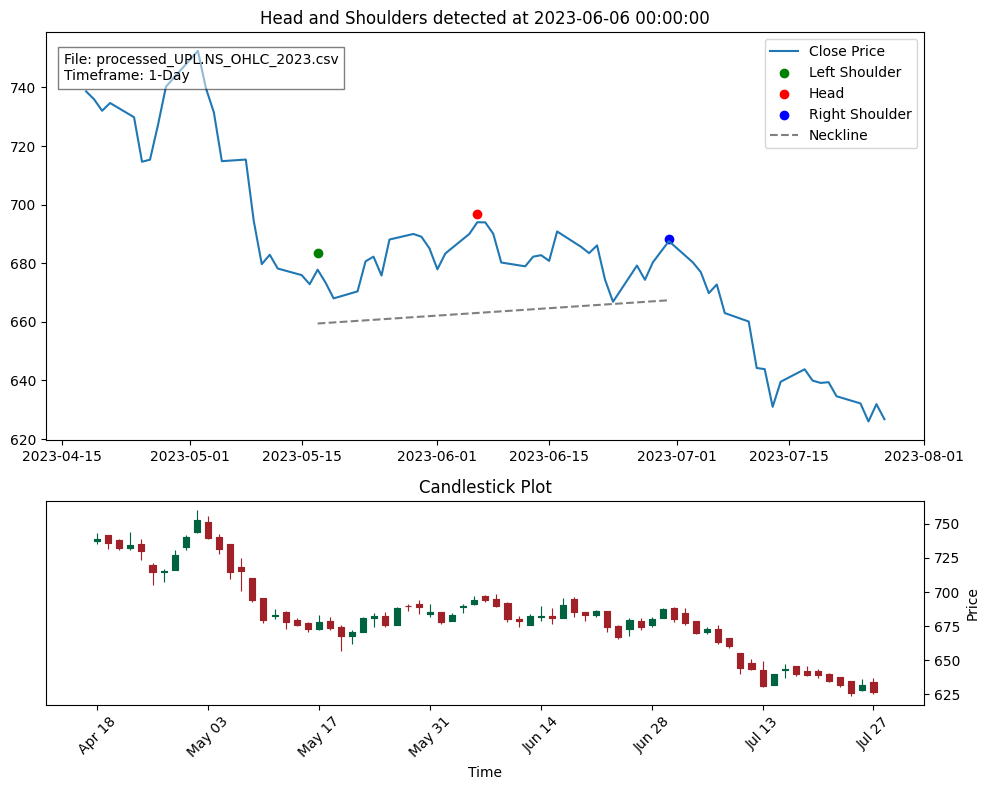

File: D:\AlgoT\yfinanceData\processed_WIPRO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (153, Timestamp('2023-08-16 00:00:00'), 420.2000122070313), Head: (175, Timestamp('2023-09-15 00:00:00'), 443.75), Right Shoulder: (191, Timestamp('2023-10-11 00:00:00'), 423.9500122070313)


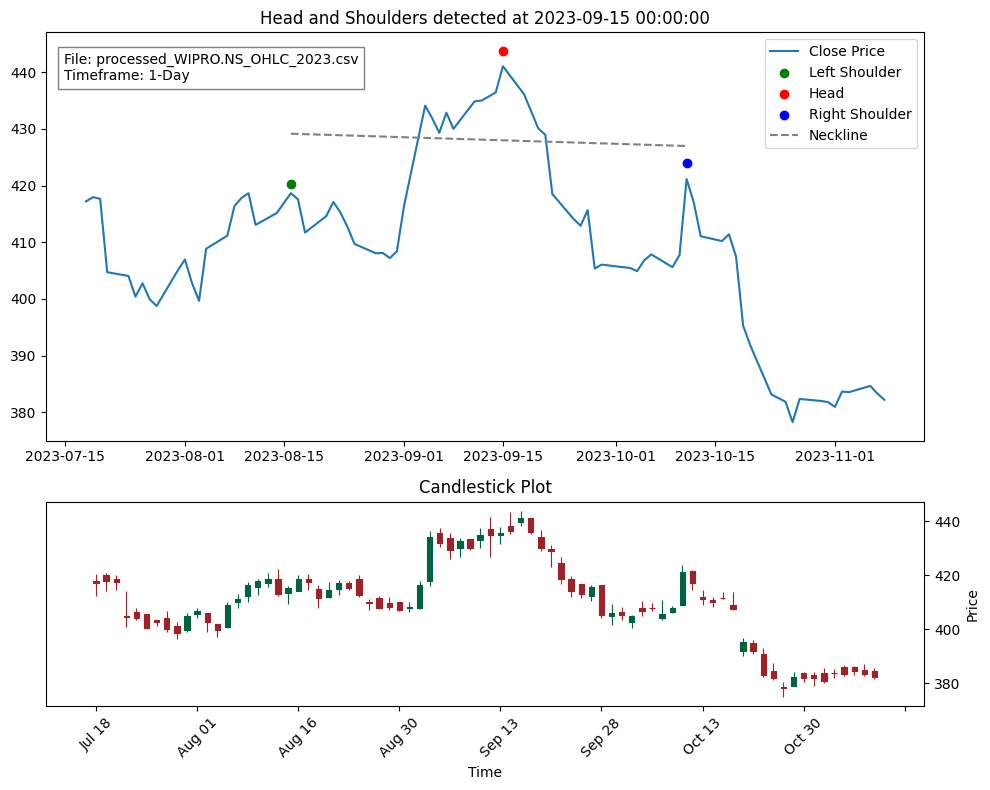

File: D:\AlgoT\yfinanceData\RELIANCE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (40, Timestamp('2023-02-28 00:00:00'), 2135.498291015625), Head: (53, Timestamp('2023-03-20 00:00:00'), 2012.1392822265625), Right Shoulder: (65, Timestamp('2023-04-10 00:00:00'), 2142.789794921875)


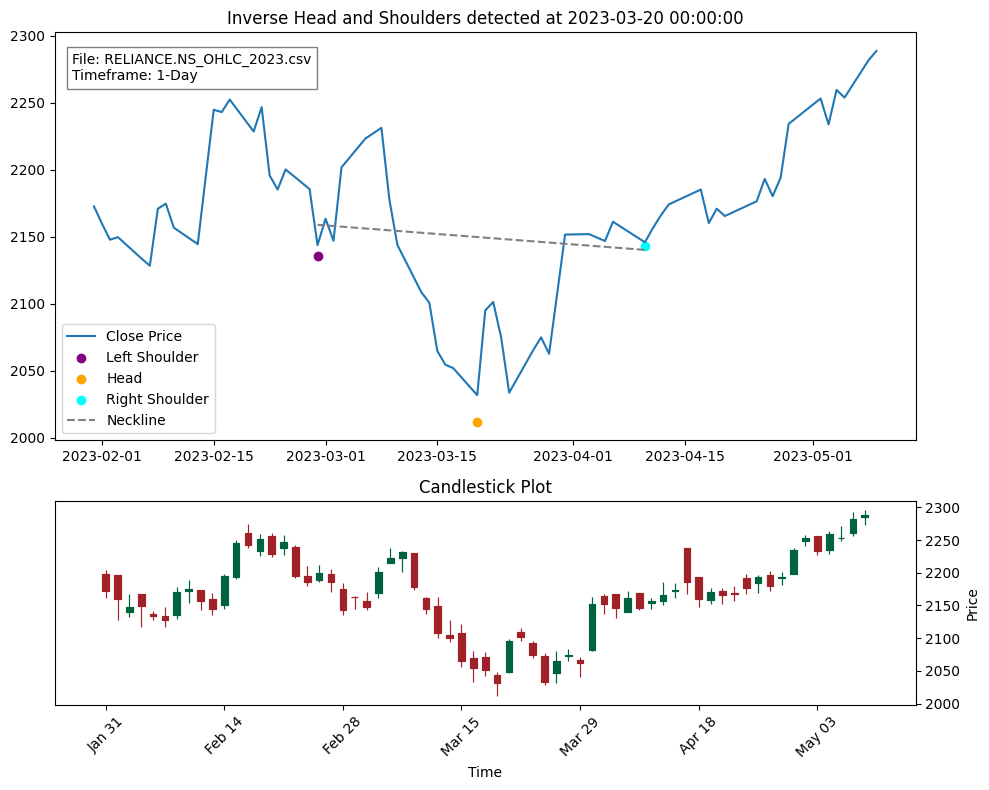

File: D:\AlgoT\yfinanceData\RELIANCE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (189, Timestamp('2023-10-09 00:00:00'), 2295.0), Head: (201, Timestamp('2023-10-26 00:00:00'), 2220.300048828125), Right Shoulder: (213, Timestamp('2023-11-13 00:00:00'), 2311.699951171875)


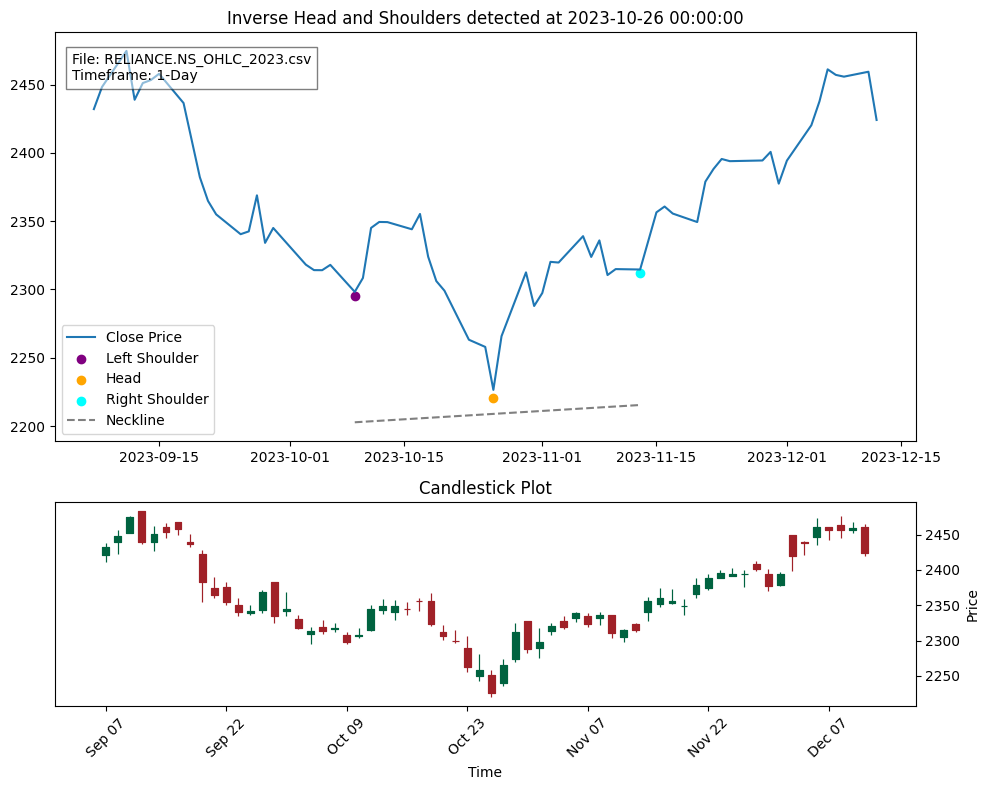

File: D:\AlgoT\yfinanceData\SBILIFE.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (219, Timestamp('2023-11-22 00:00:00'), 1438.550048828125), Head: (232, Timestamp('2023-12-12 00:00:00'), 1491.9000244140625), Right Shoulder: (243, Timestamp('2023-12-28 00:00:00'), 1444.949951171875)


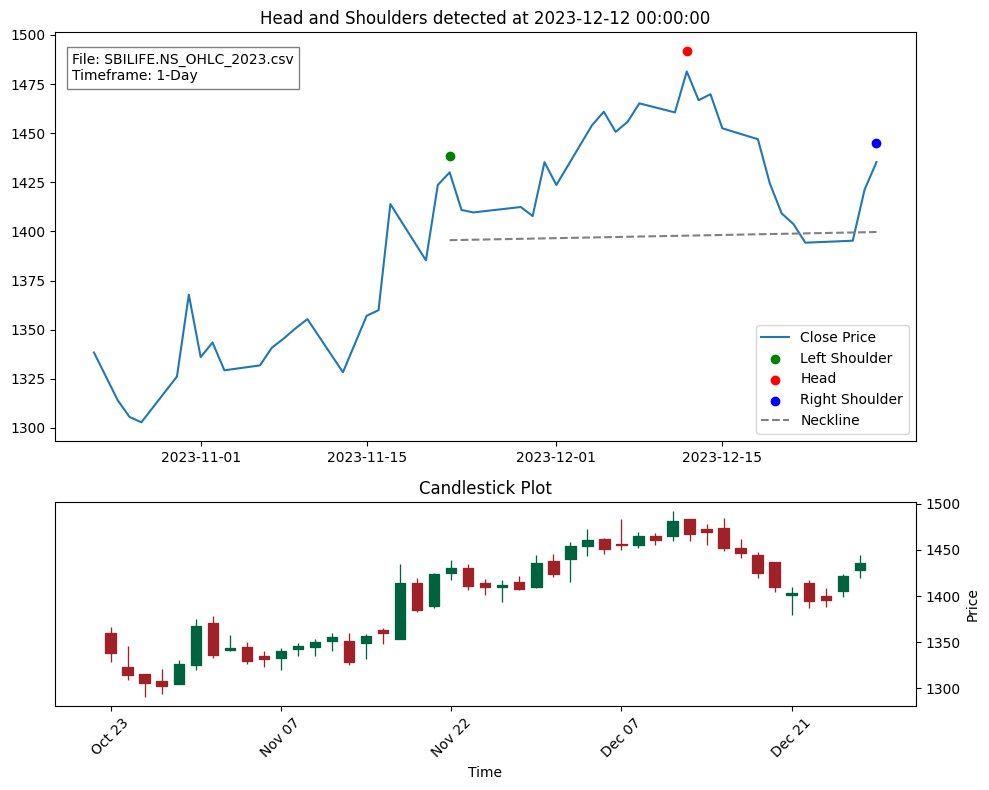

File: D:\AlgoT\yfinanceData\SUNPHARMA.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (173, Timestamp('2023-09-13 00:00:00'), 1156.699951171875), Head: (184, Timestamp('2023-09-29 00:00:00'), 1167.4000244140625), Right Shoulder: (196, Timestamp('2023-10-18 00:00:00'), 1161.800048828125)


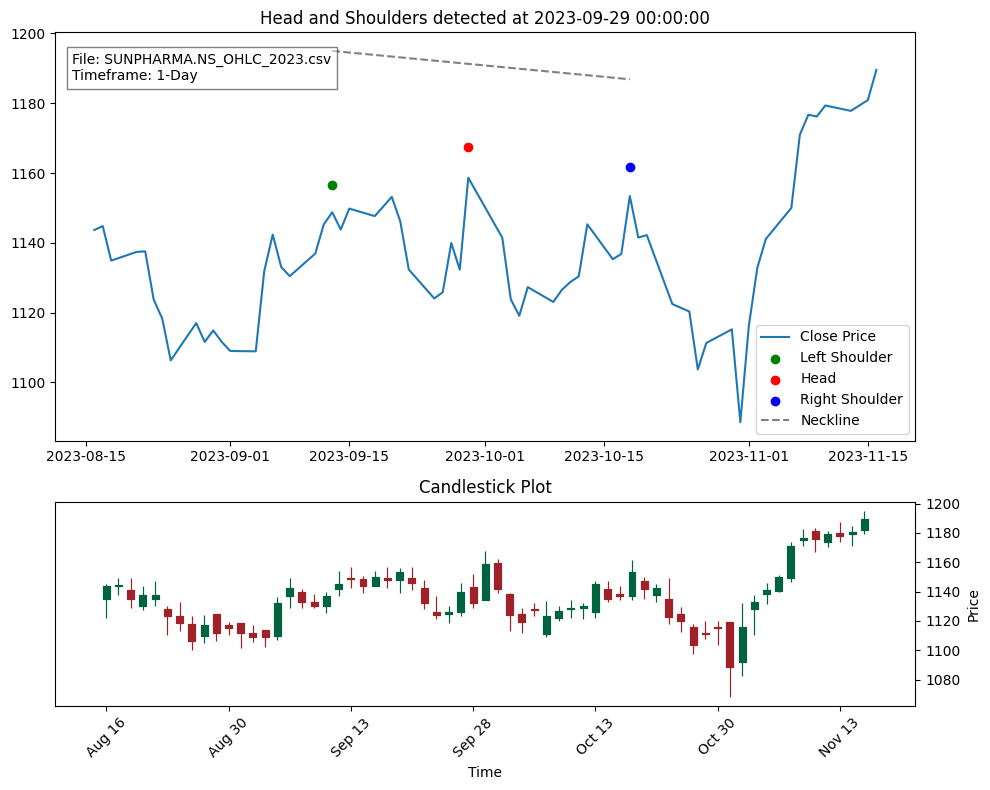

File: D:\AlgoT\yfinanceData\TATACONSUM.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (175, Timestamp('2023-09-15 00:00:00'), 873.5), Head: (187, Timestamp('2023-10-05 00:00:00'), 857.5), Right Shoulder: (201, Timestamp('2023-10-26 00:00:00'), 872.0)


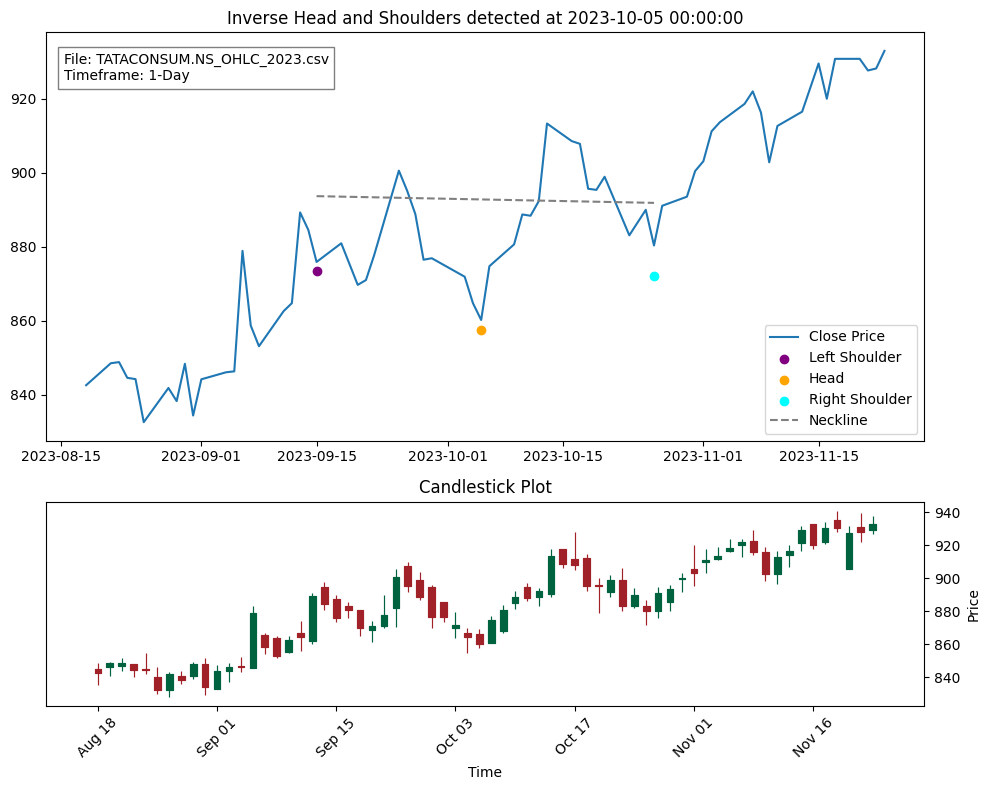

File: D:\AlgoT\yfinanceData\TITAN.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Inverse Head and Shoulders
Left Shoulder: (10, Timestamp('2023-01-16 00:00:00'), 2392.0), Head: (22, Timestamp('2023-02-02 00:00:00'), 2269.60009765625), Right Shoulder: (37, Timestamp('2023-02-23 00:00:00'), 2380.0)


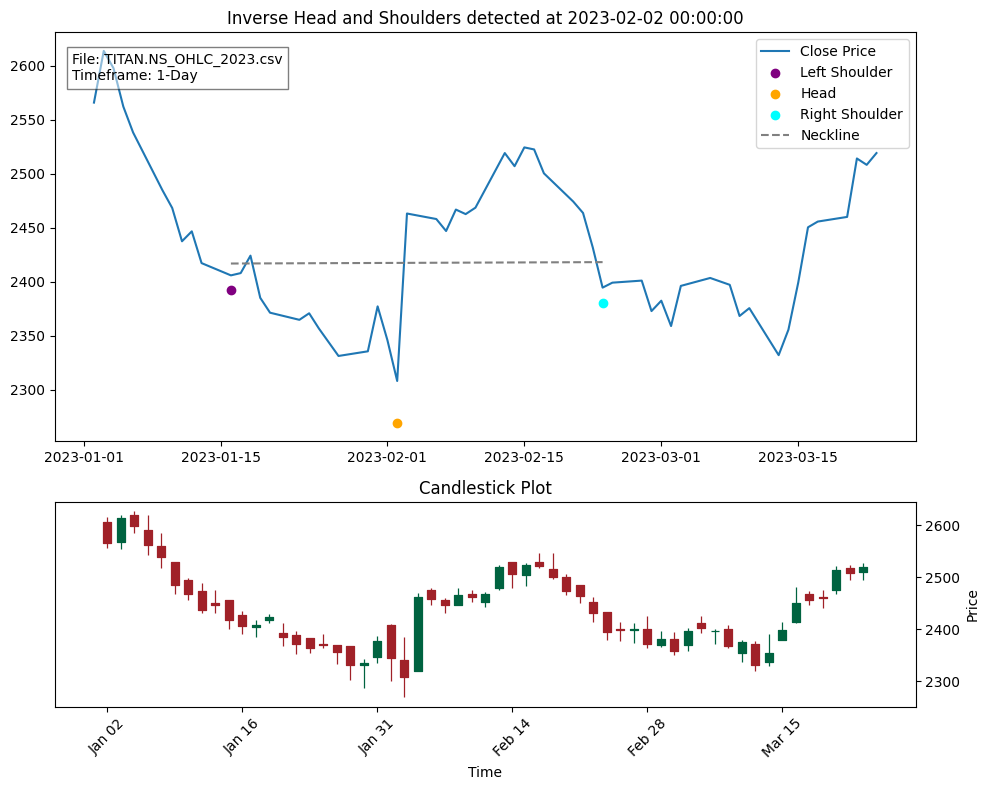

File: D:\AlgoT\yfinanceData\UPL.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (90, Timestamp('2023-05-17 00:00:00'), 683.4500122070312), Head: (104, Timestamp('2023-06-06 00:00:00'), 696.9500122070312), Right Shoulder: (121, Timestamp('2023-06-30 00:00:00'), 688.25)


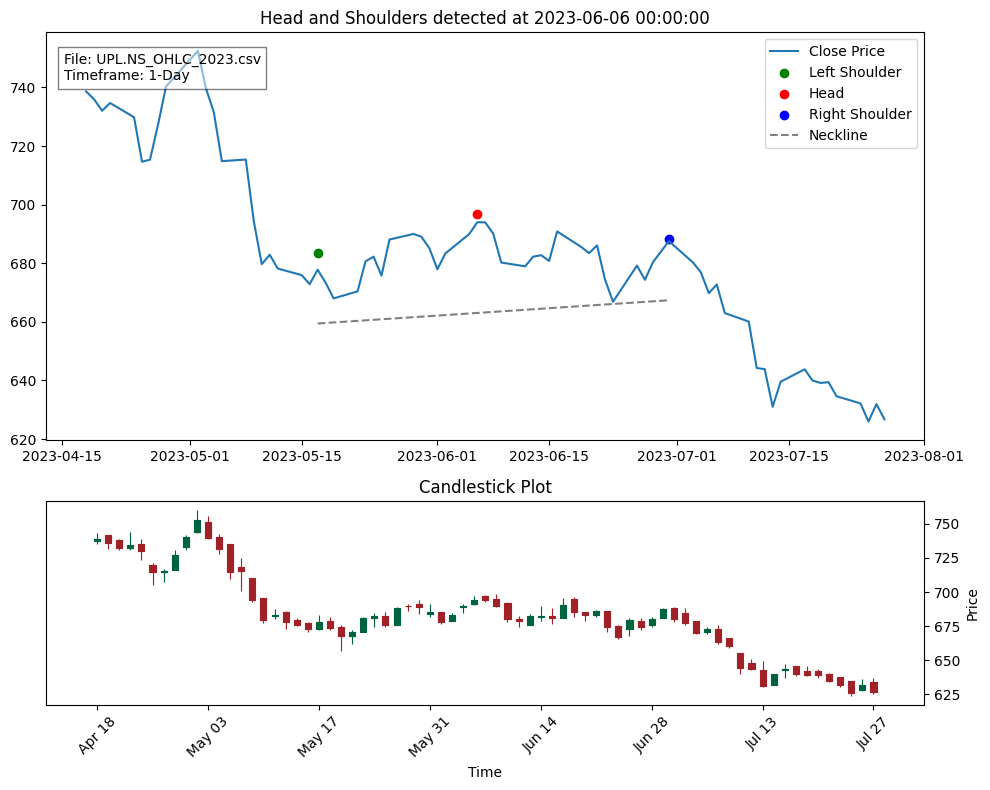

File: D:\AlgoT\yfinanceData\WIPRO.NS_OHLC_2023.csv, Timeframe: 1-Day, Type: Head and Shoulders
Left Shoulder: (153, Timestamp('2023-08-16 00:00:00'), 420.2000122070313), Head: (175, Timestamp('2023-09-15 00:00:00'), 443.75), Right Shoulder: (191, Timestamp('2023-10-11 00:00:00'), 423.9500122070313)


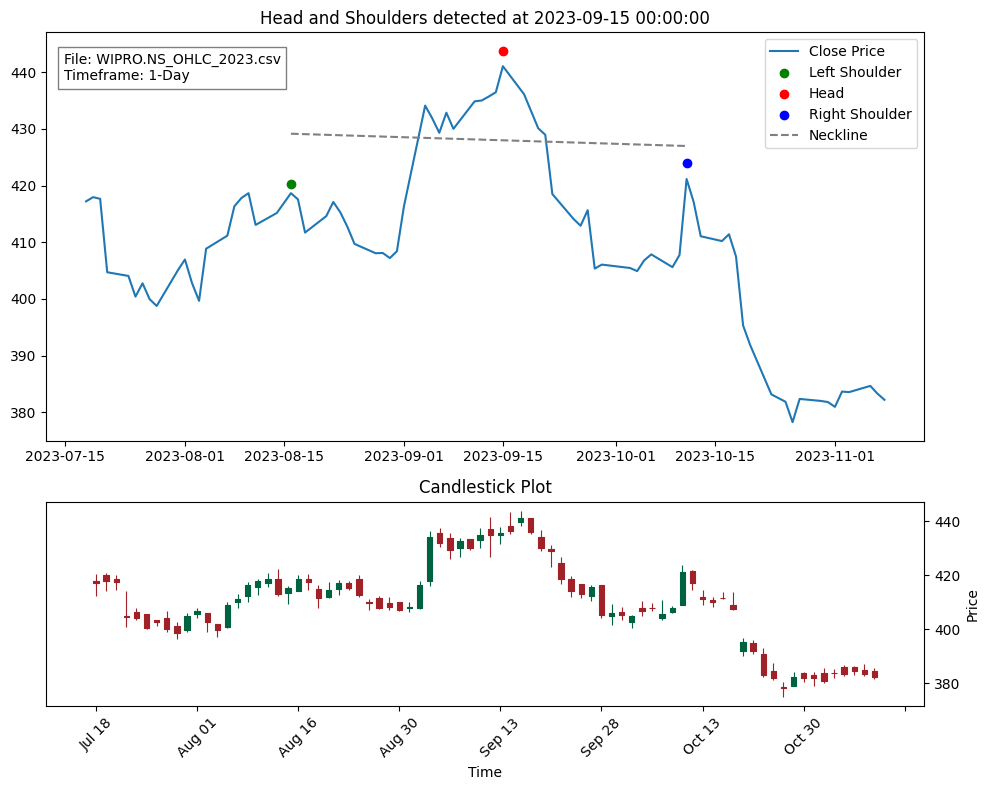

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
import peakutils
import os
import glob
from scipy.stats import linregress

# Function to find peaks and troughs in the data
def find_peaks_and_troughs(data):
    close_prices = data['Close']
    peak_indexes = peakutils.indexes(np.array(close_prices), thres=0.5, min_dist=10)
    trough_indexes = peakutils.indexes(np.array(-close_prices), thres=0.5, min_dist=10)
    
    peaks = [(idx, data.index[idx], data['High'][idx]) for idx in peak_indexes]
    troughs = [(idx, data.index[idx], data['Low'][idx]) for idx in trough_indexes]
    return peaks, troughs

# Function to detect Head and Shoulders patterns
def detect_head_and_shoulders(peaks, troughs, data):
    patterns = []
    
    # Detect regular head and shoulders
    for i in range(1, len(peaks) - 1):
        left_shoulder = peaks[i-1]
        head = peaks[i]
        right_shoulder = peaks[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is higher than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] < head[2] and right_shoulder[2] < head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Calculate neckline using linear regression on the low prices around the head
            troughs_low_prices = [data['Low'][left_shoulder[0]], data['Low'][head[0]], data['Low'][right_shoulder[0]]]
            troughs_indices = [left_shoulder[0], head[0], right_shoulder[0]]
            slope, intercept, _, _, _ = linregress(troughs_indices, troughs_low_prices)
            
            patterns.append({
                'type': 'Head and Shoulders',
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'slope': slope,
                'intercept': intercept,
                'breakout_level': intercept + slope * troughs_indices[-1]  # Calculate breakout level
            })
    
    # Detect inverse head and shoulders
    for i in range(1, len(troughs) - 1):
        left_shoulder = troughs[i-1]
        head = troughs[i]
        right_shoulder = troughs[i+1]
        
        # Calculate time duration between shoulders
        left_duration = (head[1] - left_shoulder[1]).total_seconds() / 3600  # in hours
        right_duration = (right_shoulder[1] - head[1]).total_seconds() / 3600  # in hours
        
        # Check if the durations are within the 1:1.5 ratio
        if min(left_duration, right_duration) * 1.5 < max(left_duration, right_duration):
            continue
        
        # Check if head is lower than shoulders and shoulders are approximately equal in height
        if left_shoulder[2] > head[2] and right_shoulder[2] > head[2] and \
           abs(left_shoulder[2] - right_shoulder[2]) < 0.01 * head[2]:  # Adjust tolerance as needed
            
            # Calculate neckline using linear regression on the high prices around the head
            peaks_high_prices = [data['High'][left_shoulder[0]], data['High'][head[0]], data['High'][right_shoulder[0]]]
            peaks_indices = [left_shoulder[0], head[0], right_shoulder[0]]
            slope, intercept, _, _, _ = linregress(peaks_indices, peaks_high_prices)
            
            patterns.append({
                'type': 'Inverse Head and Shoulders',
                'left_shoulder': left_shoulder,
                'head': head,
                'right_shoulder': right_shoulder,
                'slope': slope,
                'intercept': intercept,
                'breakdown_level': intercept + slope * peaks_indices[-1]  # Calculate breakdown level
            })
    
    return patterns

# Function to process a single CSV file
def process_csv_file(file_path, patterns_list):
    data = pd.read_csv(file_path)
    if data.empty or 'Close' not in data.columns:
        print(f"Skipping {file_path}: Empty or missing 'Close' data.")
        return
    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index('Date', inplace=True)
    
    timeframes = {'1-Day': data}

    for timeframe, resampled_data in timeframes.items():
        # Find peaks and troughs in the data
        peaks, troughs = find_peaks_and_troughs(resampled_data)
        
        # Detect Head and Shoulders patterns
        patterns = detect_head_and_shoulders(peaks, troughs, resampled_data)
        
        # Display detected patterns and plot the chart for each pattern
        for pattern in patterns:
            print(f"File: {file_path}, Timeframe: {timeframe}, Type: {pattern['type']}")
            print(f"Left Shoulder: {pattern['left_shoulder']}, Head: {pattern['head']}, Right Shoulder: {pattern['right_shoulder']}")
            
            patterns_list.append({
                'file': os.path.basename(file_path),
                'timeframe': timeframe,
                'type': pattern['type'],
                'date': pattern['head'][1],
                'breakout_level': pattern.get('breakout_level', None),
                'breakdown_level': pattern.get('breakdown_level', None)
            })
            
            start_index = max(0, pattern['left_shoulder'][0] - 20)
            end_index = min(len(resampled_data) - 1, pattern['right_shoulder'][0] + 20)
            pattern_data = resampled_data.iloc[start_index:end_index]
            
            # Setup figure and subplots
            fig, (ax, ax2) = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [2, 1]})
            
            # First subplot for the pattern
            ax.plot(pattern_data.index, pattern_data['Close'], label='Close Price')
            if pattern['type'] == 'Head and Shoulders':
                ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='green', label='Left Shoulder')
                ax.scatter(pattern['head'][1], pattern['head'][2], color='red', label='Head')
                ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='blue', label='Right Shoulder')
                
                # Plot slanted neckline
                neckline_x = np.array([pattern_data.index.get_loc(pattern['left_shoulder'][1]), pattern_data.index.get_loc(pattern['right_shoulder'][1])])
                neckline_y = pattern['slope'] * neckline_x + pattern['intercept']
                ax.plot(pattern_data.index[neckline_x], neckline_y, color='gray', linestyle='--', label='Neckline')
                
                ax.set_title(f"{pattern['type']} detected at {pattern['head'][1]}")
            else:
                ax.scatter(pattern['left_shoulder'][1], pattern['left_shoulder'][2], color='purple', label='Left Shoulder')
                ax.scatter(pattern['head'][1], pattern['head'][2], color='orange', label='Head')
                ax.scatter(pattern['right_shoulder'][1], pattern['right_shoulder'][2], color='cyan', label='Right Shoulder')
                
                # Plot slanted neckline
                neckline_x = np.array([pattern_data.index.get_loc(pattern['left_shoulder'][1]), pattern_data.index.get_loc(pattern['right_shoulder'][1])])
                neckline_y = pattern['slope'] * neckline_x + pattern['intercept']
                ax.plot(pattern_data.index[neckline_x], neckline_y, color='gray', linestyle='--', label='Neckline')
                
                ax.set_title(f"{pattern['type']} detected at {pattern['head'][1]}")
            ax.legend()
            
            # Add file name and timeframe text
            ax.text(0.02, 0.95, f'File: {os.path.basename(file_path)}\nTimeframe: {timeframe}', transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.5))
            
            # Second subplot for candlestick
            mpf.plot(pattern_data, type='candle', ax=ax2, style='charles')
            ax2.set_xlabel('Time')
            ax2.set_ylabel('Price')
            ax2.set_title('Candlestick Plot')
            
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

# Main function to process all CSV files in a directory
def process_all_csv_files_in_directory(directory_path):
    csv_files = glob.glob(os.path.join(directory_path, "*.csv"))
    patterns_list = []
    
    for file_path in csv_files:
        process_csv_file(file_path, patterns_list)
    
    # Create DataFrame from patterns_list and save to CSV
    patterns_df = pd.DataFrame(patterns_list)
    patterns_df.to_csv(os.path.join(directory_path, "detected_patterns.csv"), index=False)

# Example usage
directory_path = r"D:\AlgoT\yfinanceData"
process_all_csv_files_in_directory(directory_path)
